In [1]:
import pandas as pd
import numpy as np
from sklearn.preprocessing import MinMaxScaler
from sklearn.model_selection import TimeSeriesSplit
from sklearn.metrics import mean_absolute_percentage_error
from keras.models import Sequential
from keras.layers import LSTM, Dense, Dropout
import matplotlib.pyplot as plt
import tensorflow as tf
import seaborn as sns
import random
from tensorflow.keras.optimizers import Adam

# Import Data

In [2]:
seed = 42
np.random.seed(seed)
tf.random.set_seed(seed)
random.seed(seed)

In [3]:
data = pd.read_csv('https://raw.githubusercontent.com/Mluthfialgifari/Tugas-Akhir-Skripsi/refs/heads/main/Revisi%20Analisis/Data%20TMA%20(Jan%202022%20-%20Juni%202025).csv')
data = data.loc[:, ['Daily_Period','TMA_Daily']]
data = data.iloc[:1215].reset_index(drop=True)

print(data.head())
print(data.tail())
print(data.shape)

  Daily_Period  TMA_Daily
0   01/01/2022       10.0
1   02/01/2022       10.0
2   03/01/2022       10.0
3   04/01/2022       10.0
4   05/01/2022       12.5
     Daily_Period  TMA_Daily
1210   25/04/2025  20.000000
1211   26/04/2025  20.000000
1212   27/04/2025  20.000000
1213   28/04/2025  21.666667
1214   29/04/2025  20.000000
(1215, 2)


# Eksplorasi Data

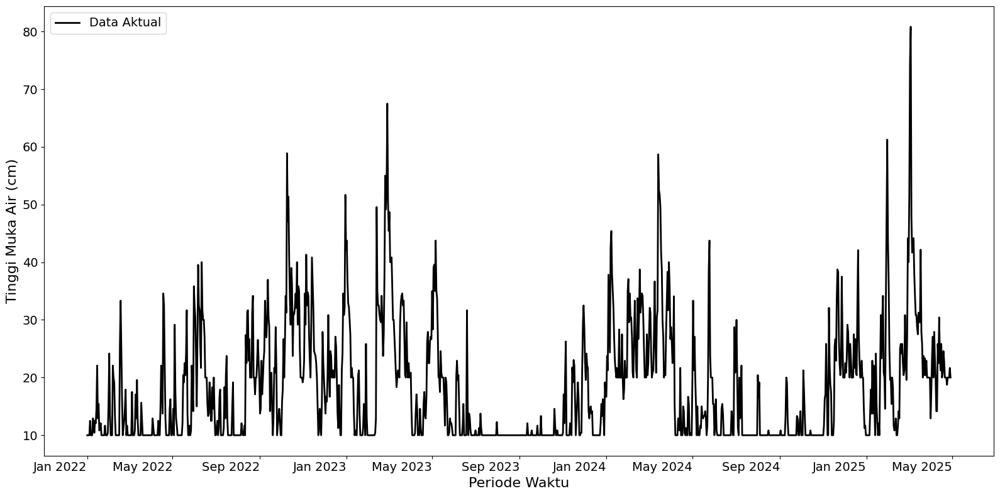

Dimension of full data: (1215, 2)


In [4]:
import matplotlib.pyplot as plt
from matplotlib.dates import MonthLocator, DateFormatter
import pandas as pd

# Pastikan kolom waktu dalam format datetime
data['Daily_Period'] = pd.to_datetime(data['Daily_Period'], format='%d/%m/%Y')

# Membuat plot seluruh data tanpa split
plt.figure(figsize=(16, 8))
plt.plot(data['Daily_Period'], data['TMA_Daily'], lw=2, color='black', label='Data Aktual')

# Label dan format
plt.xlabel('Periode Waktu', fontsize=16)
plt.ylabel('Tinggi Muka Air (cm)', fontsize=16)

plt.xticks(fontsize=14)
plt.yticks(fontsize=14)

# Set axis locator dan format tanggal
plt.gca().xaxis.set_major_locator(MonthLocator(bymonth=[1, 5, 9]))
plt.gca().xaxis.set_major_formatter(DateFormatter('%b %Y'))

# Format rotasi tanggal
plt.gcf().autofmt_xdate(rotation=0)

# Tambahkan legend
plt.legend(fontsize=14)
# plt.title('Plot Seluruh Data Time Series TMA', fontsize=18)

plt.tight_layout()
plt.show()

# Print dimensi total
print('Dimension of full data:', data.shape)

# Normalisasi Data

Proses normalisasi data dilakukan menggunakan metode min-max normalization hingga menghasilkan data yang berskala [0,1].

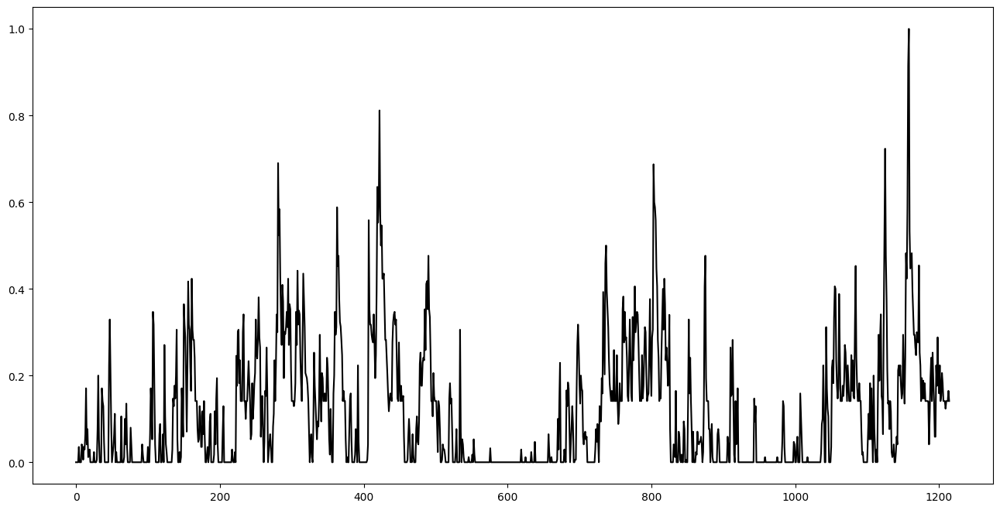

In [5]:
# Step 1: Normalize the data using Min-Max scaling
scaler = MinMaxScaler()
data['TMA_normalized'] = scaler.fit_transform(data['TMA_Daily'].values.reshape(-1, 1))
plt.figure(figsize=(16, 8))
plt.plot(data['TMA_normalized'], color='black')

In [6]:
print(data['TMA_normalized'].head())
print(data['TMA_normalized'].tail())

0    0.000000
1    0.000000
2    0.000000
3    0.000000
4    0.035294
Name: TMA_normalized, dtype: float64
1210    0.141176
1211    0.141176
1212    0.141176
1213    0.164706
1214    0.141176
Name: TMA_normalized, dtype: float64


# Hyperparameter Tuning & Cross Validation

Hyperparameter tuning dilakukan untuk menentukan hyperparameter terbaik melalui langkah validasi berupa *time series k-fold cross validation*. Banyaknya fold yang digunakan dalam langkah validasi adalah sebanyak k = 5 fold.

In [7]:
data_series = data['TMA_normalized'].values
data_series = data_series.reshape((len(data_series), 1))
data_series

array([[0.        ],
       [0.        ],
       [0.        ],
       ...,
       [0.14117647],
       [0.16470588],
       [0.14117647]])

In [8]:
from tensorflow.keras.initializers import HeUniform, GlorotUniform

def create_model(neurons, learning_rate, init_scheme='he_uniform'):
    seed = 42
    np.random.seed(seed)
    tf.random.set_seed(seed)
    random.seed(seed)

    # Pilih initializer berdasarkan parameter
    if init_scheme == 'he_uniform':
        initializer = HeUniform()
    elif init_scheme == 'glorot_uniform':
        initializer = GlorotUniform()
    else:
        raise ValueError("init_scheme harus 'he_uniform' atau 'glorot_uniform'")

    model = Sequential()
    model.add(LSTM(
        neurons,
        activation='tanh',
        input_shape=(30, 1),
        return_sequences=True,
        kernel_initializer=initializer,
        recurrent_initializer=initializer,
        bias_initializer='zeros'
    ))
    model.add(LSTM(
        16,
        activation='tanh',
        kernel_initializer=initializer,
        recurrent_initializer=initializer,
        bias_initializer='zeros'
    ))
    model.add(Dropout(0.2))
    model.add(Dense(1, kernel_initializer=initializer, bias_initializer='zeros'))

    optimizer = Adam(learning_rate=learning_rate)
    model.compile(loss='mean_squared_error', optimizer=optimizer)
    return model

In [9]:
import keras

class EarlyStoppingAtMinLoss(keras.callbacks.Callback):
    """Stop training when the loss is at its min, i.e. the loss stops decreasing.

    Arguments:
        patience: Number of epochs to wait after min has been hit. After this
        number of no improvement, training stops.
    """

    def __init__(self, patience=0):
        super().__init__()
        self.patience = patience
        # best_weights to store the weights at which the minimum loss occurs.
        self.best_weights = None

    def on_train_begin(self, logs=None):
        # The number of epoch it has waited when loss is no longer minimum.
        self.wait = 0
        # The epoch the training stops at.
        self.stopped_epoch = 0
        # Initialize the best as infinity.
        self.best = np.inf

    def on_epoch_end(self, epoch, logs=None):
        current = logs.get("val_loss")
        if np.less(current, self.best):
            self.best = current
            self.wait = 0
            # print('abcd')
            # Record the best weights if current results is better (less).
            self.best_weights = self.model.get_weights()
        else:
            self.wait += 1
            if self.wait >= self.patience:
                self.stopped_epoch = epoch
                self.model.stop_training = True
                print("Restoring model weights from the end of the best epoch.")
                self.model.set_weights(self.best_weights)

    def on_train_end(self, logs=None):
        if self.stopped_epoch > 0:
            print("Epoch %05d: early stopping" % (self.stopped_epoch + 1))

## Expanding Window Cross Validation

/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


Epoch 1/100
6/6 ━━━━━━━━━━━━━━━━━━━━ 6s 189ms/step - loss: 0.1732 - val_loss: 0.1220
Epoch 2/100
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.0460 - val_loss: 0.1296
Epoch 3/100
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 0.0765 - val_loss: 0.0478
Epoch 4/100
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.0313 - val_loss: 0.0536
Epoch 5/100
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.0361 - val_loss: 0.0550
Epoch 6/100
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step - loss: 0.0550 - val_loss: 0.0429
Epoch 7/100
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.0189 - val_loss: 0.0244
Epoch 8/100
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - loss: 0.0157 - val_loss: 0.0141
Epoch 9/100
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - loss: 0.0115 - val_loss: 0.0171
Epoch 10/100
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - loss: 0.0118 - val_loss: 0.0265
Epoch 11/100
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step - loss: 0.0137 - val_loss: 0.0221
Epoch 12/100
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step - loss: 0.0106 - val_l

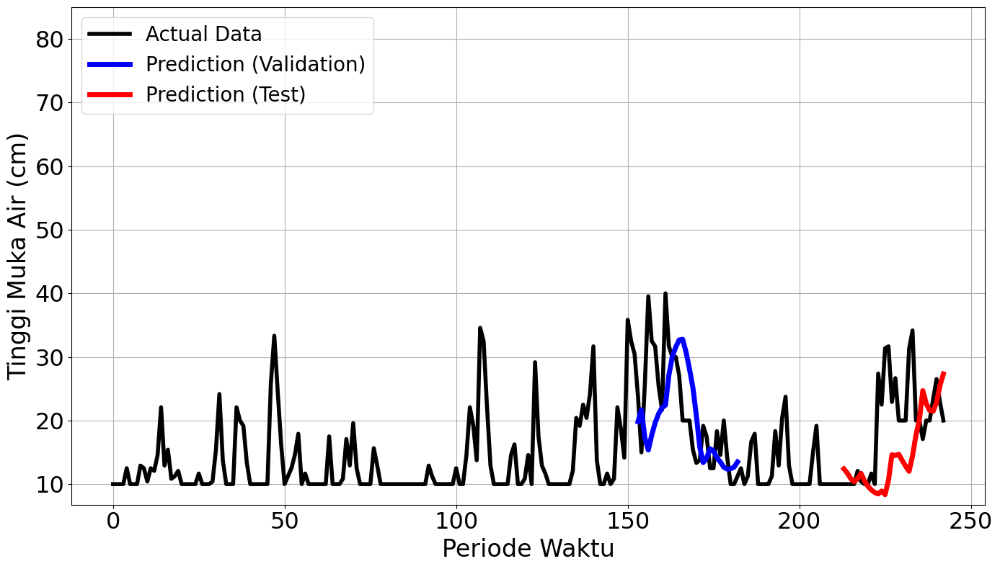

Epoch 1/100


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


21/21 ━━━━━━━━━━━━━━━━━━━━ 4s 48ms/step - loss: 0.1198 - val_loss: 0.0535
Epoch 2/100
21/21 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step - loss: 0.0569 - val_loss: 0.0333
Epoch 3/100
21/21 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step - loss: 0.0369 - val_loss: 0.0463
Epoch 4/100
21/21 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step - loss: 0.0295 - val_loss: 0.0328
Epoch 5/100
21/21 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.0218 - val_loss: 0.0393
Epoch 6/100
21/21 ━━━━━━━━━━━━━━━━━━━━ 1s 39ms/step - loss: 0.0240 - val_loss: 0.0402
Epoch 7/100
21/21 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step - loss: 0.0191 - val_loss: 0.0354
Epoch 8/100
21/21 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.0150 - val_loss: 0.0400
Epoch 9/100
21/21 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step - loss: 0.0153 - val_loss: 0.0297
Epoch 10/100
21/21 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step - loss: 0.0148 - val_loss: 0.0341
Epoch 11/100
21/21 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.0135 - val_loss: 0.0307
Epoch 12/100
21/21 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step - loss: 0.0

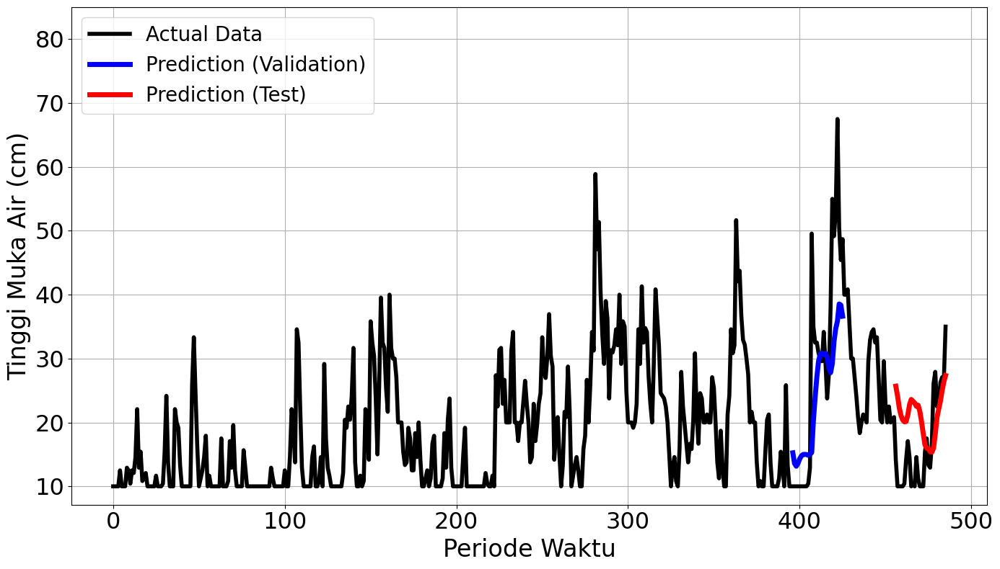

/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Epoch 1/100


/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


37/37 ━━━━━━━━━━━━━━━━━━━━ 5s 49ms/step - loss: 0.1241 - val_loss: 0.0010
Epoch 2/100
37/37 ━━━━━━━━━━━━━━━━━━━━ 2s 26ms/step - loss: 0.0329 - val_loss: 4.7524e-04
Epoch 3/100
37/37 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step - loss: 0.0212 - val_loss: 4.7075e-04
Epoch 4/100
37/37 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step - loss: 0.0139 - val_loss: 3.7025e-04
Epoch 5/100
37/37 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.0143 - val_loss: 2.9530e-04
Epoch 6/100
37/37 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step - loss: 0.0117 - val_loss: 0.0014
Epoch 7/100
37/37 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step - loss: 0.0091 - val_loss: 2.0099e-04
Epoch 8/100
37/37 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step - loss: 0.0109 - val_loss: 2.8685e-04
Epoch 9/100
37/37 ━━━━━━━━━━━━━━━━━━━━ 1s 26ms/step - loss: 0.0090 - val_loss: 2.3671e-04
Epoch 10/100
37/37 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.0092 - val_loss: 2.9887e-04
Epoch 11/100
37/37 ━━━━━━━━━━━━━━━━━━━━ 2s 32ms/step - loss: 0.0098 - val_loss: 5.3496e-04
Epoch 12/100
37/37 ━━━━━━━━━

1/2 ━━━━━━━━━━━━━━━━━━━━ 0s 458ms/step

2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 450ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
mape validation = 4.230863050029237 %
mape test = 24.541862834005293 %


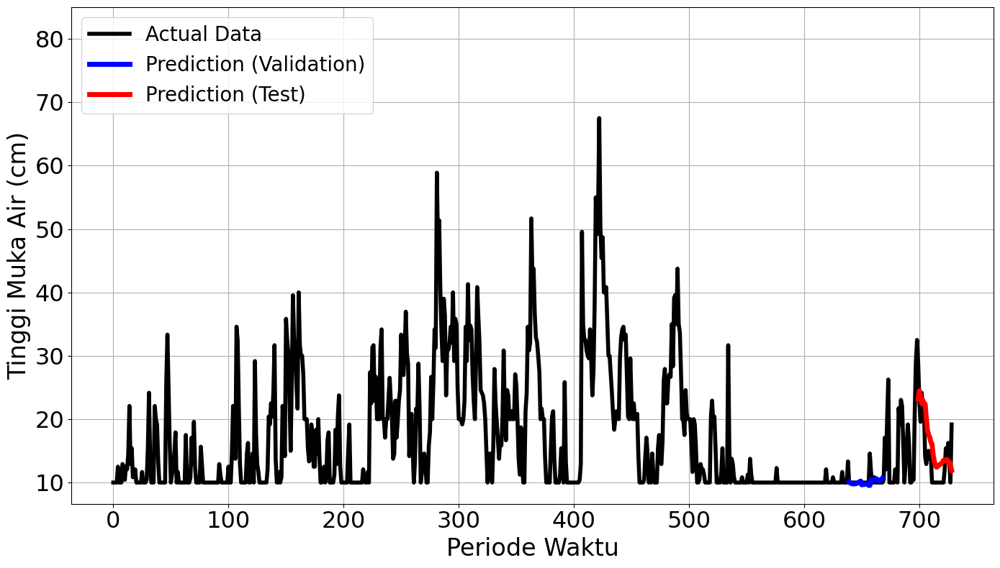

Epoch 1/100


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


52/52 ━━━━━━━━━━━━━━━━━━━━ 5s 34ms/step - loss: 0.1359 - val_loss: 0.0129
Epoch 2/100
52/52 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step - loss: 0.0321 - val_loss: 0.0049
Epoch 3/100
52/52 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.0219 - val_loss: 0.0038
Epoch 4/100
52/52 ━━━━━━━━━━━━━━━━━━━━ 3s 32ms/step - loss: 0.0178 - val_loss: 0.0036
Epoch 5/100
52/52 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step - loss: 0.0125 - val_loss: 0.0038
Epoch 6/100
52/52 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.0092 - val_loss: 0.0043
Epoch 7/100
52/52 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.0108 - val_loss: 0.0036
Epoch 8/100
52/52 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.0124 - val_loss: 0.0034
Epoch 9/100
52/52 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step - loss: 0.0103 - val_loss: 0.0038
Epoch 10/100
52/52 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - loss: 0.0097 - val_loss: 0.0040
Epoch 11/100
52/52 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.0088 - val_loss: 0.0027
Epoch 12/100
52/52 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step - loss: 0.0

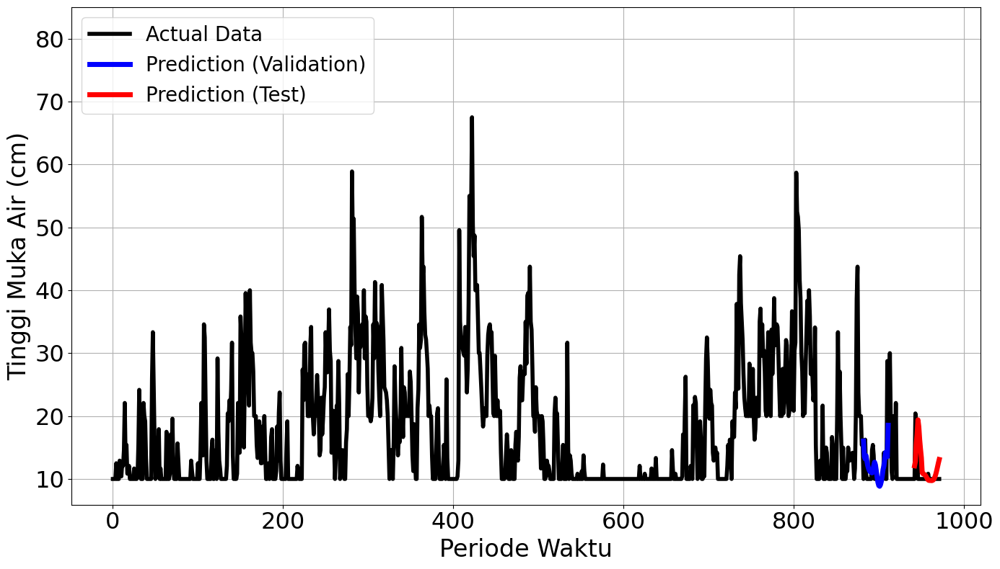

Epoch 1/100


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


67/67 ━━━━━━━━━━━━━━━━━━━━ 7s 32ms/step - loss: 0.0876 - val_loss: 0.0190
Epoch 2/100
67/67 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step - loss: 0.0249 - val_loss: 0.0184
Epoch 3/100
67/67 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.0142 - val_loss: 0.0159
Epoch 4/100
67/67 ━━━━━━━━━━━━━━━━━━━━ 2s 30ms/step - loss: 0.0136 - val_loss: 0.0151
Epoch 5/100
67/67 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.0103 - val_loss: 0.0155
Epoch 6/100
67/67 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.0106 - val_loss: 0.0166
Epoch 7/100
67/67 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.0105 - val_loss: 0.0146
Epoch 8/100
67/67 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step - loss: 0.0095 - val_loss: 0.0144
Epoch 9/100
67/67 ━━━━━━━━━━━━━━━━━━━━ 2s 30ms/step - loss: 0.0078 - val_loss: 0.0134
Epoch 10/100
67/67 ━━━━━━━━━━━━━━━━━━━━ 3s 32ms/step - loss: 0.0074 - val_loss: 0.0134
Epoch 11/100
67/67 ━━━━━━━━━━━━━━━━━━━━ 2s 26ms/step - loss: 0.0081 - val_loss: 0.0146
Epoch 12/100
67/67 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step - loss: 0.0

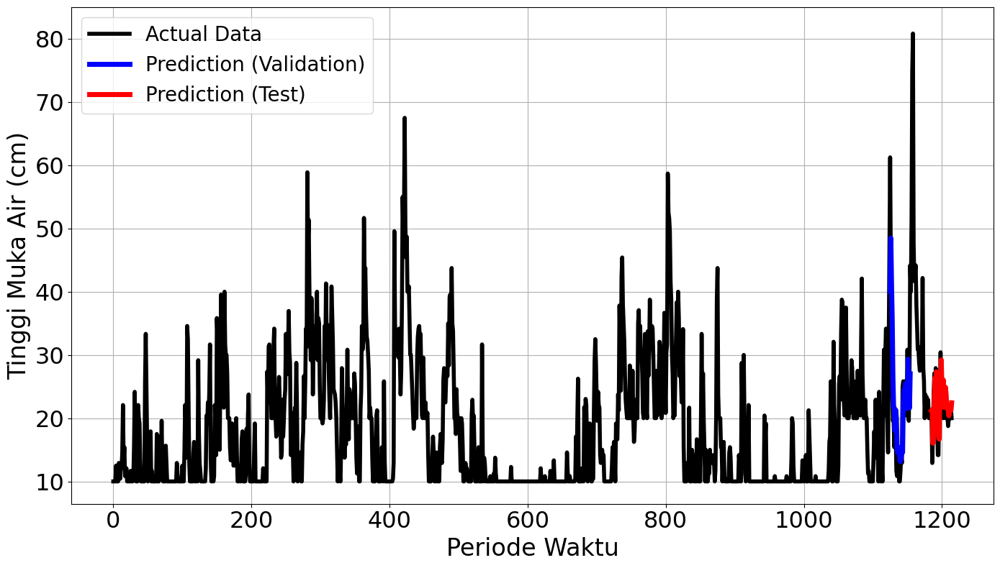

<Figure size 640x480 with 0 Axes>


Final Average MAPE Validation: 0.2135
Final Average MAPE Test: 0.2983
Epoch 1/100


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


6/6 ━━━━━━━━━━━━━━━━━━━━ 5s 127ms/step - loss: 0.1732 - val_loss: 0.1220
Epoch 2/100
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 33ms/step - loss: 0.0460 - val_loss: 0.1296
Epoch 3/100
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step - loss: 0.0765 - val_loss: 0.0478
Epoch 4/100
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.0313 - val_loss: 0.0536
Epoch 5/100
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step - loss: 0.0361 - val_loss: 0.0550
Epoch 6/100
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.0550 - val_loss: 0.0429
Epoch 7/100
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step - loss: 0.0189 - val_loss: 0.0244
Epoch 8/100
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step - loss: 0.0157 - val_loss: 0.0141
Epoch 9/100
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.0115 - val_loss: 0.0171
Epoch 10/100
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step - loss: 0.0118 - val_loss: 0.0265
Epoch 11/100
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step - loss: 0.0137 - val_loss: 0.0221
Epoch 12/100
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step - loss: 0.0106 - val_loss: 0.0235


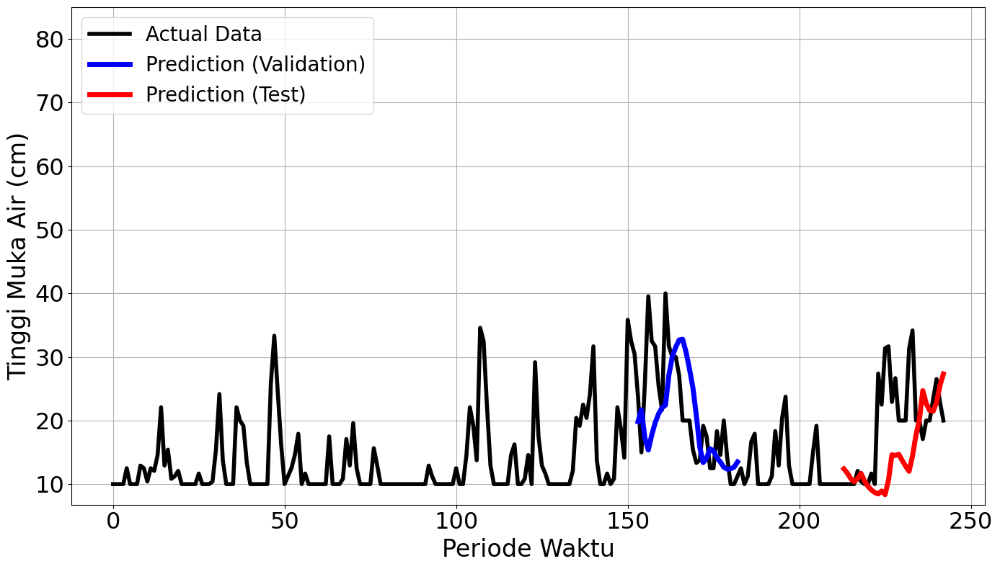

Epoch 1/100


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


21/21 ━━━━━━━━━━━━━━━━━━━━ 4s 50ms/step - loss: 0.1198 - val_loss: 0.0535
Epoch 2/100
21/21 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step - loss: 0.0569 - val_loss: 0.0333
Epoch 3/100
21/21 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.0369 - val_loss: 0.0463
Epoch 4/100
21/21 ━━━━━━━━━━━━━━━━━━━━ 1s 26ms/step - loss: 0.0295 - val_loss: 0.0328
Epoch 5/100
21/21 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step - loss: 0.0218 - val_loss: 0.0393
Epoch 6/100
21/21 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.0240 - val_loss: 0.0402
Epoch 7/100
21/21 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step - loss: 0.0191 - val_loss: 0.0354
Epoch 8/100
21/21 ━━━━━━━━━━━━━━━━━━━━ 1s 26ms/step - loss: 0.0150 - val_loss: 0.0400
Epoch 9/100
21/21 ━━━━━━━━━━━━━━━━━━━━ 1s 32ms/step - loss: 0.0153 - val_loss: 0.0297
Epoch 10/100
21/21 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.0148 - val_loss: 0.0341
Epoch 11/100
21/21 ━━━━━━━━━━━━━━━━━━━━ 1s 30ms/step - loss: 0.0135 - val_loss: 0.0307
Epoch 12/100
21/21 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.0

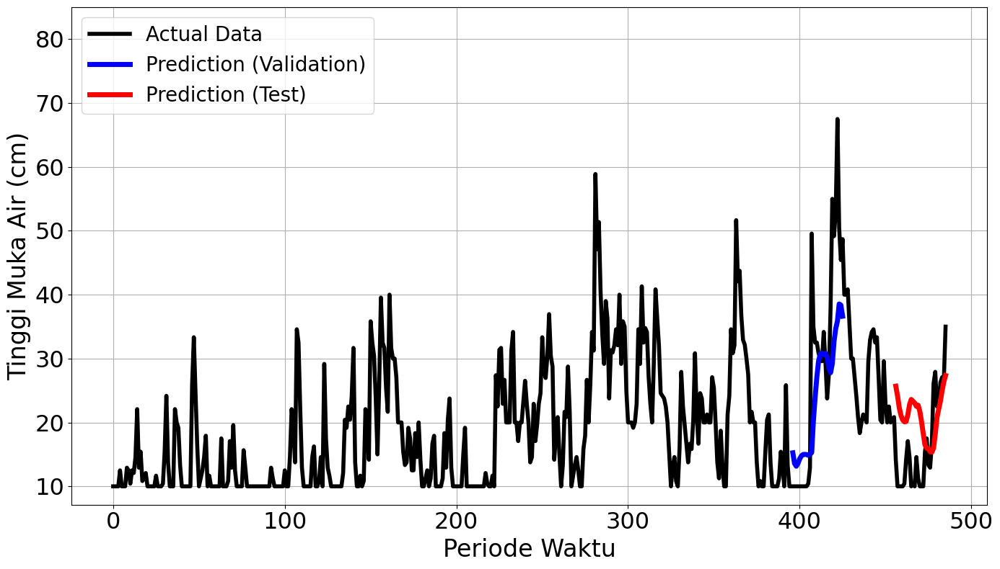

Epoch 1/100


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


37/37 ━━━━━━━━━━━━━━━━━━━━ 5s 39ms/step - loss: 0.1241 - val_loss: 0.0010
Epoch 2/100
37/37 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.0329 - val_loss: 4.7524e-04
Epoch 3/100
37/37 ━━━━━━━━━━━━━━━━━━━━ 2s 26ms/step - loss: 0.0212 - val_loss: 4.7075e-04
Epoch 4/100
37/37 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step - loss: 0.0139 - val_loss: 3.7025e-04
Epoch 5/100
37/37 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step - loss: 0.0143 - val_loss: 2.9530e-04
Epoch 6/100
37/37 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step - loss: 0.0117 - val_loss: 0.0014
Epoch 7/100
37/37 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step - loss: 0.0091 - val_loss: 2.0099e-04
Epoch 8/100
37/37 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.0109 - val_loss: 2.8685e-04
Epoch 9/100
37/37 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step - loss: 0.0090 - val_loss: 2.3671e-04
Epoch 10/100
37/37 ━━━━━━━━━━━━━━━━━━━━ 1s 26ms/step - loss: 0.0092 - val_loss: 2.9887e-04
Epoch 11/100
37/37 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.0098 - val_loss: 5.3496e-04
Epoch 12/100
37/37 ━━━━━━━━━

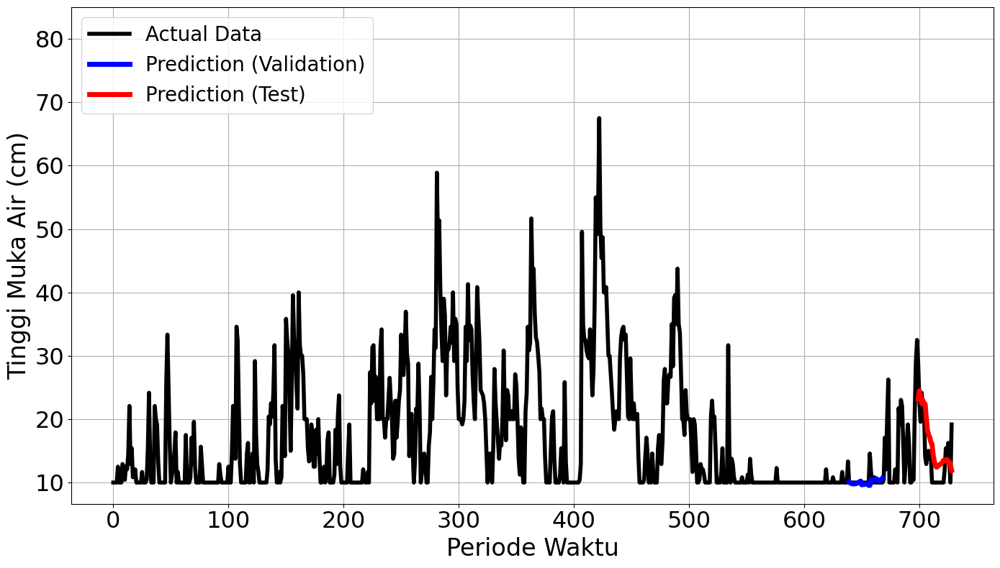

Epoch 1/100


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


52/52 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - loss: 0.1359 - val_loss: 0.0129
Epoch 2/100
52/52 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step - loss: 0.0321 - val_loss: 0.0049
Epoch 3/100
52/52 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.0219 - val_loss: 0.0038
Epoch 4/100
52/52 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - loss: 0.0178 - val_loss: 0.0036
Epoch 5/100
52/52 ━━━━━━━━━━━━━━━━━━━━ 2s 32ms/step - loss: 0.0125 - val_loss: 0.0038
Epoch 6/100
52/52 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 0.0092 - val_loss: 0.0043
Epoch 7/100
52/52 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step - loss: 0.0108 - val_loss: 0.0036
Epoch 8/100
52/52 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.0124 - val_loss: 0.0034
Epoch 9/100
52/52 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - loss: 0.0103 - val_loss: 0.0038
Epoch 10/100
52/52 ━━━━━━━━━━━━━━━━━━━━ 2s 31ms/step - loss: 0.0097 - val_loss: 0.0040
Epoch 11/100
52/52 ━━━━━━━━━━━━━━━━━━━━ 3s 34ms/step - loss: 0.0088 - val_loss: 0.0027
Epoch 12/100
52/52 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step - loss: 0.0

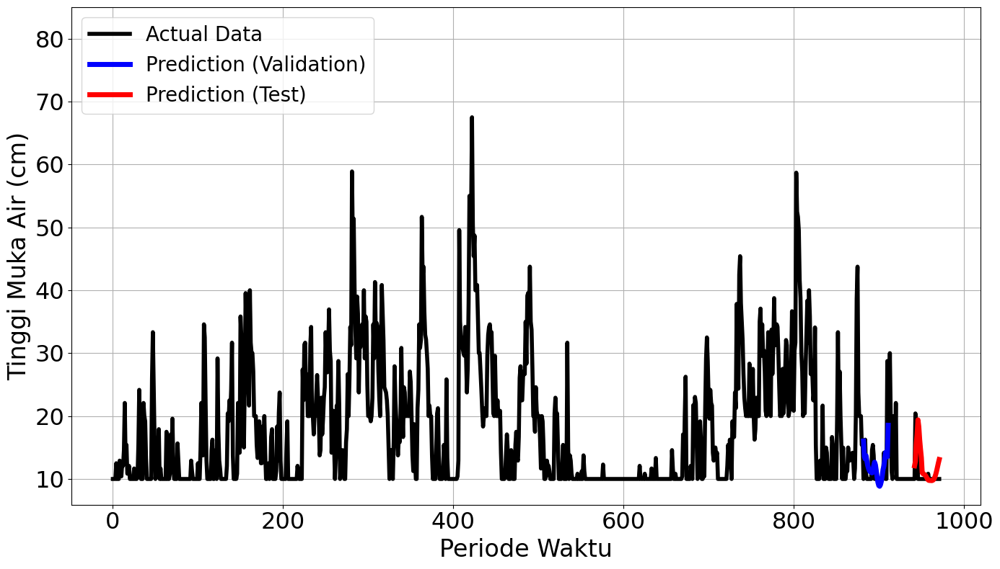

Epoch 1/100


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


67/67 ━━━━━━━━━━━━━━━━━━━━ 7s 35ms/step - loss: 0.0876 - val_loss: 0.0190
Epoch 2/100
67/67 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0249 - val_loss: 0.0184
Epoch 3/100
67/67 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - loss: 0.0142 - val_loss: 0.0159
Epoch 4/100
67/67 ━━━━━━━━━━━━━━━━━━━━ 3s 35ms/step - loss: 0.0136 - val_loss: 0.0151
Epoch 5/100
67/67 ━━━━━━━━━━━━━━━━━━━━ 2s 31ms/step - loss: 0.0103 - val_loss: 0.0155
Epoch 6/100
67/67 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.0106 - val_loss: 0.0166
Epoch 7/100
67/67 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.0105 - val_loss: 0.0146
Epoch 8/100
67/67 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.0095 - val_loss: 0.0144
Epoch 9/100
67/67 ━━━━━━━━━━━━━━━━━━━━ 3s 32ms/step - loss: 0.0078 - val_loss: 0.0134
Epoch 10/100
67/67 ━━━━━━━━━━━━━━━━━━━━ 3s 35ms/step - loss: 0.0074 - val_loss: 0.0134
Epoch 11/100
67/67 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - loss: 0.0081 - val_loss: 0.0146
Epoch 12/100
67/67 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.0

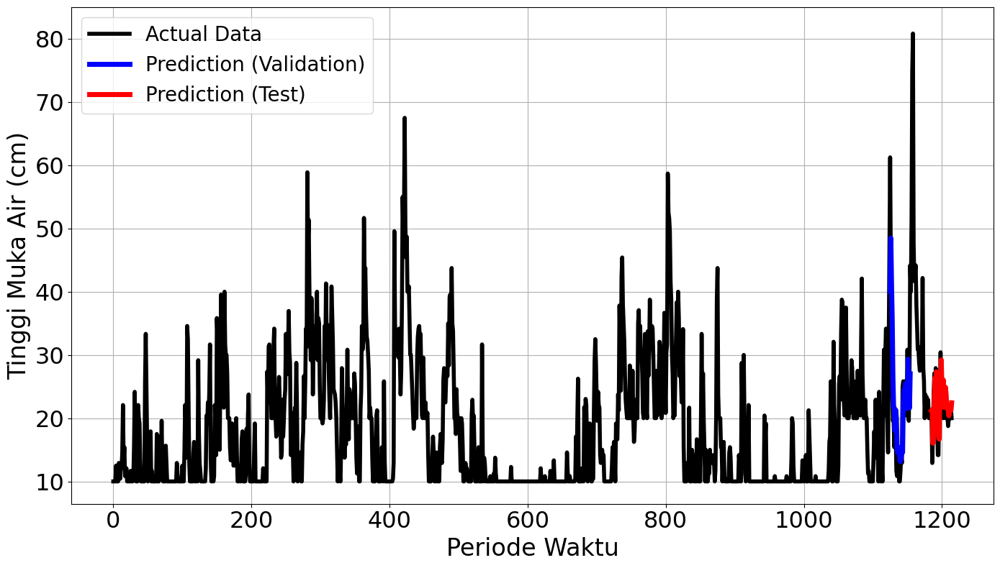

<Figure size 640x480 with 0 Axes>


Final Average MAPE Validation: 0.2135
Final Average MAPE Test: 0.2983
Epoch 1/100


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


3/3 ━━━━━━━━━━━━━━━━━━━━ 4s 280ms/step - loss: 0.1607 - val_loss: 0.1246
Epoch 2/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step - loss: 0.0764 - val_loss: 0.1737
Epoch 3/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step - loss: 0.0428 - val_loss: 0.1461
Epoch 4/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step - loss: 0.0443 - val_loss: 0.1003
Epoch 5/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step - loss: 0.0329 - val_loss: 0.0767
Epoch 6/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step - loss: 0.0295 - val_loss: 0.0784
Epoch 7/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step - loss: 0.0316 - val_loss: 0.0803
Epoch 8/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 75ms/step - loss: 0.0303 - val_loss: 0.0627
Epoch 9/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step - loss: 0.0282 - val_loss: 0.0455
Epoch 10/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step - loss: 0.0208 - val_loss: 0.0326
Epoch 11/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 75ms/step - loss: 0.0294 - val_loss: 0.0299
Epoch 12/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step - loss: 0.0276 - val_loss: 0.0316


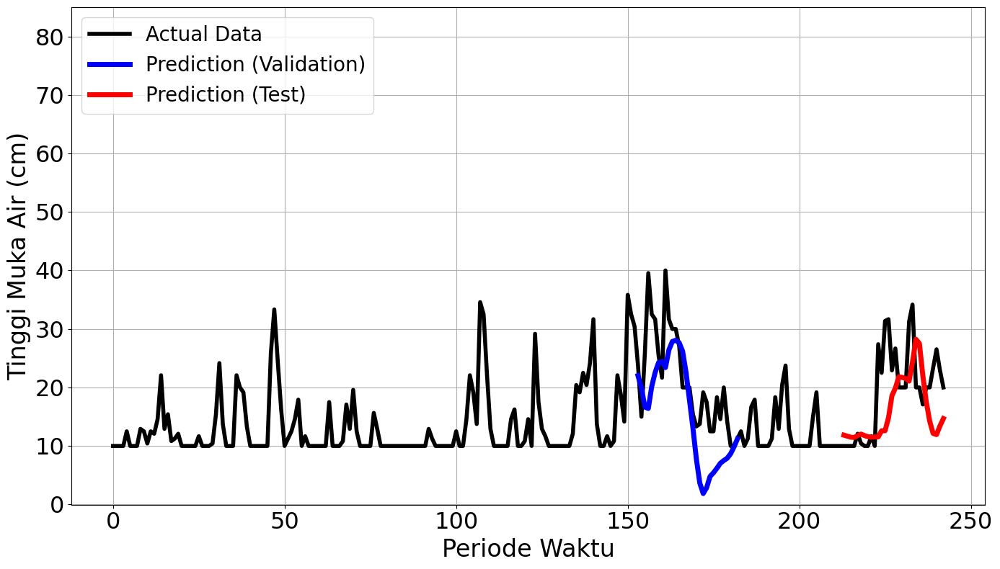

Epoch 1/100


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


11/11 ━━━━━━━━━━━━━━━━━━━━ 5s 83ms/step - loss: 0.1610 - val_loss: 0.0236
Epoch 2/100
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step - loss: 0.0797 - val_loss: 0.0304
Epoch 3/100
11/11 ━━━━━━━━━━━━━━━━━━━━ 1s 33ms/step - loss: 0.0545 - val_loss: 0.0351
Epoch 4/100
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step - loss: 0.0549 - val_loss: 0.0337
Epoch 5/100
11/11 ━━━━━━━━━━━━━━━━━━━━ 1s 34ms/step - loss: 0.0361 - val_loss: 0.0291
Epoch 6/100
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.0293Restoring model weights from the end of the best epoch.
11/11 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.0291 - val_loss: 0.0279
Epoch 00006: early stopping
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 317ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
mape validation = 42.47331692984873 %
mape test = 46.37624438201364 %


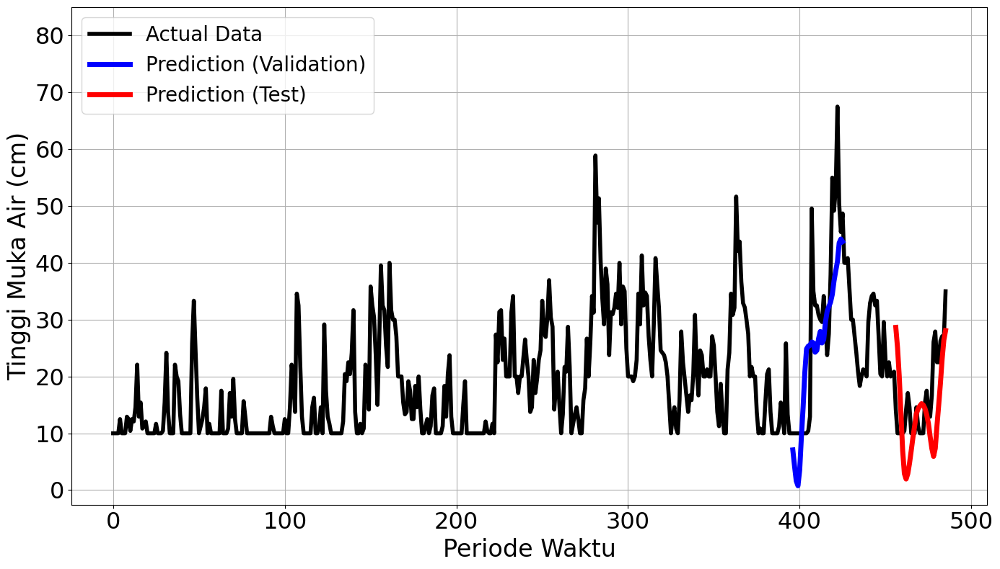

Epoch 1/100


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


19/19 ━━━━━━━━━━━━━━━━━━━━ 5s 74ms/step - loss: 0.1779 - val_loss: 0.0144
Epoch 2/100
19/19 ━━━━━━━━━━━━━━━━━━━━ 2s 33ms/step - loss: 0.0685 - val_loss: 4.4222e-04
Epoch 3/100
19/19 ━━━━━━━━━━━━━━━━━━━━ 1s 34ms/step - loss: 0.0463 - val_loss: 3.1716e-04
Epoch 4/100
19/19 ━━━━━━━━━━━━━━━━━━━━ 1s 32ms/step - loss: 0.0343 - val_loss: 4.0033e-04
Epoch 5/100
19/19 ━━━━━━━━━━━━━━━━━━━━ 1s 34ms/step - loss: 0.0277 - val_loss: 4.0133e-04
Epoch 6/100
19/19 ━━━━━━━━━━━━━━━━━━━━ 1s 32ms/step - loss: 0.0199 - val_loss: 3.6472e-04
Epoch 7/100
19/19 ━━━━━━━━━━━━━━━━━━━━ 1s 34ms/step - loss: 0.0157 - val_loss: 1.7806e-04
Epoch 8/100
19/19 ━━━━━━━━━━━━━━━━━━━━ 1s 32ms/step - loss: 0.0116 - val_loss: 1.9530e-04
Epoch 9/100
19/19 ━━━━━━━━━━━━━━━━━━━━ 1s 34ms/step - loss: 0.0122 - val_loss: 4.4526e-04
Epoch 10/100
19/19 ━━━━━━━━━━━━━━━━━━━━ 1s 33ms/step - loss: 0.0110 - val_loss: 2.3756e-04
Epoch 11/100
19/19 ━━━━━━━━━━━━━━━━━━━━ 1s 33ms/step - loss: 0.0092 - val_loss: 3.6680e-04
Epoch 12/100
19/19 ━━━━━

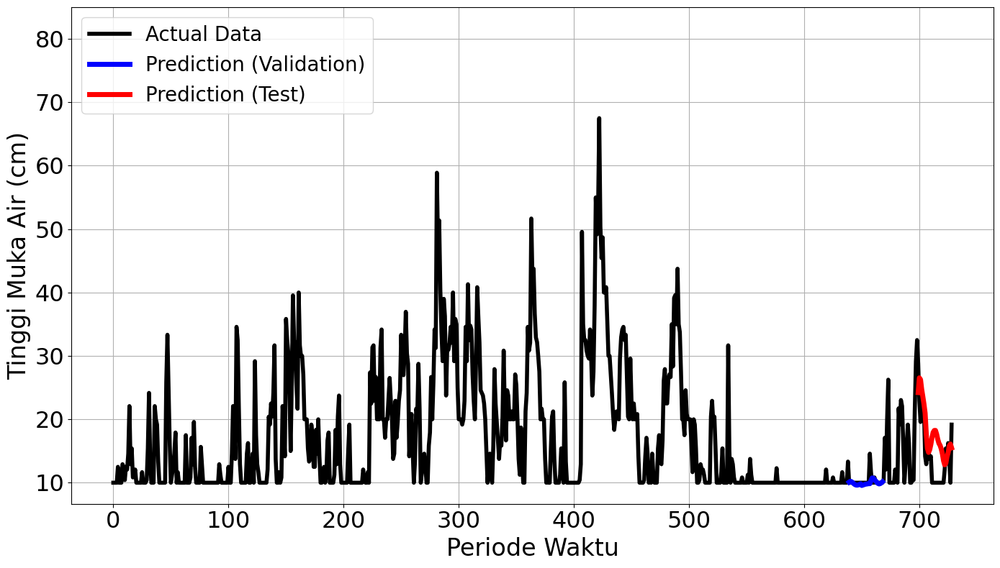

Epoch 1/100


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


26/26 ━━━━━━━━━━━━━━━━━━━━ 6s 78ms/step - loss: 0.0725 - val_loss: 0.0254
Epoch 2/100
26/26 ━━━━━━━━━━━━━━━━━━━━ 1s 33ms/step - loss: 0.0453 - val_loss: 0.0101
Epoch 3/100
26/26 ━━━━━━━━━━━━━━━━━━━━ 1s 32ms/step - loss: 0.0235 - val_loss: 0.0124
Epoch 4/100
26/26 ━━━━━━━━━━━━━━━━━━━━ 1s 33ms/step - loss: 0.0188 - val_loss: 0.0071
Epoch 5/100
26/26 ━━━━━━━━━━━━━━━━━━━━ 1s 33ms/step - loss: 0.0136 - val_loss: 0.0050
Epoch 6/100
26/26 ━━━━━━━━━━━━━━━━━━━━ 1s 34ms/step - loss: 0.0139 - val_loss: 0.0043
Epoch 7/100
26/26 ━━━━━━━━━━━━━━━━━━━━ 1s 43ms/step - loss: 0.0120 - val_loss: 0.0049
Epoch 8/100
26/26 ━━━━━━━━━━━━━━━━━━━━ 1s 48ms/step - loss: 0.0138 - val_loss: 0.0029
Epoch 9/100
26/26 ━━━━━━━━━━━━━━━━━━━━ 1s 45ms/step - loss: 0.0105 - val_loss: 0.0058
Epoch 10/100
26/26 ━━━━━━━━━━━━━━━━━━━━ 1s 39ms/step - loss: 0.0095 - val_loss: 0.0034
Epoch 11/100
26/26 ━━━━━━━━━━━━━━━━━━━━ 1s 33ms/step - loss: 0.0084 - val_loss: 0.0032
Epoch 12/100
26/26 ━━━━━━━━━━━━━━━━━━━━ 1s 32ms/step - loss: 0.0

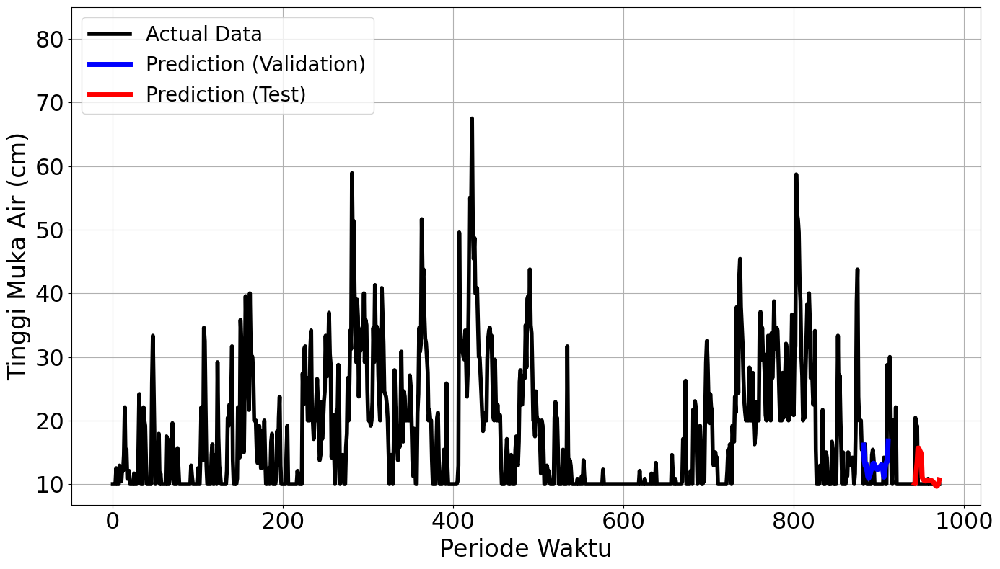

Epoch 1/100


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


34/34 ━━━━━━━━━━━━━━━━━━━━ 5s 46ms/step - loss: 0.1316 - val_loss: 0.0364
Epoch 2/100
34/34 ━━━━━━━━━━━━━━━━━━━━ 3s 45ms/step - loss: 0.0369 - val_loss: 0.0212
Epoch 3/100
34/34 ━━━━━━━━━━━━━━━━━━━━ 1s 39ms/step - loss: 0.0262 - val_loss: 0.0234
Epoch 4/100
34/34 ━━━━━━━━━━━━━━━━━━━━ 1s 32ms/step - loss: 0.0156 - val_loss: 0.0222
Epoch 5/100
34/34 ━━━━━━━━━━━━━━━━━━━━ 1s 34ms/step - loss: 0.0142 - val_loss: 0.0169
Epoch 6/100
34/34 ━━━━━━━━━━━━━━━━━━━━ 1s 33ms/step - loss: 0.0100 - val_loss: 0.0201
Epoch 7/100
34/34 ━━━━━━━━━━━━━━━━━━━━ 1s 33ms/step - loss: 0.0115 - val_loss: 0.0171
Epoch 8/100
34/34 ━━━━━━━━━━━━━━━━━━━━ 1s 32ms/step - loss: 0.0093 - val_loss: 0.0180
Epoch 9/100
34/34 ━━━━━━━━━━━━━━━━━━━━ 1s 33ms/step - loss: 0.0085 - val_loss: 0.0171
Epoch 10/100
33/34 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.0093Restoring model weights from the end of the best epoch.
34/34 ━━━━━━━━━━━━━━━━━━━━ 1s 33ms/step - loss: 0.0093 - val_loss: 0.0181
Epoch 00010: early stopping
1/1 ━━━━━━━━━

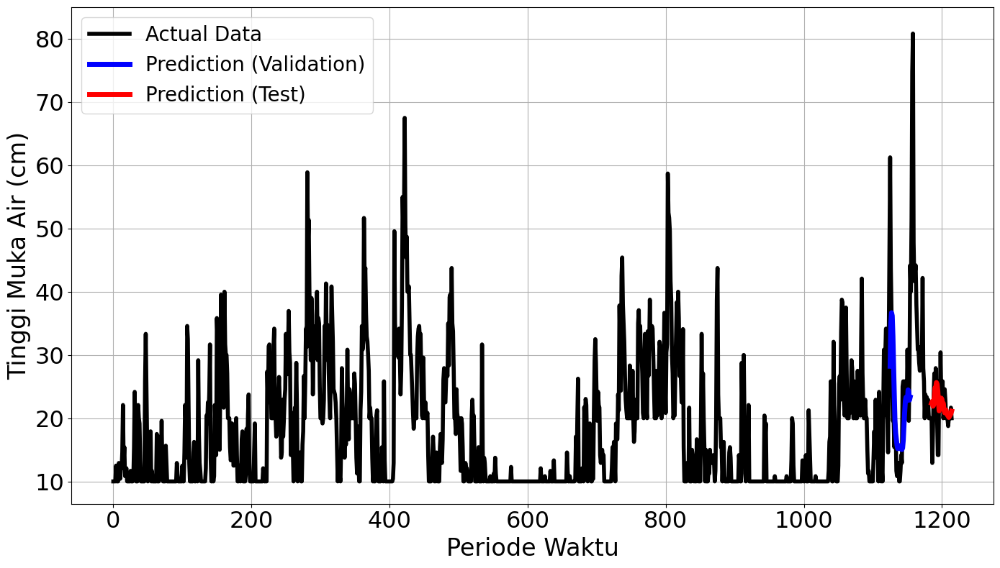

<Figure size 640x480 with 0 Axes>


Final Average MAPE Validation: 0.2619
Final Average MAPE Test: 0.2790
Epoch 1/100


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


3/3 ━━━━━━━━━━━━━━━━━━━━ 5s 301ms/step - loss: 0.1607 - val_loss: 0.1246
Epoch 2/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 63ms/step - loss: 0.0764 - val_loss: 0.1737
Epoch 3/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step - loss: 0.0428 - val_loss: 0.1461
Epoch 4/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step - loss: 0.0443 - val_loss: 0.1003
Epoch 5/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.0329 - val_loss: 0.0767
Epoch 6/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - loss: 0.0295 - val_loss: 0.0784
Epoch 7/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step - loss: 0.0316 - val_loss: 0.0803
Epoch 8/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step - loss: 0.0303 - val_loss: 0.0627
Epoch 9/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 75ms/step - loss: 0.0282 - val_loss: 0.0455
Epoch 10/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step - loss: 0.0208 - val_loss: 0.0326
Epoch 11/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step - loss: 0.0294 - val_loss: 0.0299
Epoch 12/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step - loss: 0.0276 - val_loss: 0.0316


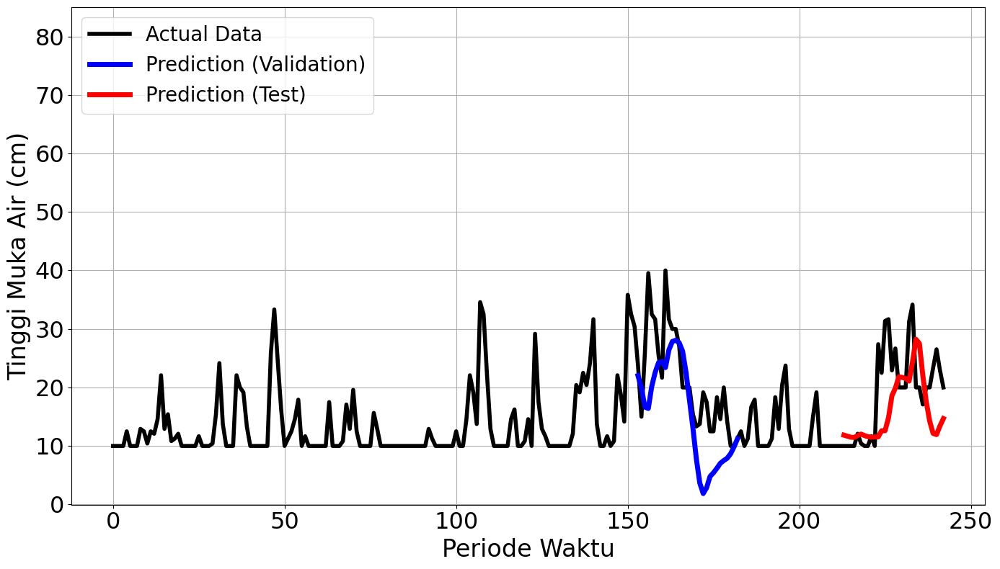

Epoch 1/100


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


11/11 ━━━━━━━━━━━━━━━━━━━━ 5s 82ms/step - loss: 0.1610 - val_loss: 0.0236
Epoch 2/100
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step - loss: 0.0797 - val_loss: 0.0304
Epoch 3/100
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step - loss: 0.0545 - val_loss: 0.0351
Epoch 4/100
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step - loss: 0.0549 - val_loss: 0.0337
Epoch 5/100
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step - loss: 0.0361 - val_loss: 0.0291
Epoch 6/100
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step - loss: 0.0293Restoring model weights from the end of the best epoch.
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step - loss: 0.0291 - val_loss: 0.0279
Epoch 00006: early stopping
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 365ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step
mape validation = 42.47331692984873 %
mape test = 46.37624438201364 %


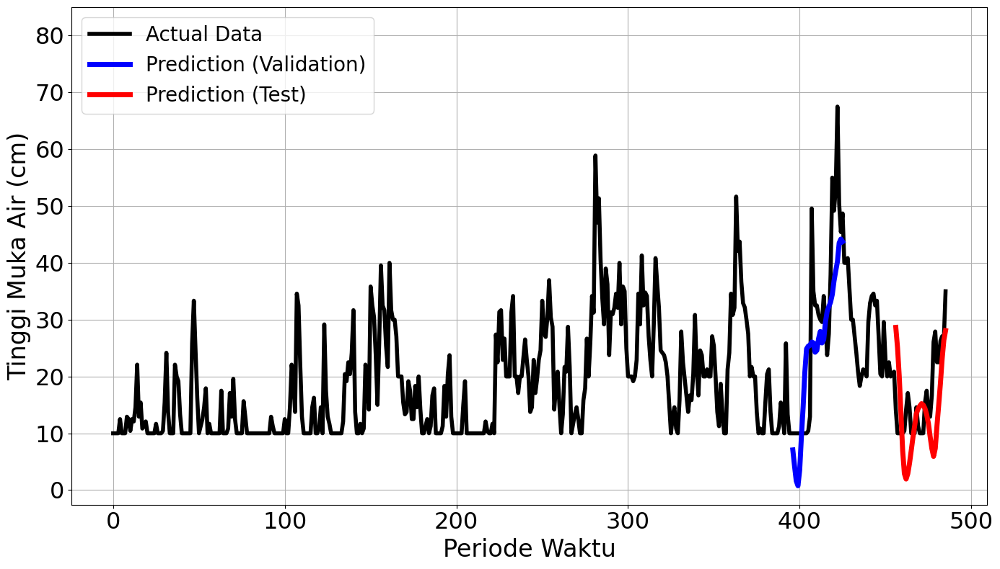

Epoch 1/100


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


19/19 ━━━━━━━━━━━━━━━━━━━━ 5s 62ms/step - loss: 0.1779 - val_loss: 0.0144
Epoch 2/100
19/19 ━━━━━━━━━━━━━━━━━━━━ 1s 45ms/step - loss: 0.0685 - val_loss: 4.4222e-04
Epoch 3/100
19/19 ━━━━━━━━━━━━━━━━━━━━ 1s 46ms/step - loss: 0.0463 - val_loss: 3.1716e-04
Epoch 4/100
19/19 ━━━━━━━━━━━━━━━━━━━━ 1s 49ms/step - loss: 0.0343 - val_loss: 4.0033e-04
Epoch 5/100
19/19 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - loss: 0.0277 - val_loss: 4.0133e-04
Epoch 6/100
19/19 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - loss: 0.0199 - val_loss: 3.6472e-04
Epoch 7/100
19/19 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - loss: 0.0157 - val_loss: 1.7806e-04
Epoch 8/100
19/19 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.0116 - val_loss: 1.9530e-04
Epoch 9/100
19/19 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - loss: 0.0122 - val_loss: 4.4526e-04
Epoch 10/100
19/19 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.0110 - val_loss: 2.3756e-04
Epoch 11/100
19/19 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - loss: 0.0092 - val_loss: 3.6680e-04
Epoch 12/100
18/19 ━━━━━

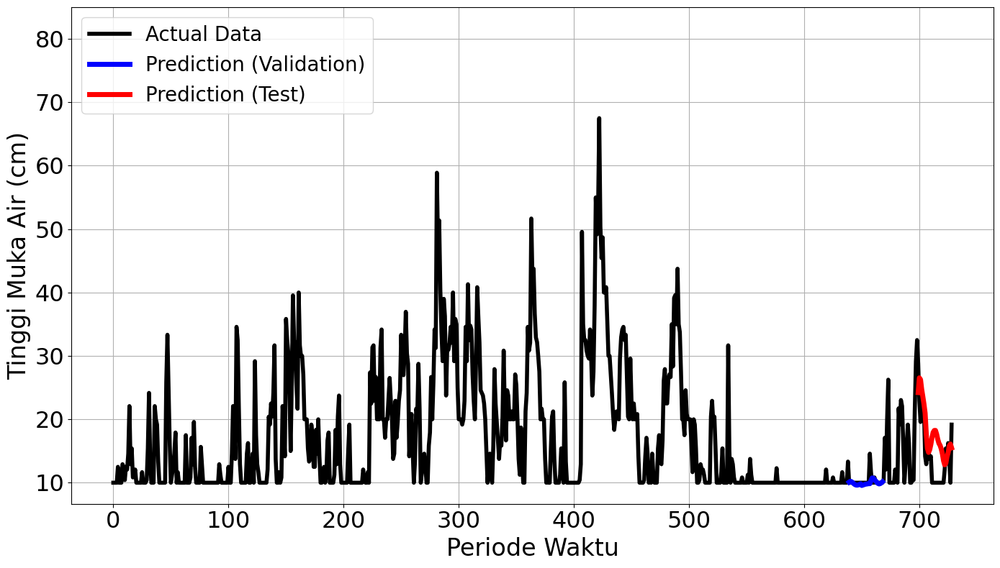

Epoch 1/100


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


26/26 ━━━━━━━━━━━━━━━━━━━━ 5s 53ms/step - loss: 0.0725 - val_loss: 0.0254
Epoch 2/100
26/26 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - loss: 0.0453 - val_loss: 0.0101
Epoch 3/100
26/26 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - loss: 0.0235 - val_loss: 0.0124
Epoch 4/100
26/26 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.0188 - val_loss: 0.0071
Epoch 5/100
26/26 ━━━━━━━━━━━━━━━━━━━━ 1s 35ms/step - loss: 0.0136 - val_loss: 0.0050
Epoch 6/100
26/26 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - loss: 0.0139 - val_loss: 0.0043
Epoch 7/100
26/26 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - loss: 0.0120 - val_loss: 0.0049
Epoch 8/100
26/26 ━━━━━━━━━━━━━━━━━━━━ 1s 47ms/step - loss: 0.0138 - val_loss: 0.0029
Epoch 9/100
26/26 ━━━━━━━━━━━━━━━━━━━━ 1s 47ms/step - loss: 0.0105 - val_loss: 0.0058
Epoch 10/100
26/26 ━━━━━━━━━━━━━━━━━━━━ 1s 46ms/step - loss: 0.0095 - val_loss: 0.0034
Epoch 11/100
26/26 ━━━━━━━━━━━━━━━━━━━━ 1s 48ms/step - loss: 0.0084 - val_loss: 0.0032
Epoch 12/100
26/26 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0

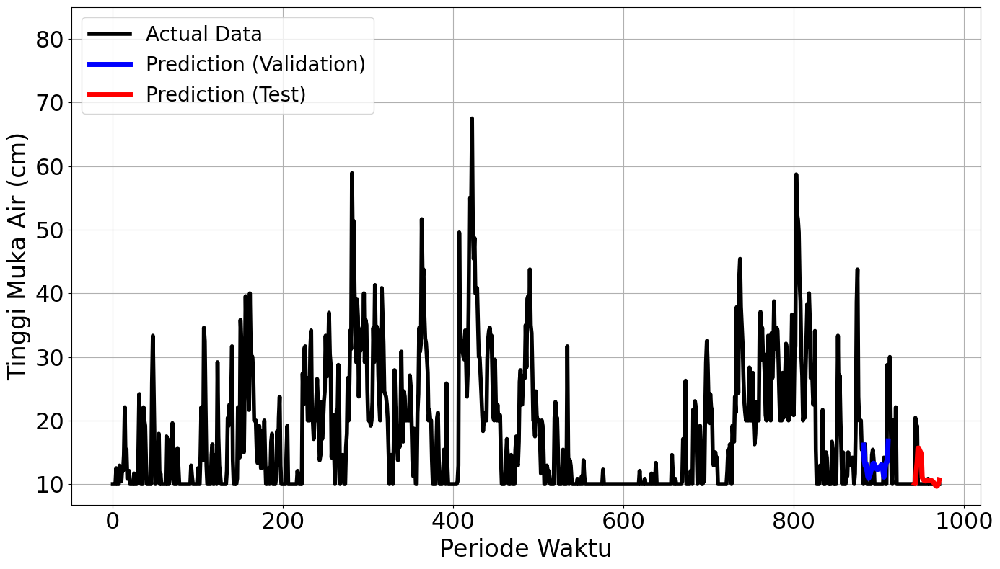

Epoch 1/100


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


34/34 ━━━━━━━━━━━━━━━━━━━━ 6s 49ms/step - loss: 0.1316 - val_loss: 0.0364
Epoch 2/100
34/34 ━━━━━━━━━━━━━━━━━━━━ 2s 46ms/step - loss: 0.0369 - val_loss: 0.0212
Epoch 3/100
34/34 ━━━━━━━━━━━━━━━━━━━━ 2s 35ms/step - loss: 0.0262 - val_loss: 0.0234
Epoch 4/100
34/34 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - loss: 0.0156 - val_loss: 0.0222
Epoch 5/100
34/34 ━━━━━━━━━━━━━━━━━━━━ 1s 35ms/step - loss: 0.0142 - val_loss: 0.0169
Epoch 6/100
34/34 ━━━━━━━━━━━━━━━━━━━━ 1s 35ms/step - loss: 0.0100 - val_loss: 0.0201
Epoch 7/100
34/34 ━━━━━━━━━━━━━━━━━━━━ 1s 35ms/step - loss: 0.0115 - val_loss: 0.0171
Epoch 8/100
34/34 ━━━━━━━━━━━━━━━━━━━━ 1s 35ms/step - loss: 0.0093 - val_loss: 0.0180
Epoch 9/100
34/34 ━━━━━━━━━━━━━━━━━━━━ 1s 35ms/step - loss: 0.0085 - val_loss: 0.0171
Epoch 10/100
33/34 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step - loss: 0.0093Restoring model weights from the end of the best epoch.
34/34 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.0093 - val_loss: 0.0181
Epoch 00010: early stopping
1/1 ━━━━━━━━━

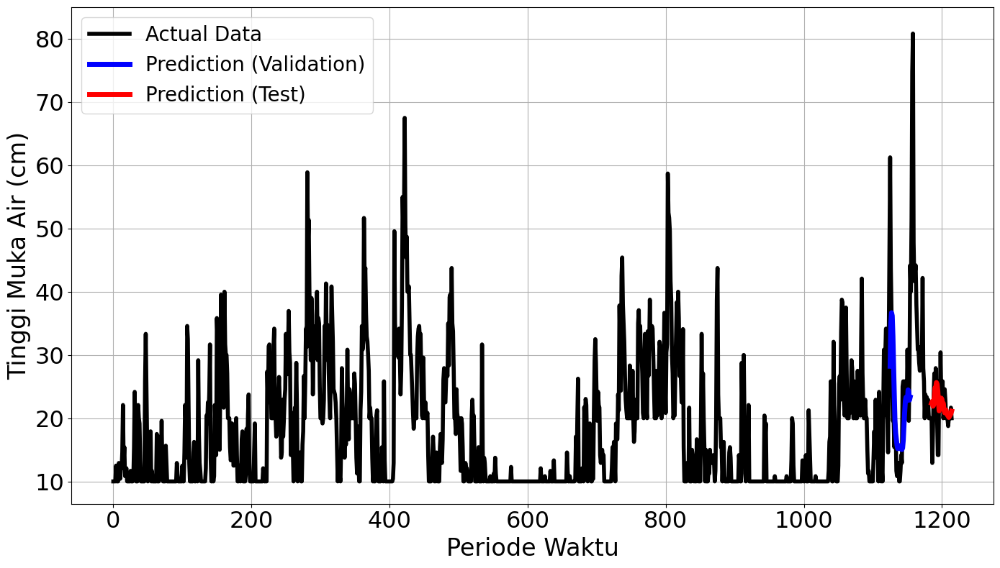

<Figure size 640x480 with 0 Axes>


Final Average MAPE Validation: 0.2619
Final Average MAPE Test: 0.2790
Epoch 1/100


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


2/2 ━━━━━━━━━━━━━━━━━━━━ 4s 580ms/step - loss: 0.2976 - val_loss: 0.0938
Epoch 2/100
2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 91ms/step - loss: 0.0760 - val_loss: 0.1355
Epoch 3/100
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step - loss: 0.0699 - val_loss: 0.1301
Epoch 4/100
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 93ms/step - loss: 0.0494 - val_loss: 0.1198
Epoch 5/100
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 113ms/step - loss: 0.0671 - val_loss: 0.0945
Epoch 6/100
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 96ms/step - loss: 0.0449 - val_loss: 0.0731
Epoch 7/100
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 94ms/step - loss: 0.0208 - val_loss: 0.0585
Epoch 8/100
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 92ms/step - loss: 0.0429 - val_loss: 0.0601
Epoch 9/100
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step - loss: 0.0306 - val_loss: 0.0658
Epoch 10/100
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 92ms/step - loss: 0.0296 - val_loss: 0.0735
Epoch 11/100
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 91ms/step - loss: 0.0361 - val_loss: 0.0797
Epoch 12/100
1/2 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step - loss: 0.0319Restoring model we

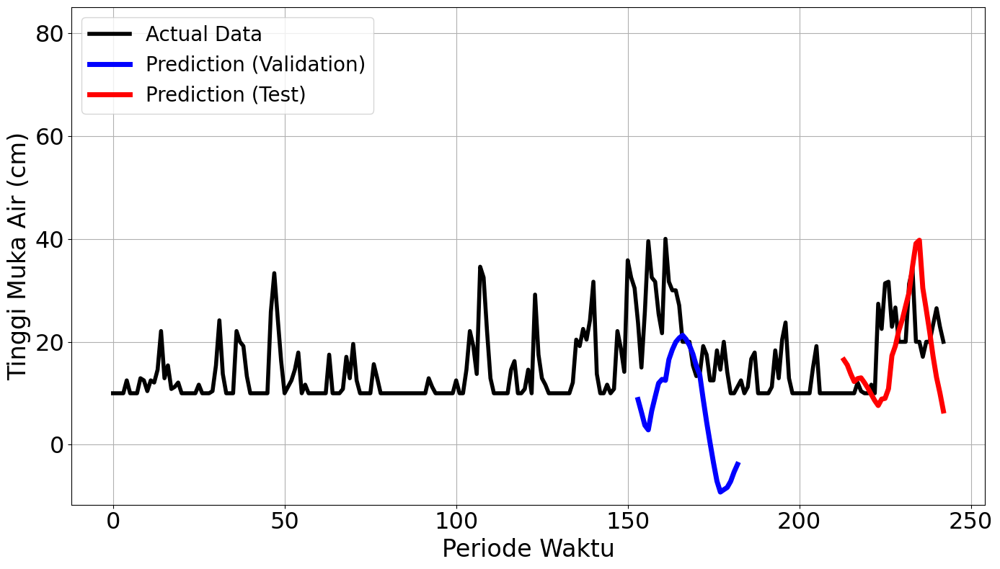

Epoch 1/100


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


6/6 ━━━━━━━━━━━━━━━━━━━━ 5s 219ms/step - loss: 0.1431 - val_loss: 0.0356
Epoch 2/100
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step - loss: 0.0792 - val_loss: 0.0368
Epoch 3/100
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 48ms/step - loss: 0.0591 - val_loss: 0.0239
Epoch 4/100
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step - loss: 0.0584 - val_loss: 0.0265
Epoch 5/100
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 48ms/step - loss: 0.0466 - val_loss: 0.0322
Epoch 6/100
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step - loss: 0.0369 - val_loss: 0.0294
Epoch 7/100
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 56ms/step - loss: 0.0362 - val_loss: 0.0380
Epoch 8/100
5/6 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.0316Restoring model weights from the end of the best epoch.
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 49ms/step - loss: 0.0315 - val_loss: 0.0365
Epoch 00008: early stopping
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 342ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
mape validation = 39.6909971695915 %
mape test = 69.27437233109704 %


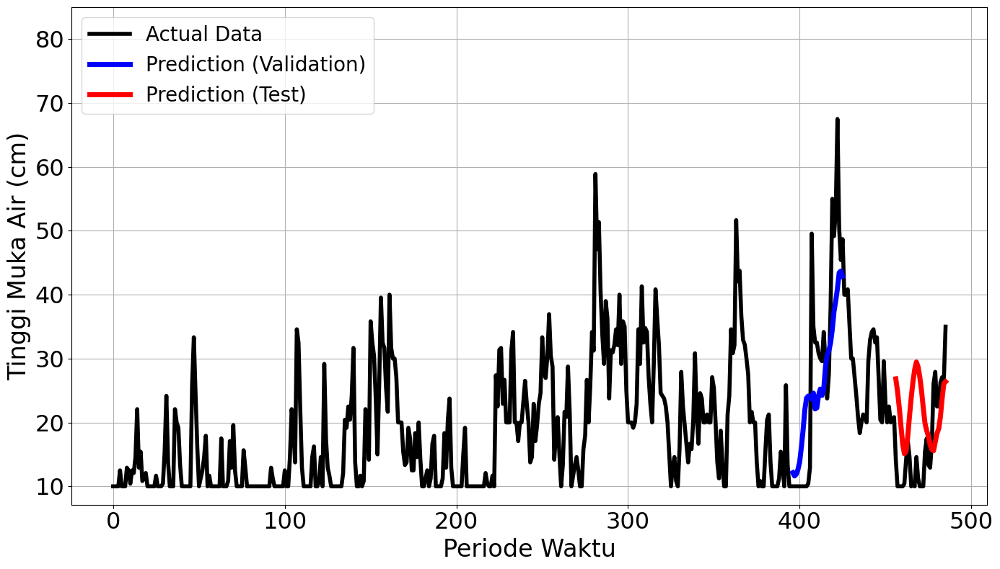

Epoch 1/100


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


10/10 ━━━━━━━━━━━━━━━━━━━━ 4s 98ms/step - loss: 0.1368 - val_loss: 7.6632e-04
Epoch 2/100
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step - loss: 0.0636 - val_loss: 0.0069
Epoch 3/100
10/10 ━━━━━━━━━━━━━━━━━━━━ 1s 48ms/step - loss: 0.0563 - val_loss: 0.0013
Epoch 4/100
10/10 ━━━━━━━━━━━━━━━━━━━━ 1s 58ms/step - loss: 0.0359 - val_loss: 0.0087
Epoch 5/100
10/10 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.0297 - val_loss: 0.0037
Epoch 6/100
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step - loss: 0.0261Restoring model weights from the end of the best epoch.
10/10 ━━━━━━━━━━━━━━━━━━━━ 1s 62ms/step - loss: 0.0260 - val_loss: 0.0030
Epoch 00006: early stopping
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 543ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step
mape validation = 15.82875297324978 %
mape test = 35.67048115676226 %


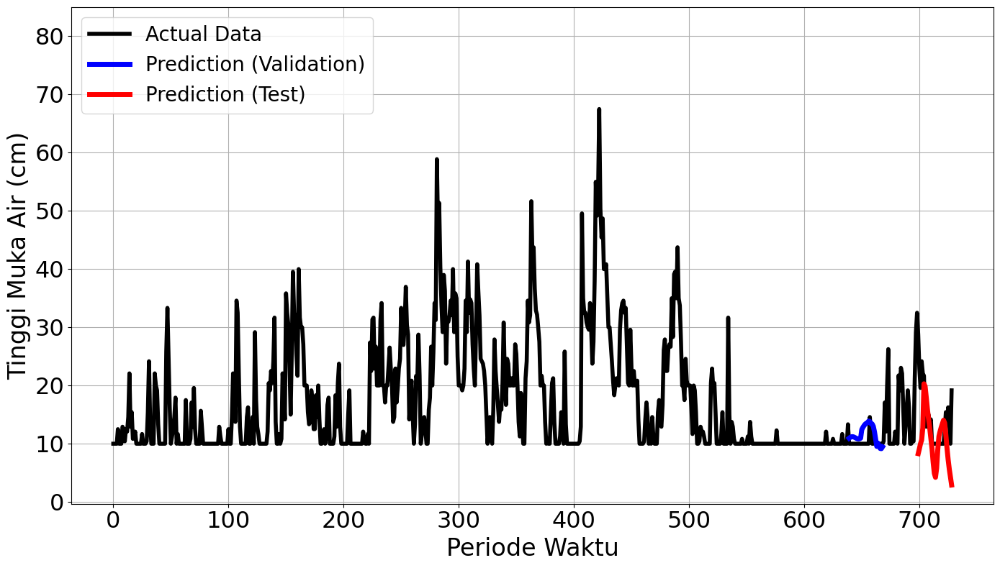

Epoch 1/100


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


13/13 ━━━━━━━━━━━━━━━━━━━━ 4s 86ms/step - loss: 0.0999 - val_loss: 0.0181
Epoch 2/100
13/13 ━━━━━━━━━━━━━━━━━━━━ 1s 47ms/step - loss: 0.0525 - val_loss: 0.0079
Epoch 3/100
13/13 ━━━━━━━━━━━━━━━━━━━━ 1s 47ms/step - loss: 0.0344 - val_loss: 0.0118
Epoch 4/100
13/13 ━━━━━━━━━━━━━━━━━━━━ 1s 46ms/step - loss: 0.0238 - val_loss: 0.0061
Epoch 5/100
13/13 ━━━━━━━━━━━━━━━━━━━━ 1s 44ms/step - loss: 0.0191 - val_loss: 0.0038
Epoch 6/100
13/13 ━━━━━━━━━━━━━━━━━━━━ 1s 45ms/step - loss: 0.0143 - val_loss: 0.0096
Epoch 7/100
13/13 ━━━━━━━━━━━━━━━━━━━━ 1s 45ms/step - loss: 0.0154 - val_loss: 0.0043
Epoch 8/100
13/13 ━━━━━━━━━━━━━━━━━━━━ 1s 53ms/step - loss: 0.0121 - val_loss: 0.0058
Epoch 9/100
13/13 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.0109 - val_loss: 0.0037
Epoch 10/100
13/13 ━━━━━━━━━━━━━━━━━━━━ 1s 64ms/step - loss: 0.0119 - val_loss: 0.0040
Epoch 11/100
13/13 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.0083 - val_loss: 0.0040
Epoch 12/100
13/13 ━━━━━━━━━━━━━━━━━━━━ 1s 45ms/step - loss: 0.0

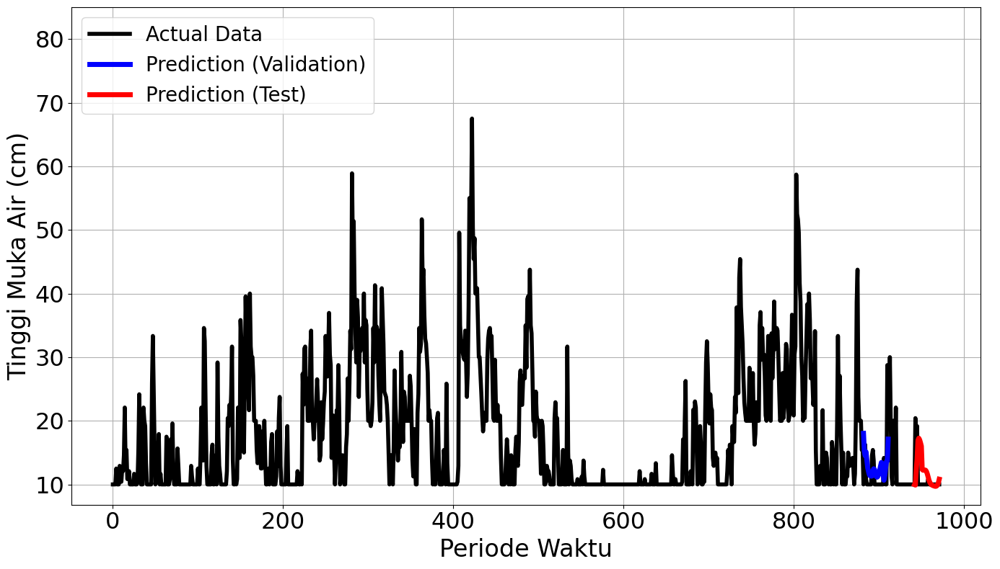

Epoch 1/100


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


17/17 ━━━━━━━━━━━━━━━━━━━━ 5s 113ms/step - loss: 0.1545 - val_loss: 0.0497
Epoch 2/100
17/17 ━━━━━━━━━━━━━━━━━━━━ 1s 57ms/step - loss: 0.0425 - val_loss: 0.0284
Epoch 3/100
17/17 ━━━━━━━━━━━━━━━━━━━━ 1s 62ms/step - loss: 0.0313 - val_loss: 0.0196
Epoch 4/100
17/17 ━━━━━━━━━━━━━━━━━━━━ 1s 58ms/step - loss: 0.0181 - val_loss: 0.0153
Epoch 5/100
17/17 ━━━━━━━━━━━━━━━━━━━━ 1s 48ms/step - loss: 0.0189 - val_loss: 0.0209
Epoch 6/100
17/17 ━━━━━━━━━━━━━━━━━━━━ 1s 45ms/step - loss: 0.0135 - val_loss: 0.0148
Epoch 7/100
17/17 ━━━━━━━━━━━━━━━━━━━━ 1s 43ms/step - loss: 0.0117 - val_loss: 0.0153
Epoch 8/100
17/17 ━━━━━━━━━━━━━━━━━━━━ 1s 46ms/step - loss: 0.0092 - val_loss: 0.0161
Epoch 9/100
17/17 ━━━━━━━━━━━━━━━━━━━━ 1s 46ms/step - loss: 0.0086 - val_loss: 0.0156
Epoch 10/100
17/17 ━━━━━━━━━━━━━━━━━━━━ 1s 44ms/step - loss: 0.0101 - val_loss: 0.0140
Epoch 11/100
17/17 ━━━━━━━━━━━━━━━━━━━━ 1s 45ms/step - loss: 0.0101 - val_loss: 0.0164
Epoch 12/100
17/17 ━━━━━━━━━━━━━━━━━━━━ 1s 45ms/step - loss: 0.

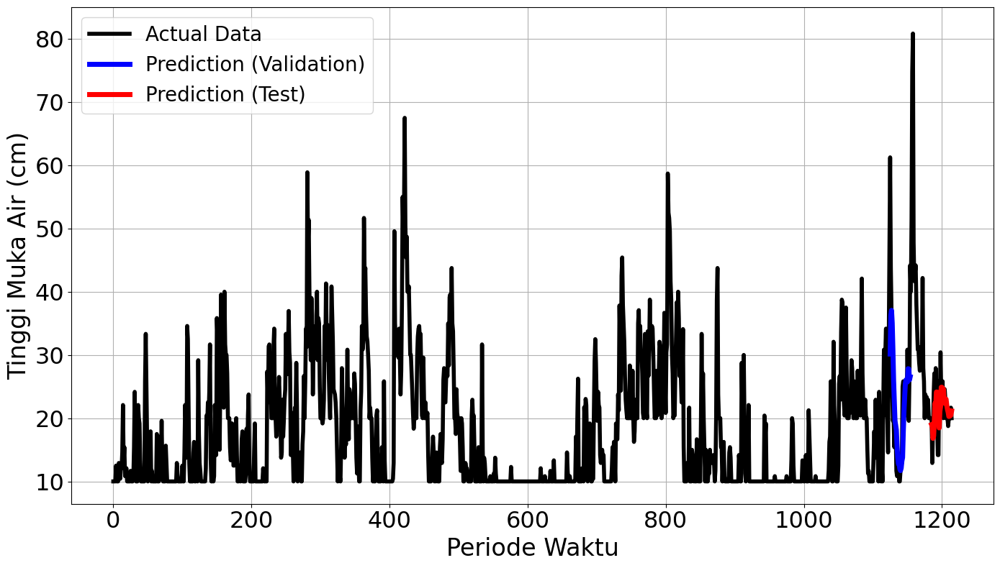

<Figure size 640x480 with 0 Axes>


Final Average MAPE Validation: 0.3542
Final Average MAPE Test: 0.3623
Epoch 1/100


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


2/2 ━━━━━━━━━━━━━━━━━━━━ 4s 567ms/step - loss: 0.2976 - val_loss: 0.0938
Epoch 2/100
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 136ms/step - loss: 0.0760 - val_loss: 0.1355
Epoch 3/100
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 138ms/step - loss: 0.0699 - val_loss: 0.1301
Epoch 4/100
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 133ms/step - loss: 0.0494 - val_loss: 0.1198
Epoch 5/100
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 136ms/step - loss: 0.0671 - val_loss: 0.0945
Epoch 6/100
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 96ms/step - loss: 0.0449 - val_loss: 0.0731
Epoch 7/100
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 128ms/step - loss: 0.0208 - val_loss: 0.0585
Epoch 8/100
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 132ms/step - loss: 0.0429 - val_loss: 0.0601
Epoch 9/100
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 104ms/step - loss: 0.0306 - val_loss: 0.0658
Epoch 10/100
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 107ms/step - loss: 0.0296 - val_loss: 0.0735
Epoch 11/100
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 132ms/step - loss: 0.0361 - val_loss: 0.0797
Epoch 12/100
1/2 ━━━━━━━━━━━━━━━━━━━━ 0s 159ms/step - loss: 0.0319Restoring 

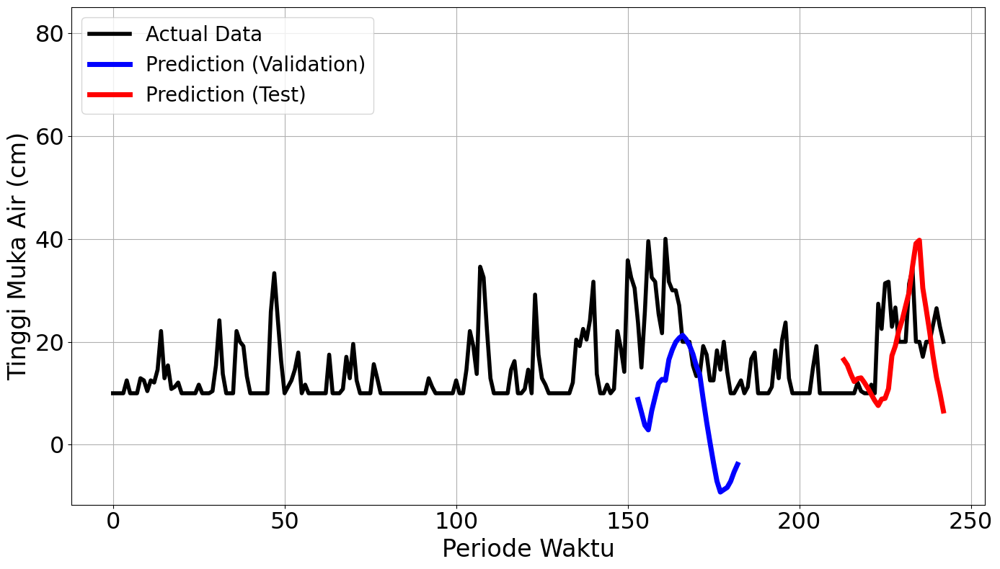

Epoch 1/100


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


6/6 ━━━━━━━━━━━━━━━━━━━━ 6s 146ms/step - loss: 0.1431 - val_loss: 0.0356
Epoch 2/100
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step - loss: 0.0792 - val_loss: 0.0368
Epoch 3/100
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step - loss: 0.0591 - val_loss: 0.0239
Epoch 4/100
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step - loss: 0.0584 - val_loss: 0.0265
Epoch 5/100
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 50ms/step - loss: 0.0466 - val_loss: 0.0322
Epoch 6/100
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step - loss: 0.0369 - val_loss: 0.0294
Epoch 7/100
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 50ms/step - loss: 0.0362 - val_loss: 0.0380
Epoch 8/100
5/6 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.0316Restoring model weights from the end of the best epoch.
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 54ms/step - loss: 0.0315 - val_loss: 0.0365
Epoch 00008: early stopping
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 339ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
mape validation = 39.6909971695915 %
mape test = 69.27437233109704 %


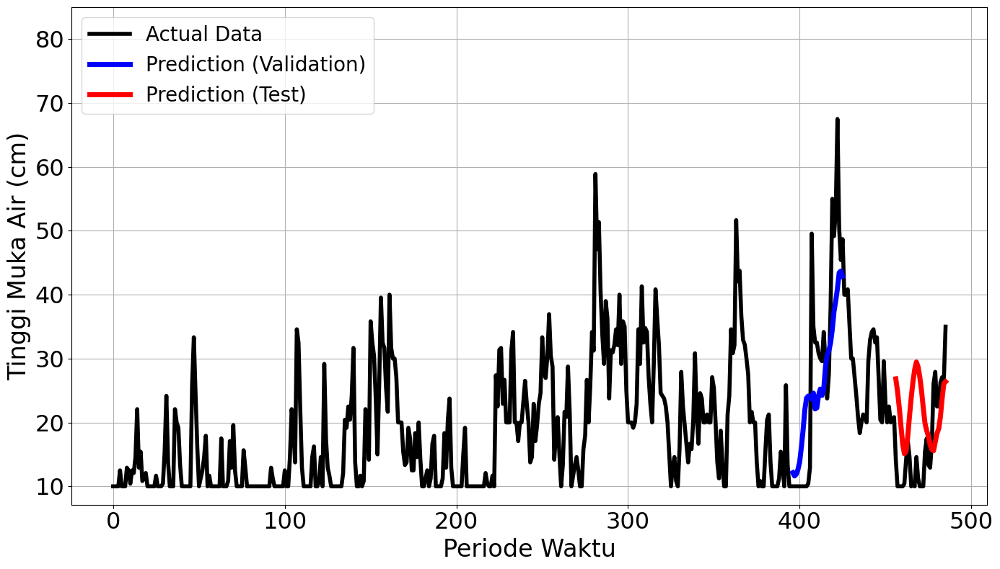

Epoch 1/100


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


10/10 ━━━━━━━━━━━━━━━━━━━━ 5s 137ms/step - loss: 0.1368 - val_loss: 7.6632e-04
Epoch 2/100
10/10 ━━━━━━━━━━━━━━━━━━━━ 2s 47ms/step - loss: 0.0636 - val_loss: 0.0069
Epoch 3/100
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step - loss: 0.0563 - val_loss: 0.0013
Epoch 4/100
10/10 ━━━━━━━━━━━━━━━━━━━━ 1s 54ms/step - loss: 0.0359 - val_loss: 0.0087
Epoch 5/100
10/10 ━━━━━━━━━━━━━━━━━━━━ 1s 46ms/step - loss: 0.0297 - val_loss: 0.0037
Epoch 6/100
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step - loss: 0.0261Restoring model weights from the end of the best epoch.
10/10 ━━━━━━━━━━━━━━━━━━━━ 1s 54ms/step - loss: 0.0260 - val_loss: 0.0030
Epoch 00006: early stopping
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 320ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
mape validation = 15.82875297324978 %
mape test = 35.67048115676226 %


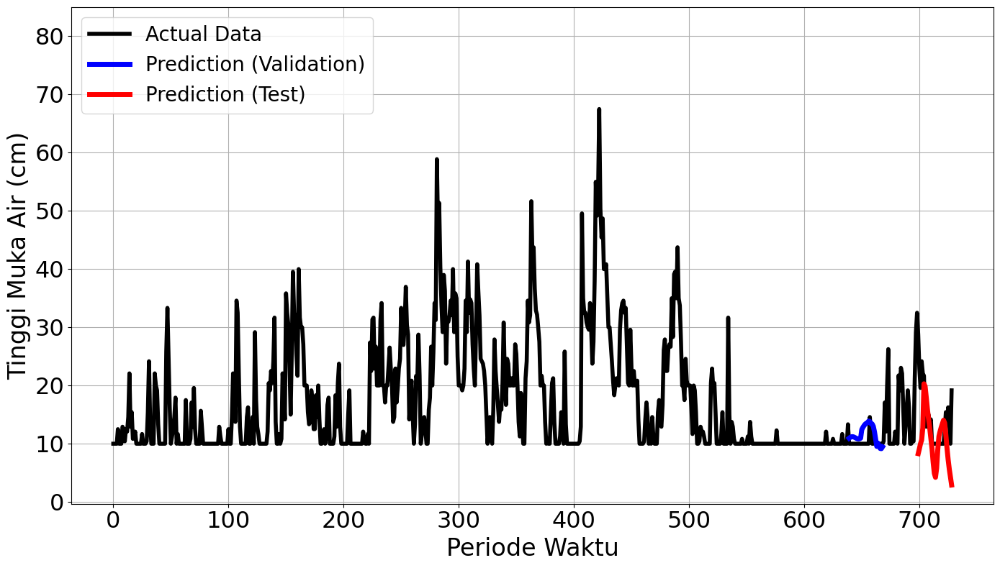

Epoch 1/100


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


13/13 ━━━━━━━━━━━━━━━━━━━━ 4s 86ms/step - loss: 0.0999 - val_loss: 0.0181
Epoch 2/100
13/13 ━━━━━━━━━━━━━━━━━━━━ 1s 49ms/step - loss: 0.0525 - val_loss: 0.0079
Epoch 3/100
13/13 ━━━━━━━━━━━━━━━━━━━━ 1s 55ms/step - loss: 0.0344 - val_loss: 0.0118
Epoch 4/100
13/13 ━━━━━━━━━━━━━━━━━━━━ 1s 58ms/step - loss: 0.0238 - val_loss: 0.0061
Epoch 5/100
13/13 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.0191 - val_loss: 0.0038
Epoch 6/100
13/13 ━━━━━━━━━━━━━━━━━━━━ 1s 58ms/step - loss: 0.0143 - val_loss: 0.0096
Epoch 7/100
13/13 ━━━━━━━━━━━━━━━━━━━━ 1s 52ms/step - loss: 0.0154 - val_loss: 0.0043
Epoch 8/100
13/13 ━━━━━━━━━━━━━━━━━━━━ 1s 50ms/step - loss: 0.0121 - val_loss: 0.0058
Epoch 9/100
13/13 ━━━━━━━━━━━━━━━━━━━━ 1s 48ms/step - loss: 0.0109 - val_loss: 0.0037
Epoch 10/100
13/13 ━━━━━━━━━━━━━━━━━━━━ 1s 49ms/step - loss: 0.0119 - val_loss: 0.0040
Epoch 11/100
13/13 ━━━━━━━━━━━━━━━━━━━━ 1s 47ms/step - loss: 0.0083 - val_loss: 0.0040
Epoch 12/100
13/13 ━━━━━━━━━━━━━━━━━━━━ 1s 50ms/step - loss: 0.0

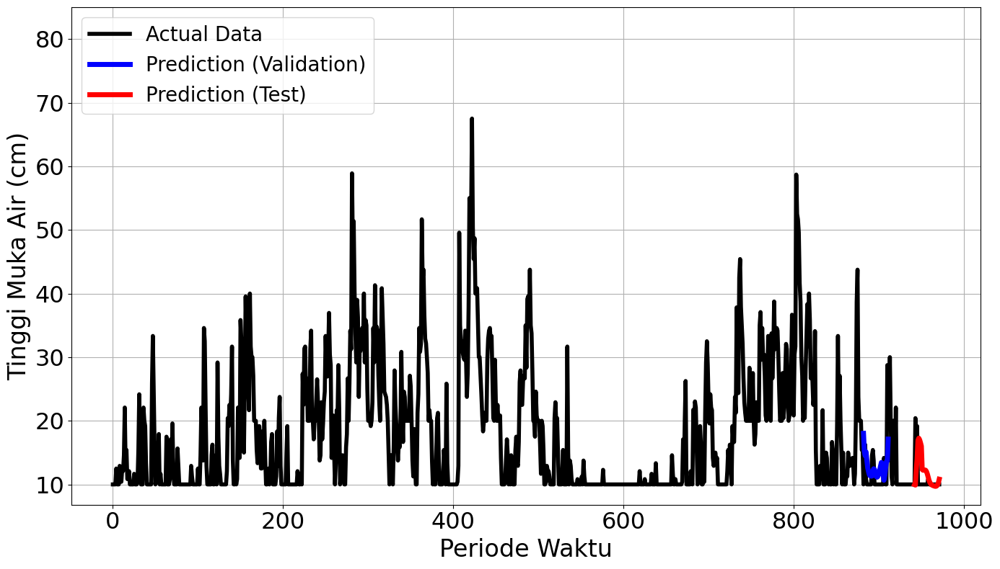

Epoch 1/100


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


17/17 ━━━━━━━━━━━━━━━━━━━━ 5s 75ms/step - loss: 0.1545 - val_loss: 0.0497
Epoch 2/100
17/17 ━━━━━━━━━━━━━━━━━━━━ 1s 47ms/step - loss: 0.0425 - val_loss: 0.0284
Epoch 3/100
17/17 ━━━━━━━━━━━━━━━━━━━━ 1s 45ms/step - loss: 0.0313 - val_loss: 0.0196
Epoch 4/100
17/17 ━━━━━━━━━━━━━━━━━━━━ 1s 47ms/step - loss: 0.0181 - val_loss: 0.0153
Epoch 5/100
17/17 ━━━━━━━━━━━━━━━━━━━━ 1s 47ms/step - loss: 0.0189 - val_loss: 0.0209
Epoch 6/100
17/17 ━━━━━━━━━━━━━━━━━━━━ 1s 50ms/step - loss: 0.0135 - val_loss: 0.0148
Epoch 7/100
17/17 ━━━━━━━━━━━━━━━━━━━━ 1s 61ms/step - loss: 0.0117 - val_loss: 0.0153
Epoch 8/100
17/17 ━━━━━━━━━━━━━━━━━━━━ 1s 62ms/step - loss: 0.0092 - val_loss: 0.0161
Epoch 9/100
17/17 ━━━━━━━━━━━━━━━━━━━━ 1s 60ms/step - loss: 0.0086 - val_loss: 0.0156
Epoch 10/100
17/17 ━━━━━━━━━━━━━━━━━━━━ 1s 60ms/step - loss: 0.0101 - val_loss: 0.0140
Epoch 11/100
17/17 ━━━━━━━━━━━━━━━━━━━━ 1s 50ms/step - loss: 0.0101 - val_loss: 0.0164
Epoch 12/100
17/17 ━━━━━━━━━━━━━━━━━━━━ 1s 47ms/step - loss: 0.0

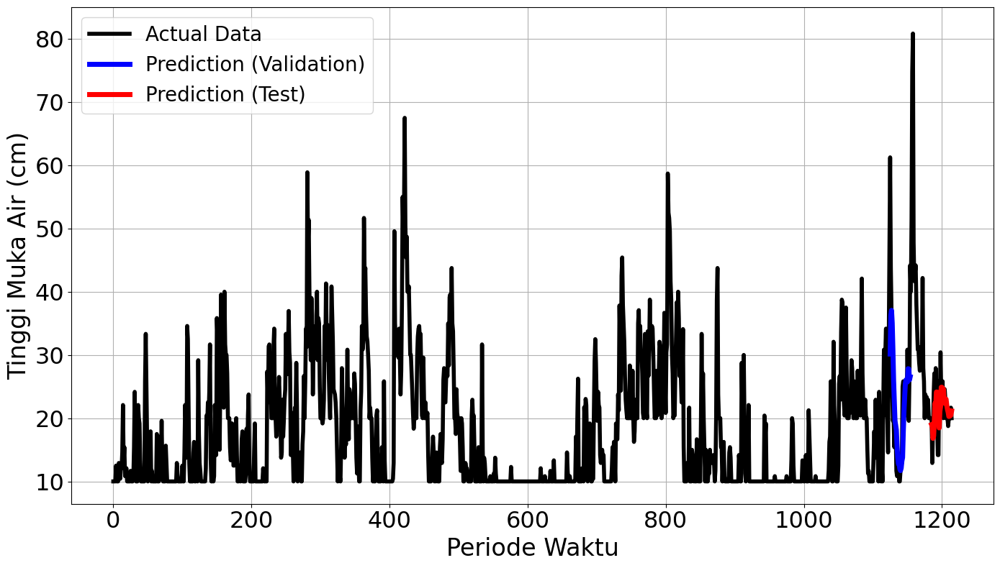

<Figure size 640x480 with 0 Axes>


Final Average MAPE Validation: 0.3542
Final Average MAPE Test: 0.3623
Epoch 1/100


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


1/1 ━━━━━━━━━━━━━━━━━━━━ 4s 4s/step - loss: 0.2733 - val_loss: 0.0570
Epoch 2/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 714ms/step - loss: 0.1883 - val_loss: 0.0839
Epoch 3/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 335ms/step - loss: 0.0940 - val_loss: 0.1080
Epoch 4/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step - loss: 0.0570 - val_loss: 0.1251
Epoch 5/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step - loss: 0.0542 - val_loss: 0.1308
Epoch 6/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 212ms/step - loss: 0.0702Restoring model weights from the end of the best epoch.
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 352ms/step - loss: 0.0702 - val_loss: 0.1325
Epoch 00006: early stopping
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 361ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
mape validation = 72.26660362597978 %
mape test = 139.8455401830503 %


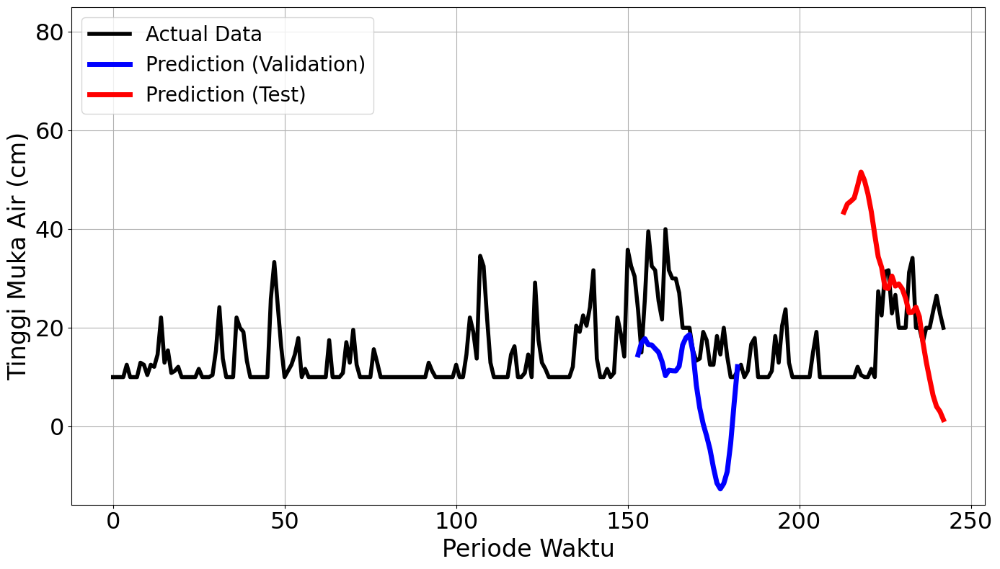

Epoch 1/100


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


3/3 ━━━━━━━━━━━━━━━━━━━━ 4s 331ms/step - loss: 0.2036 - val_loss: 0.0800
Epoch 2/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 94ms/step - loss: 0.1351 - val_loss: 0.0296
Epoch 3/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step - loss: 0.0976 - val_loss: 0.0345
Epoch 4/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step - loss: 0.0725 - val_loss: 0.0387
Epoch 5/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 103ms/step - loss: 0.0662 - val_loss: 0.0360
Epoch 6/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 111ms/step - loss: 0.0670 - val_loss: 0.0341
Epoch 7/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step - loss: 0.0467 Restoring model weights from the end of the best epoch.
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 97ms/step - loss: 0.0471 - val_loss: 0.0371
Epoch 00007: early stopping
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 344ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
mape validation = 48.05203081655407 %
mape test = 77.21142441341397 %


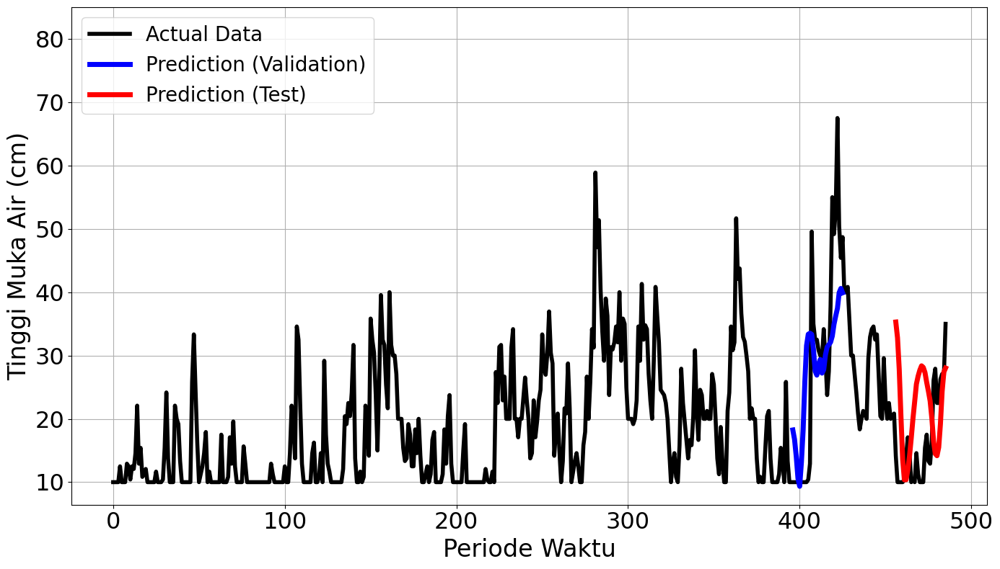

Epoch 1/100


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


5/5 ━━━━━━━━━━━━━━━━━━━━ 5s 201ms/step - loss: 0.1476 - val_loss: 0.0383
Epoch 2/100
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 81ms/step - loss: 0.0909 - val_loss: 0.0300
Epoch 3/100
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 80ms/step - loss: 0.0611 - val_loss: 0.0057
Epoch 4/100
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 88ms/step - loss: 0.0428 - val_loss: 7.8801e-04
Epoch 5/100
5/5 ━━━━━━━━━━━━━━━━━━━━ 1s 80ms/step - loss: 0.0359 - val_loss: 0.0051
Epoch 6/100
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 80ms/step - loss: 0.0310 - val_loss: 0.0026
Epoch 7/100
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 87ms/step - loss: 0.0256 - val_loss: 2.4785e-04
Epoch 8/100
5/5 ━━━━━━━━━━━━━━━━━━━━ 1s 81ms/step - loss: 0.0208 - val_loss: 3.2115e-04
Epoch 9/100
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 85ms/step - loss: 0.0205 - val_loss: 3.4732e-04
Epoch 10/100
5/5 ━━━━━━━━━━━━━━━━━━━━ 1s 75ms/step - loss: 0.0173 - val_loss: 7.1761e-04
Epoch 11/100
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 84ms/step - loss: 0.0204 - val_loss: 5.7235e-04
Epoch 12/100
4/5 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step - loss: 0.

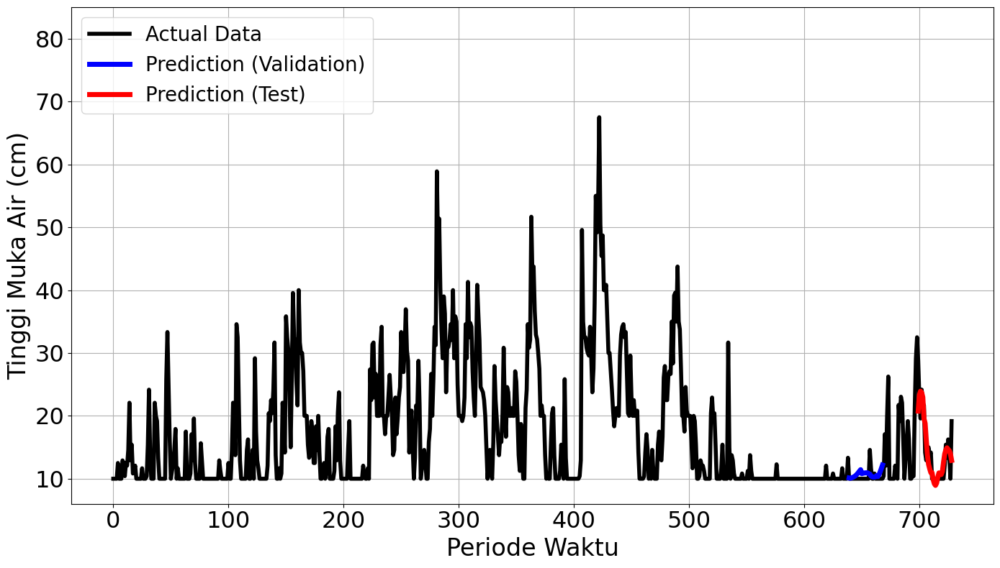

Epoch 1/100


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


7/7 ━━━━━━━━━━━━━━━━━━━━ 6s 378ms/step - loss: 0.1463 - val_loss: 0.0130
Epoch 2/100
7/7 ━━━━━━━━━━━━━━━━━━━━ 1s 76ms/step - loss: 0.0950 - val_loss: 0.0182
Epoch 3/100
7/7 ━━━━━━━━━━━━━━━━━━━━ 1s 78ms/step - loss: 0.0481 - val_loss: 0.0132
Epoch 4/100
7/7 ━━━━━━━━━━━━━━━━━━━━ 1s 75ms/step - loss: 0.0333 - val_loss: 0.0099
Epoch 5/100
7/7 ━━━━━━━━━━━━━━━━━━━━ 1s 74ms/step - loss: 0.0357 - val_loss: 0.0113
Epoch 6/100
7/7 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - loss: 0.0308 - val_loss: 0.0035
Epoch 7/100
7/7 ━━━━━━━━━━━━━━━━━━━━ 1s 77ms/step - loss: 0.0178 - val_loss: 0.0038
Epoch 8/100
7/7 ━━━━━━━━━━━━━━━━━━━━ 1s 73ms/step - loss: 0.0201 - val_loss: 0.0032
Epoch 9/100
7/7 ━━━━━━━━━━━━━━━━━━━━ 1s 77ms/step - loss: 0.0187 - val_loss: 0.0036
Epoch 10/100
7/7 ━━━━━━━━━━━━━━━━━━━━ 1s 95ms/step - loss: 0.0140 - val_loss: 0.0041
Epoch 11/100
7/7 ━━━━━━━━━━━━━━━━━━━━ 1s 76ms/step - loss: 0.0131 - val_loss: 0.0043
Epoch 12/100
7/7 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.0142 - val_loss: 0.0043


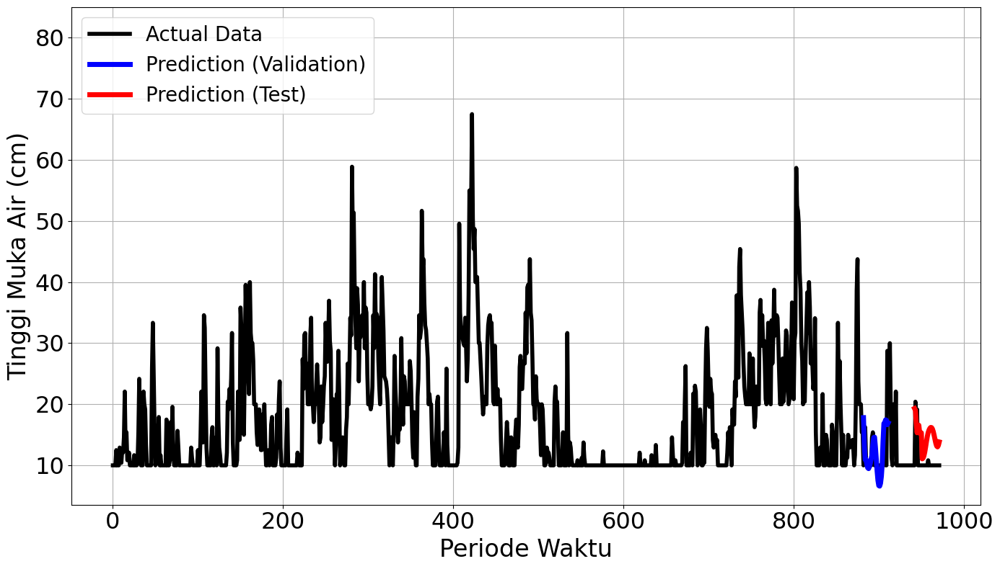

Epoch 1/100


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


9/9 ━━━━━━━━━━━━━━━━━━━━ 5s 129ms/step - loss: 0.1637 - val_loss: 0.0265
Epoch 2/100
9/9 ━━━━━━━━━━━━━━━━━━━━ 1s 74ms/step - loss: 0.0669 - val_loss: 0.0585
Epoch 3/100
9/9 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.0401 - val_loss: 0.0225
Epoch 4/100
9/9 ━━━━━━━━━━━━━━━━━━━━ 1s 74ms/step - loss: 0.0286 - val_loss: 0.0188
Epoch 5/100
9/9 ━━━━━━━━━━━━━━━━━━━━ 1s 74ms/step - loss: 0.0242 - val_loss: 0.0164
Epoch 6/100
9/9 ━━━━━━━━━━━━━━━━━━━━ 1s 75ms/step - loss: 0.0195 - val_loss: 0.0170
Epoch 7/100
9/9 ━━━━━━━━━━━━━━━━━━━━ 1s 74ms/step - loss: 0.0174 - val_loss: 0.0156
Epoch 8/100
9/9 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - loss: 0.0156 - val_loss: 0.0156
Epoch 9/100
9/9 ━━━━━━━━━━━━━━━━━━━━ 1s 77ms/step - loss: 0.0161 - val_loss: 0.0152
Epoch 10/100
9/9 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.0118 - val_loss: 0.0173
Epoch 11/100
9/9 ━━━━━━━━━━━━━━━━━━━━ 1s 75ms/step - loss: 0.0088 - val_loss: 0.0162
Epoch 12/100
9/9 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - loss: 0.0116 - val_loss: 0.0165


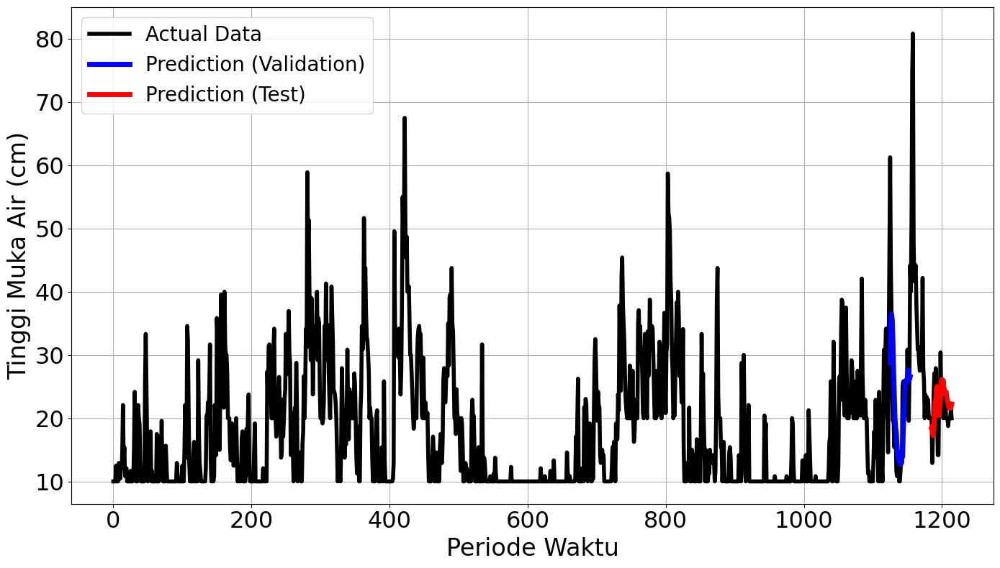

<Figure size 640x480 with 0 Axes>


Final Average MAPE Validation: 0.3547
Final Average MAPE Test: 0.5805
Epoch 1/100


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


1/1 ━━━━━━━━━━━━━━━━━━━━ 4s 4s/step - loss: 0.2733 - val_loss: 0.0570
Epoch 2/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 178ms/step - loss: 0.1883 - val_loss: 0.0839
Epoch 3/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 179ms/step - loss: 0.0940 - val_loss: 0.1080
Epoch 4/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 178ms/step - loss: 0.0570 - val_loss: 0.1251
Epoch 5/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 279ms/step - loss: 0.0542 - val_loss: 0.1308
Epoch 6/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 212ms/step - loss: 0.0702Restoring model weights from the end of the best epoch.
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 319ms/step - loss: 0.0702 - val_loss: 0.1325
Epoch 00006: early stopping
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 329ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step
mape validation = 72.26660362597978 %
mape test = 139.8455401830503 %


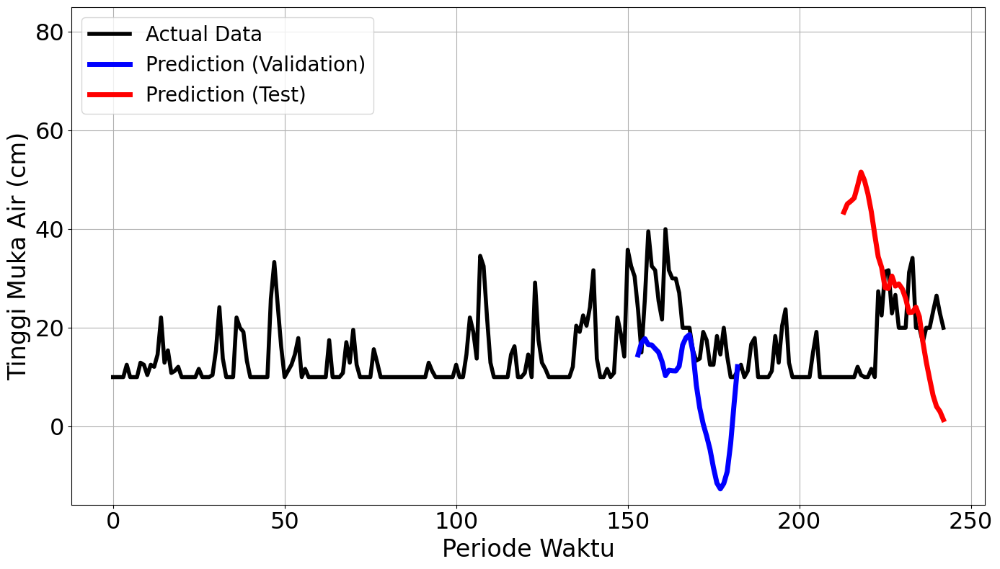

Epoch 1/100


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


3/3 ━━━━━━━━━━━━━━━━━━━━ 5s 336ms/step - loss: 0.2036 - val_loss: 0.0800
Epoch 2/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 112ms/step - loss: 0.1351 - val_loss: 0.0296
Epoch 3/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step - loss: 0.0976 - val_loss: 0.0345
Epoch 4/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step - loss: 0.0725 - val_loss: 0.0387
Epoch 5/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step - loss: 0.0662 - val_loss: 0.0360
Epoch 6/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 88ms/step - loss: 0.0670 - val_loss: 0.0341
Epoch 7/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step - loss: 0.0467 Restoring model weights from the end of the best epoch.
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 105ms/step - loss: 0.0471 - val_loss: 0.0371
Epoch 00007: early stopping
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 436ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step
mape validation = 48.05203081655407 %
mape test = 77.21142441341397 %


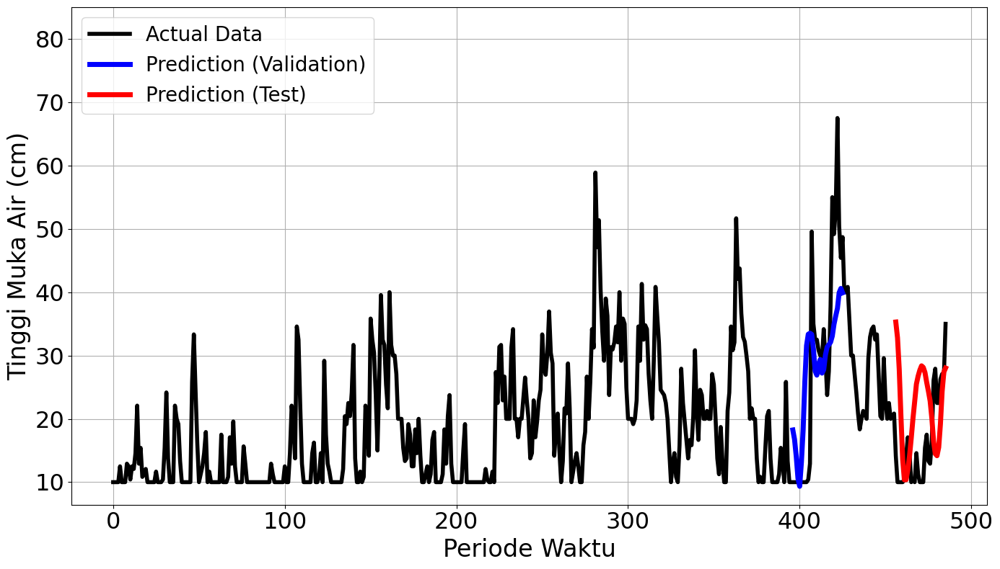

Epoch 1/100


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


5/5 ━━━━━━━━━━━━━━━━━━━━ 4s 217ms/step - loss: 0.1476 - val_loss: 0.0383
Epoch 2/100
5/5 ━━━━━━━━━━━━━━━━━━━━ 1s 101ms/step - loss: 0.0909 - val_loss: 0.0300
Epoch 3/100
5/5 ━━━━━━━━━━━━━━━━━━━━ 1s 118ms/step - loss: 0.0611 - val_loss: 0.0057
Epoch 4/100
5/5 ━━━━━━━━━━━━━━━━━━━━ 1s 104ms/step - loss: 0.0428 - val_loss: 7.8801e-04
Epoch 5/100
5/5 ━━━━━━━━━━━━━━━━━━━━ 1s 94ms/step - loss: 0.0359 - val_loss: 0.0051
Epoch 6/100
5/5 ━━━━━━━━━━━━━━━━━━━━ 1s 97ms/step - loss: 0.0310 - val_loss: 0.0026
Epoch 7/100
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 97ms/step - loss: 0.0256 - val_loss: 2.4785e-04
Epoch 8/100
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 95ms/step - loss: 0.0208 - val_loss: 3.2115e-04
Epoch 9/100
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 90ms/step - loss: 0.0205 - val_loss: 3.4732e-04
Epoch 10/100
5/5 ━━━━━━━━━━━━━━━━━━━━ 1s 80ms/step - loss: 0.0173 - val_loss: 7.1761e-04
Epoch 11/100
5/5 ━━━━━━━━━━━━━━━━━━━━ 1s 76ms/step - loss: 0.0204 - val_loss: 5.7235e-04
Epoch 12/100
4/5 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step - loss:

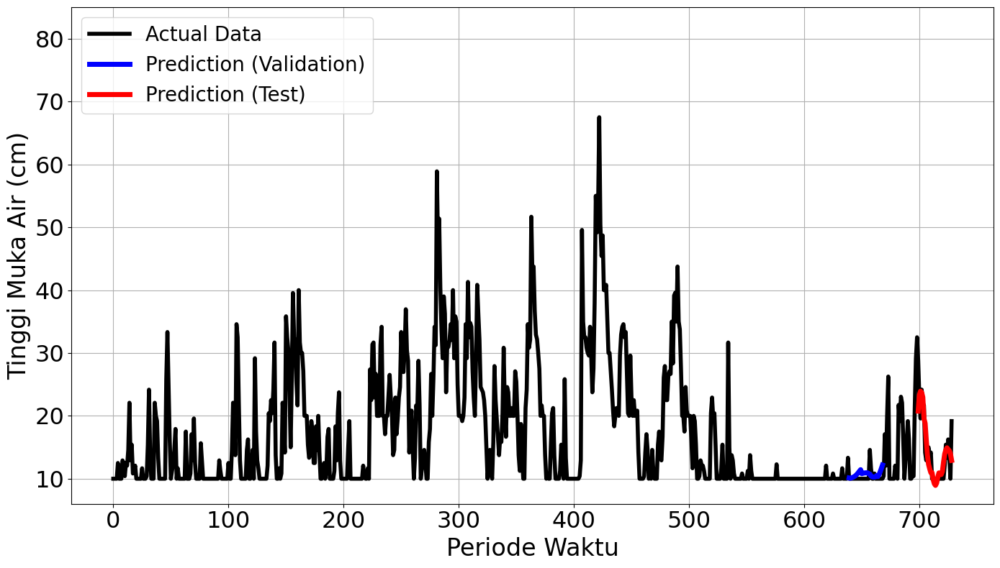

Epoch 1/100


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


7/7 ━━━━━━━━━━━━━━━━━━━━ 5s 152ms/step - loss: 0.1463 - val_loss: 0.0130
Epoch 2/100
7/7 ━━━━━━━━━━━━━━━━━━━━ 1s 74ms/step - loss: 0.0950 - val_loss: 0.0182
Epoch 3/100
7/7 ━━━━━━━━━━━━━━━━━━━━ 1s 72ms/step - loss: 0.0481 - val_loss: 0.0132
Epoch 4/100
7/7 ━━━━━━━━━━━━━━━━━━━━ 1s 75ms/step - loss: 0.0333 - val_loss: 0.0099
Epoch 5/100
7/7 ━━━━━━━━━━━━━━━━━━━━ 1s 93ms/step - loss: 0.0357 - val_loss: 0.0113
Epoch 6/100
7/7 ━━━━━━━━━━━━━━━━━━━━ 1s 89ms/step - loss: 0.0308 - val_loss: 0.0035
Epoch 7/100
7/7 ━━━━━━━━━━━━━━━━━━━━ 1s 98ms/step - loss: 0.0178 - val_loss: 0.0038
Epoch 8/100
7/7 ━━━━━━━━━━━━━━━━━━━━ 1s 100ms/step - loss: 0.0201 - val_loss: 0.0032
Epoch 9/100
7/7 ━━━━━━━━━━━━━━━━━━━━ 1s 73ms/step - loss: 0.0187 - val_loss: 0.0036
Epoch 10/100
7/7 ━━━━━━━━━━━━━━━━━━━━ 1s 74ms/step - loss: 0.0140 - val_loss: 0.0041
Epoch 11/100
7/7 ━━━━━━━━━━━━━━━━━━━━ 1s 74ms/step - loss: 0.0131 - val_loss: 0.0043
Epoch 12/100
7/7 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - loss: 0.0142 - val_loss: 0.0043

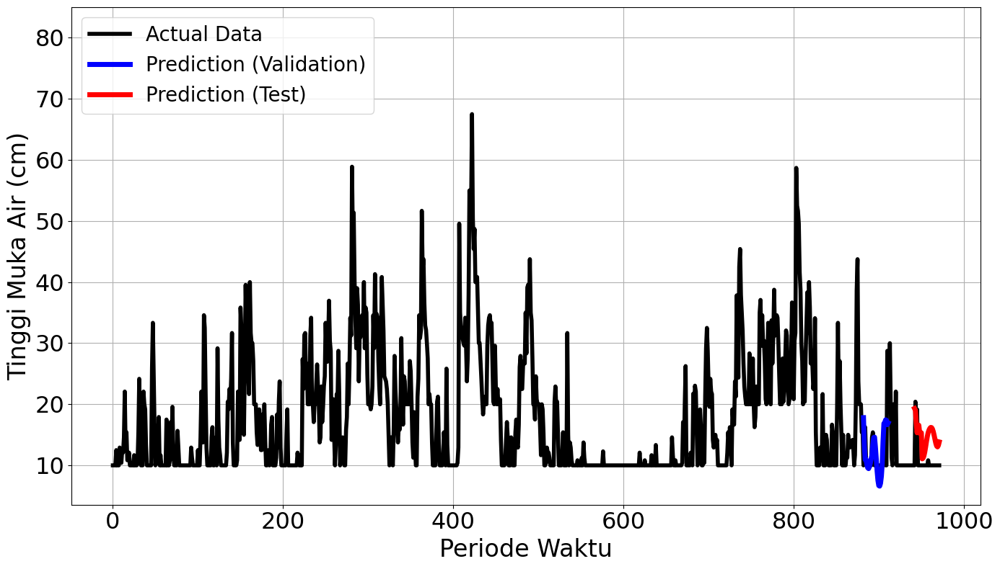

Epoch 1/100


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


9/9 ━━━━━━━━━━━━━━━━━━━━ 5s 132ms/step - loss: 0.1637 - val_loss: 0.0265
Epoch 2/100
9/9 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.0669 - val_loss: 0.0585
Epoch 3/100
9/9 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.0401 - val_loss: 0.0225
Epoch 4/100
9/9 ━━━━━━━━━━━━━━━━━━━━ 1s 94ms/step - loss: 0.0286 - val_loss: 0.0188
Epoch 5/100
9/9 ━━━━━━━━━━━━━━━━━━━━ 1s 85ms/step - loss: 0.0242 - val_loss: 0.0164
Epoch 6/100
9/9 ━━━━━━━━━━━━━━━━━━━━ 1s 83ms/step - loss: 0.0195 - val_loss: 0.0170
Epoch 7/100
9/9 ━━━━━━━━━━━━━━━━━━━━ 1s 85ms/step - loss: 0.0174 - val_loss: 0.0156
Epoch 8/100
9/9 ━━━━━━━━━━━━━━━━━━━━ 1s 89ms/step - loss: 0.0156 - val_loss: 0.0156
Epoch 9/100
9/9 ━━━━━━━━━━━━━━━━━━━━ 1s 72ms/step - loss: 0.0161 - val_loss: 0.0152
Epoch 10/100
9/9 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.0118 - val_loss: 0.0173
Epoch 11/100
9/9 ━━━━━━━━━━━━━━━━━━━━ 1s 74ms/step - loss: 0.0088 - val_loss: 0.0162
Epoch 12/100
9/9 ━━━━━━━━━━━━━━━━━━━━ 1s 73ms/step - loss: 0.0116 - val_loss: 0.0165


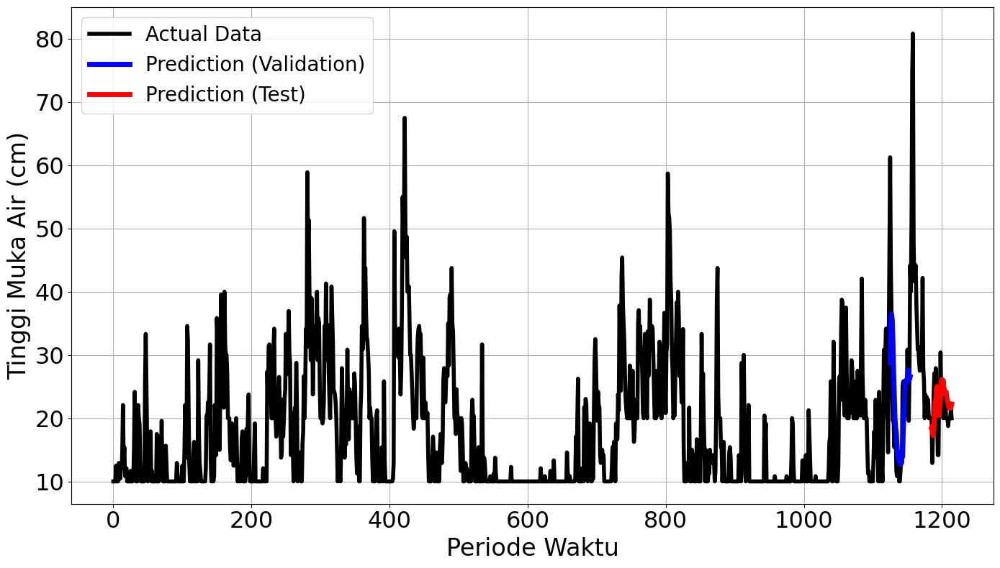

<Figure size 640x480 with 0 Axes>


Final Average MAPE Validation: 0.3547
Final Average MAPE Test: 0.5805
Epoch 1/100


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


6/6 ━━━━━━━━━━━━━━━━━━━━ 5s 205ms/step - loss: 0.1600 - val_loss: 0.0794
Epoch 2/100
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step - loss: 0.0881 - val_loss: 0.0330
Epoch 3/100
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 52ms/step - loss: 0.0341 - val_loss: 0.0724
Epoch 4/100
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step - loss: 0.0247 - val_loss: 0.0643
Epoch 5/100
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step - loss: 0.0140 - val_loss: 0.0523
Epoch 6/100
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 50ms/step - loss: 0.0090 - val_loss: 0.0360
Epoch 7/100
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - loss: 0.0069 - val_loss: 0.0279
Epoch 8/100
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 57ms/step - loss: 0.0075 - val_loss: 0.0273
Epoch 9/100
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step - loss: 0.0080 - val_loss: 0.0256
Epoch 10/100
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 48ms/step - loss: 0.0048 - val_loss: 0.0320
Epoch 11/100
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step - loss: 0.0078 - val_loss: 0.0312
Epoch 12/100
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 51ms/step - loss: 0.0063 - val_loss: 0.0276


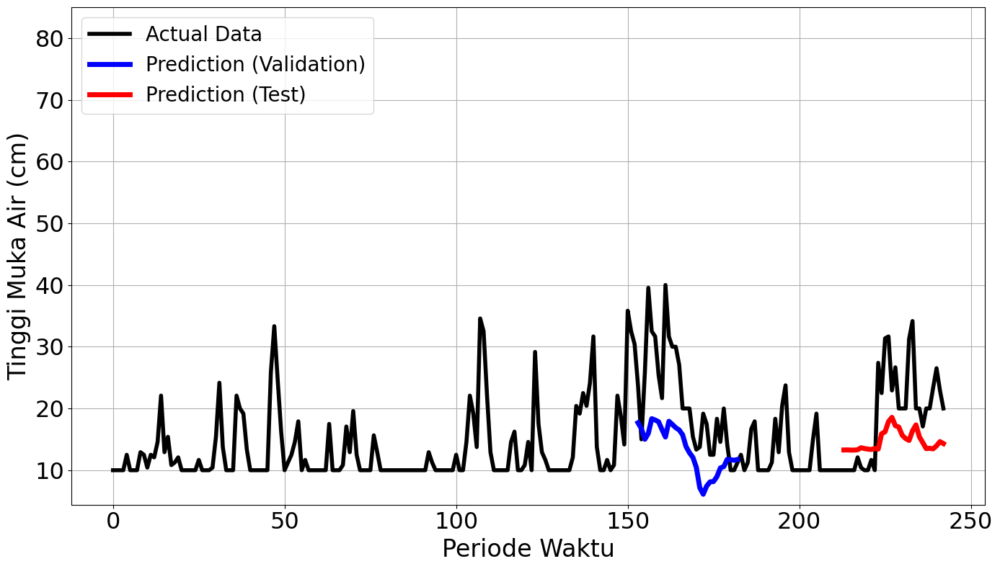

Epoch 1/100


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


21/21 ━━━━━━━━━━━━━━━━━━━━ 5s 65ms/step - loss: 0.0684 - val_loss: 0.0406
Epoch 2/100
21/21 ━━━━━━━━━━━━━━━━━━━━ 1s 39ms/step - loss: 0.0240 - val_loss: 0.0420
Epoch 3/100
21/21 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0175 - val_loss: 0.0342
Epoch 4/100
21/21 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - loss: 0.0139 - val_loss: 0.0293
Epoch 5/100
21/21 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0096 - val_loss: 0.0257
Epoch 6/100
21/21 ━━━━━━━━━━━━━━━━━━━━ 1s 39ms/step - loss: 0.0096 - val_loss: 0.0227
Epoch 7/100
21/21 ━━━━━━━━━━━━━━━━━━━━ 1s 41ms/step - loss: 0.0105 - val_loss: 0.0299
Epoch 8/100
21/21 ━━━━━━━━━━━━━━━━━━━━ 1s 46ms/step - loss: 0.0115 - val_loss: 0.0265
Epoch 9/100
21/21 ━━━━━━━━━━━━━━━━━━━━ 1s 45ms/step - loss: 0.0080 - val_loss: 0.0262
Epoch 10/100
21/21 ━━━━━━━━━━━━━━━━━━━━ 1s 43ms/step - loss: 0.0094 - val_loss: 0.0251
Epoch 11/100
21/21 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.0073 - val_loss: 0.0222
Epoch 12/100
21/21 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0

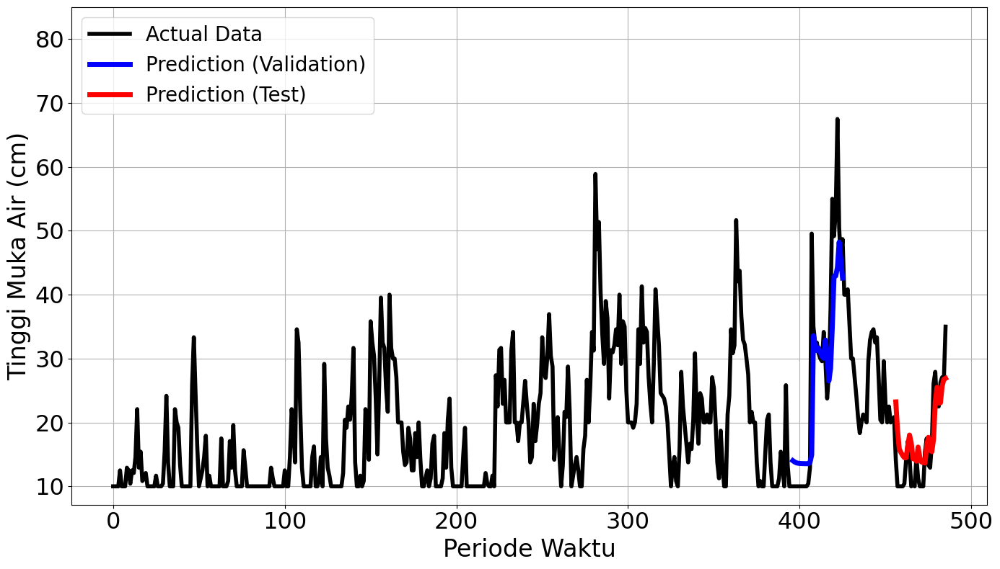

Epoch 1/100


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


37/37 ━━━━━━━━━━━━━━━━━━━━ 8s 54ms/step - loss: 0.0909 - val_loss: 9.0353e-04
Epoch 2/100
37/37 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - loss: 0.0136 - val_loss: 2.0356e-04
Epoch 3/100
37/37 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - loss: 0.0084 - val_loss: 2.5245e-04
Epoch 4/100
37/37 ━━━━━━━━━━━━━━━━━━━━ 3s 44ms/step - loss: 0.0077 - val_loss: 0.0014
Epoch 5/100
37/37 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - loss: 0.0093 - val_loss: 5.2755e-04
Epoch 6/100
37/37 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.0074 - val_loss: 2.6257e-04
Epoch 7/100
37/37 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step - loss: 0.0067Restoring model weights from the end of the best epoch.
37/37 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step - loss: 0.0068 - val_loss: 2.2957e-04
Epoch 00007: early stopping
2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 410ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
mape validation = 6.747704974753926 %
mape test = 14.172315296015588 %


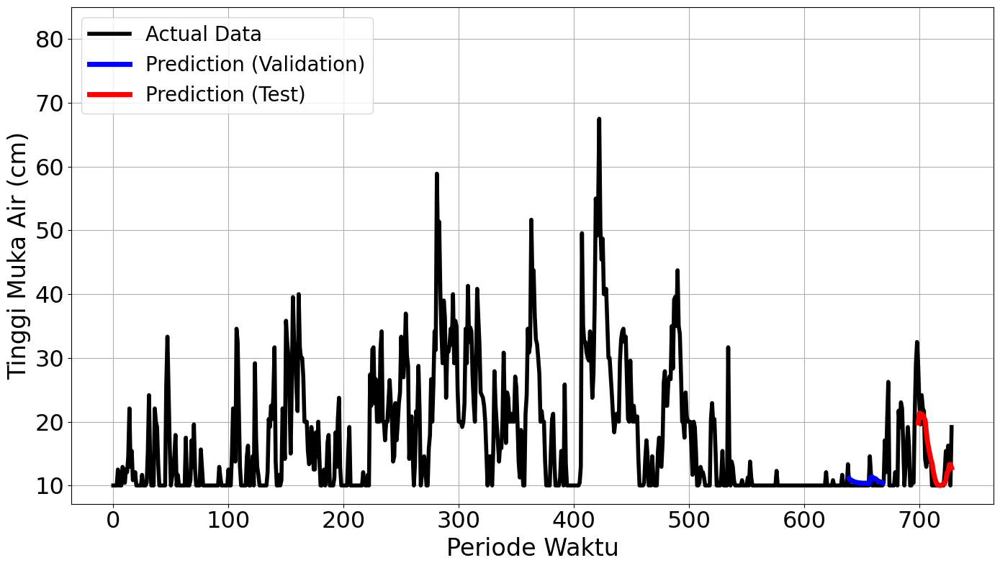

Epoch 1/100


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


52/52 ━━━━━━━━━━━━━━━━━━━━ 7s 54ms/step - loss: 0.1142 - val_loss: 0.0104
Epoch 2/100
52/52 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - loss: 0.0144 - val_loss: 0.0036
Epoch 3/100
52/52 ━━━━━━━━━━━━━━━━━━━━ 2s 35ms/step - loss: 0.0103 - val_loss: 0.0070
Epoch 4/100
52/52 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - loss: 0.0088 - val_loss: 0.0032
Epoch 5/100
52/52 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.0079 - val_loss: 0.0053
Epoch 6/100
52/52 ━━━━━━━━━━━━━━━━━━━━ 3s 43ms/step - loss: 0.0064 - val_loss: 0.0033
Epoch 7/100
52/52 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - loss: 0.0072 - val_loss: 0.0031
Epoch 8/100
52/52 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - loss: 0.0093 - val_loss: 0.0049
Epoch 9/100
52/52 ━━━━━━━━━━━━━━━━━━━━ 2s 35ms/step - loss: 0.0079 - val_loss: 0.0030
Epoch 10/100
52/52 ━━━━━━━━━━━━━━━━━━━━ 2s 35ms/step - loss: 0.0077 - val_loss: 0.0036
Epoch 11/100
52/52 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step - loss: 0.0070 - val_loss: 0.0034
Epoch 12/100
52/52 ━━━━━━━━━━━━━━━━━━━━ 2s 38ms/step - loss: 0.0

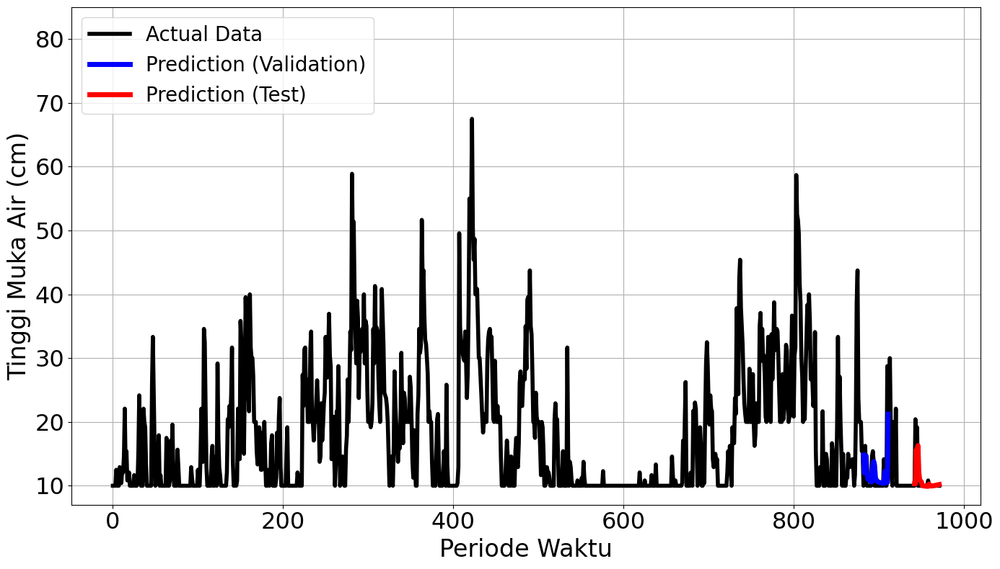

Epoch 1/100


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


67/67 ━━━━━━━━━━━━━━━━━━━━ 8s 47ms/step - loss: 0.0854 - val_loss: 0.0265
Epoch 2/100
67/67 ━━━━━━━━━━━━━━━━━━━━ 4s 35ms/step - loss: 0.0140 - val_loss: 0.0179
Epoch 3/100
67/67 ━━━━━━━━━━━━━━━━━━━━ 3s 35ms/step - loss: 0.0090 - val_loss: 0.0157
Epoch 4/100
67/67 ━━━━━━━━━━━━━━━━━━━━ 2s 35ms/step - loss: 0.0080 - val_loss: 0.0145
Epoch 5/100
67/67 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.0070 - val_loss: 0.0120
Epoch 6/100
67/67 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - loss: 0.0073 - val_loss: 0.0113
Epoch 7/100
67/67 ━━━━━━━━━━━━━━━━━━━━ 3s 40ms/step - loss: 0.0078 - val_loss: 0.0111
Epoch 8/100
67/67 ━━━━━━━━━━━━━━━━━━━━ 5s 35ms/step - loss: 0.0074 - val_loss: 0.0117
Epoch 9/100
67/67 ━━━━━━━━━━━━━━━━━━━━ 3s 35ms/step - loss: 0.0071 - val_loss: 0.0103
Epoch 10/100
67/67 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step - loss: 0.0056 - val_loss: 0.0106
Epoch 11/100
67/67 ━━━━━━━━━━━━━━━━━━━━ 3s 41ms/step - loss: 0.0070 - val_loss: 0.0108
Epoch 12/100
67/67 ━━━━━━━━━━━━━━━━━━━━ 3s 39ms/step - loss: 0.0

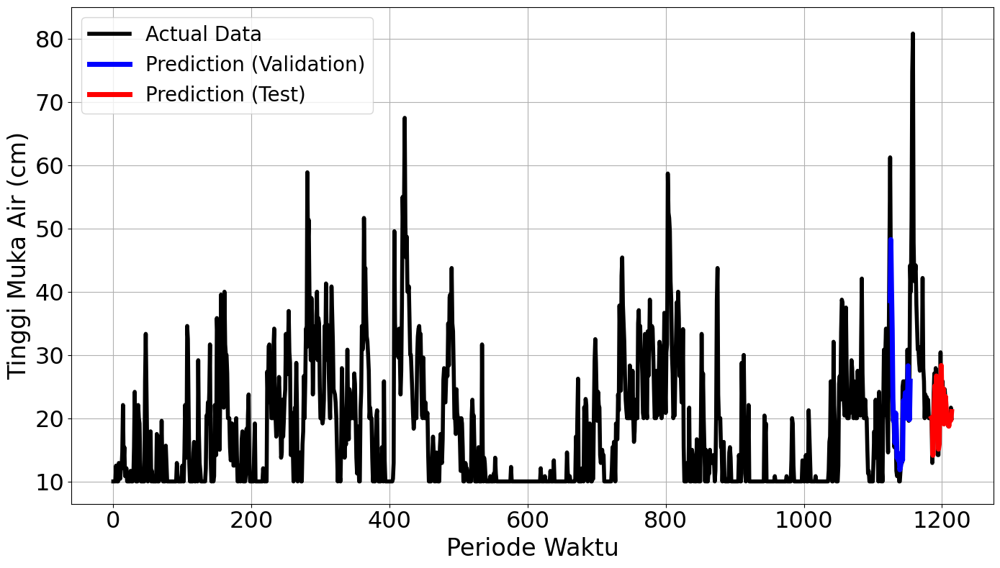

<Figure size 640x480 with 0 Axes>


Final Average MAPE Validation: 0.1979
Final Average MAPE Test: 0.1947
Epoch 1/100


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


6/6 ━━━━━━━━━━━━━━━━━━━━ 6s 199ms/step - loss: 0.1600 - val_loss: 0.0794
Epoch 2/100
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step - loss: 0.0881 - val_loss: 0.0330
Epoch 3/100
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step - loss: 0.0341 - val_loss: 0.0724
Epoch 4/100
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step - loss: 0.0247 - val_loss: 0.0643
Epoch 5/100
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step - loss: 0.0140 - val_loss: 0.0523
Epoch 6/100
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 46ms/step - loss: 0.0090 - val_loss: 0.0360
Epoch 7/100
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step - loss: 0.0069 - val_loss: 0.0279
Epoch 8/100
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step - loss: 0.0075 - val_loss: 0.0273
Epoch 9/100
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step - loss: 0.0080 - val_loss: 0.0256
Epoch 10/100
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 53ms/step - loss: 0.0048 - val_loss: 0.0320
Epoch 11/100
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step - loss: 0.0078 - val_loss: 0.0312
Epoch 12/100
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 50ms/step - loss: 0.0063 - val_loss: 0.0276


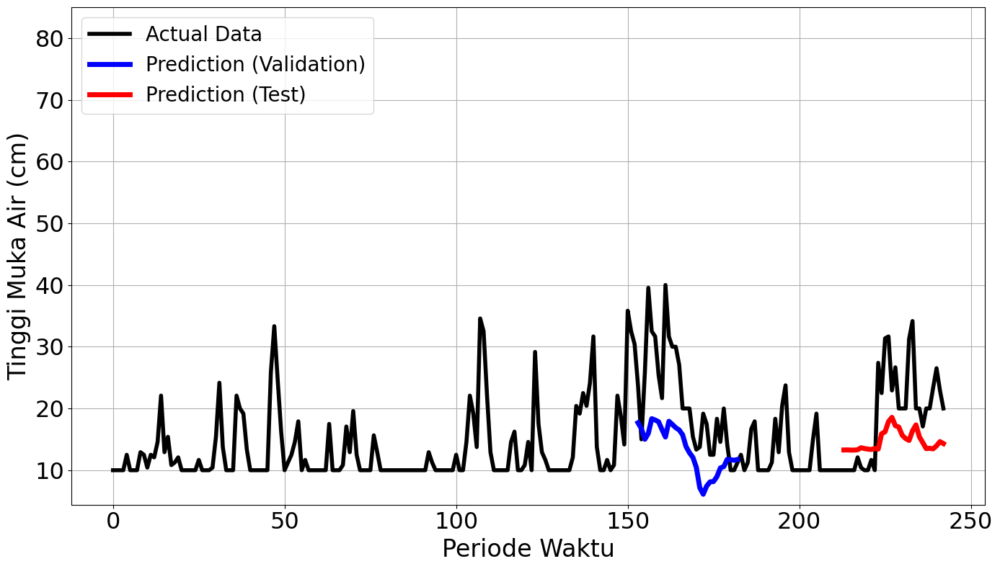

Epoch 1/100


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


21/21 ━━━━━━━━━━━━━━━━━━━━ 7s 73ms/step - loss: 0.0684 - val_loss: 0.0406
Epoch 2/100
21/21 ━━━━━━━━━━━━━━━━━━━━ 2s 38ms/step - loss: 0.0240 - val_loss: 0.0420
Epoch 3/100
21/21 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.0175 - val_loss: 0.0342
Epoch 4/100
21/21 ━━━━━━━━━━━━━━━━━━━━ 1s 39ms/step - loss: 0.0139 - val_loss: 0.0293
Epoch 5/100
21/21 ━━━━━━━━━━━━━━━━━━━━ 1s 40ms/step - loss: 0.0096 - val_loss: 0.0257
Epoch 6/100
21/21 ━━━━━━━━━━━━━━━━━━━━ 1s 39ms/step - loss: 0.0096 - val_loss: 0.0227
Epoch 7/100
21/21 ━━━━━━━━━━━━━━━━━━━━ 1s 41ms/step - loss: 0.0105 - val_loss: 0.0299
Epoch 8/100
21/21 ━━━━━━━━━━━━━━━━━━━━ 1s 50ms/step - loss: 0.0115 - val_loss: 0.0265
Epoch 9/100
21/21 ━━━━━━━━━━━━━━━━━━━━ 1s 48ms/step - loss: 0.0080 - val_loss: 0.0262
Epoch 10/100
21/21 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0094 - val_loss: 0.0251
Epoch 11/100
21/21 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.0073 - val_loss: 0.0222
Epoch 12/100
21/21 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 0.0

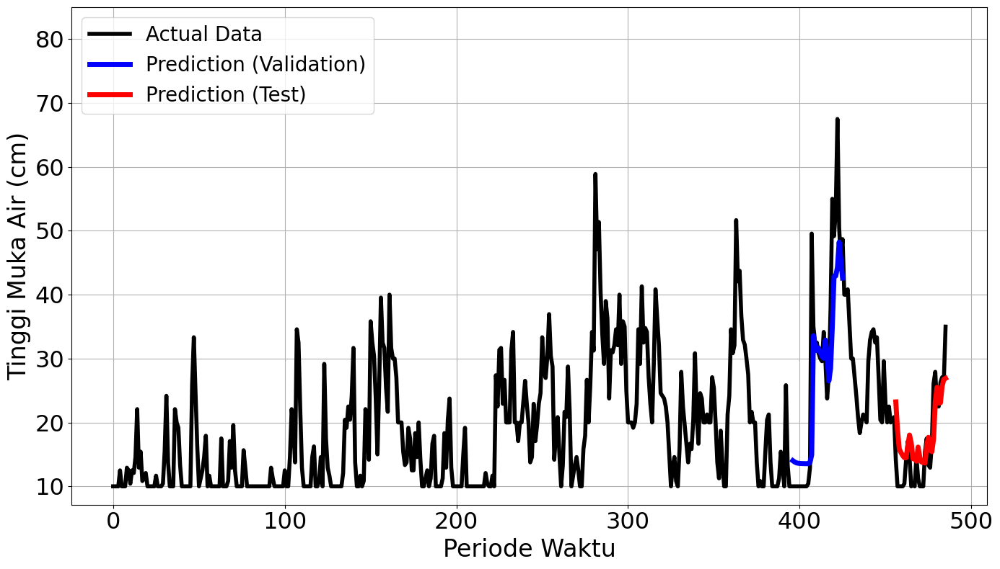

Epoch 1/100


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


37/37 ━━━━━━━━━━━━━━━━━━━━ 7s 55ms/step - loss: 0.0909 - val_loss: 9.0353e-04
Epoch 2/100
37/37 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.0136 - val_loss: 2.0356e-04
Epoch 3/100
37/37 ━━━━━━━━━━━━━━━━━━━━ 3s 40ms/step - loss: 0.0084 - val_loss: 2.5245e-04
Epoch 4/100
37/37 ━━━━━━━━━━━━━━━━━━━━ 2s 46ms/step - loss: 0.0077 - val_loss: 0.0014
Epoch 5/100
37/37 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.0093 - val_loss: 5.2755e-04
Epoch 6/100
37/37 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - loss: 0.0074 - val_loss: 2.6257e-04
Epoch 7/100
37/37 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step - loss: 0.0067Restoring model weights from the end of the best epoch.
37/37 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - loss: 0.0068 - val_loss: 2.2957e-04
Epoch 00007: early stopping
2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 449ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
mape validation = 6.747704974753926 %
mape test = 14.172315296015588 %


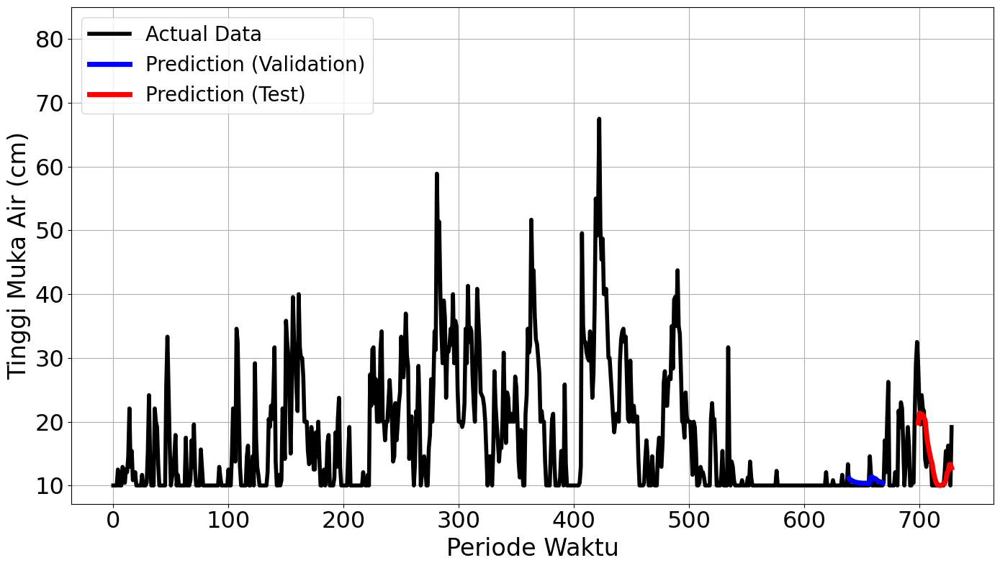

Epoch 1/100


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


52/52 ━━━━━━━━━━━━━━━━━━━━ 8s 54ms/step - loss: 0.1142 - val_loss: 0.0104
Epoch 2/100
52/52 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - loss: 0.0144 - val_loss: 0.0036
Epoch 3/100
52/52 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - loss: 0.0103 - val_loss: 0.0070
Epoch 4/100
52/52 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.0088 - val_loss: 0.0032
Epoch 5/100
52/52 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step - loss: 0.0079 - val_loss: 0.0053
Epoch 6/100
52/52 ━━━━━━━━━━━━━━━━━━━━ 3s 40ms/step - loss: 0.0064 - val_loss: 0.0033
Epoch 7/100
52/52 ━━━━━━━━━━━━━━━━━━━━ 2s 41ms/step - loss: 0.0072 - val_loss: 0.0031
Epoch 8/100
52/52 ━━━━━━━━━━━━━━━━━━━━ 2s 38ms/step - loss: 0.0093 - val_loss: 0.0049
Epoch 9/100
52/52 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - loss: 0.0079 - val_loss: 0.0030
Epoch 10/100
52/52 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step - loss: 0.0077 - val_loss: 0.0036
Epoch 11/100
52/52 ━━━━━━━━━━━━━━━━━━━━ 2s 35ms/step - loss: 0.0070 - val_loss: 0.0034
Epoch 12/100
52/52 ━━━━━━━━━━━━━━━━━━━━ 3s 41ms/step - loss: 0.0

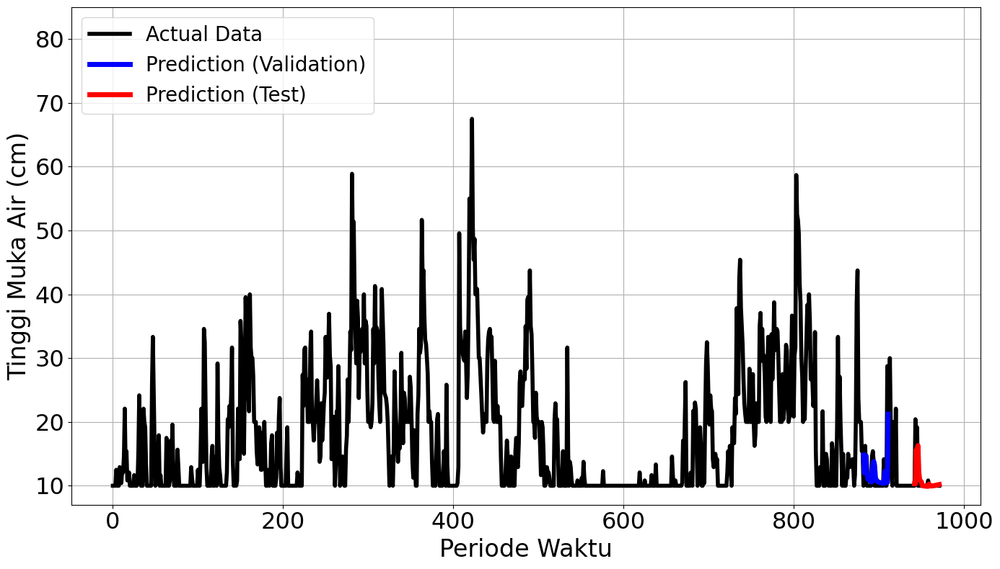

Epoch 1/100


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


67/67 ━━━━━━━━━━━━━━━━━━━━ 8s 48ms/step - loss: 0.0854 - val_loss: 0.0265
Epoch 2/100
67/67 ━━━━━━━━━━━━━━━━━━━━ 4s 35ms/step - loss: 0.0140 - val_loss: 0.0179
Epoch 3/100
67/67 ━━━━━━━━━━━━━━━━━━━━ 3s 35ms/step - loss: 0.0090 - val_loss: 0.0157
Epoch 4/100
67/67 ━━━━━━━━━━━━━━━━━━━━ 2s 35ms/step - loss: 0.0080 - val_loss: 0.0145
Epoch 5/100
67/67 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step - loss: 0.0070 - val_loss: 0.0120
Epoch 6/100
67/67 ━━━━━━━━━━━━━━━━━━━━ 3s 41ms/step - loss: 0.0073 - val_loss: 0.0113
Epoch 7/100
67/67 ━━━━━━━━━━━━━━━━━━━━ 3s 41ms/step - loss: 0.0078 - val_loss: 0.0111
Epoch 8/100
67/67 ━━━━━━━━━━━━━━━━━━━━ 2s 35ms/step - loss: 0.0074 - val_loss: 0.0117
Epoch 9/100
67/67 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step - loss: 0.0071 - val_loss: 0.0103
Epoch 10/100
67/67 ━━━━━━━━━━━━━━━━━━━━ 2s 35ms/step - loss: 0.0056 - val_loss: 0.0106
Epoch 11/100
67/67 ━━━━━━━━━━━━━━━━━━━━ 3s 38ms/step - loss: 0.0070 - val_loss: 0.0108
Epoch 12/100
67/67 ━━━━━━━━━━━━━━━━━━━━ 3s 40ms/step - loss: 0.0

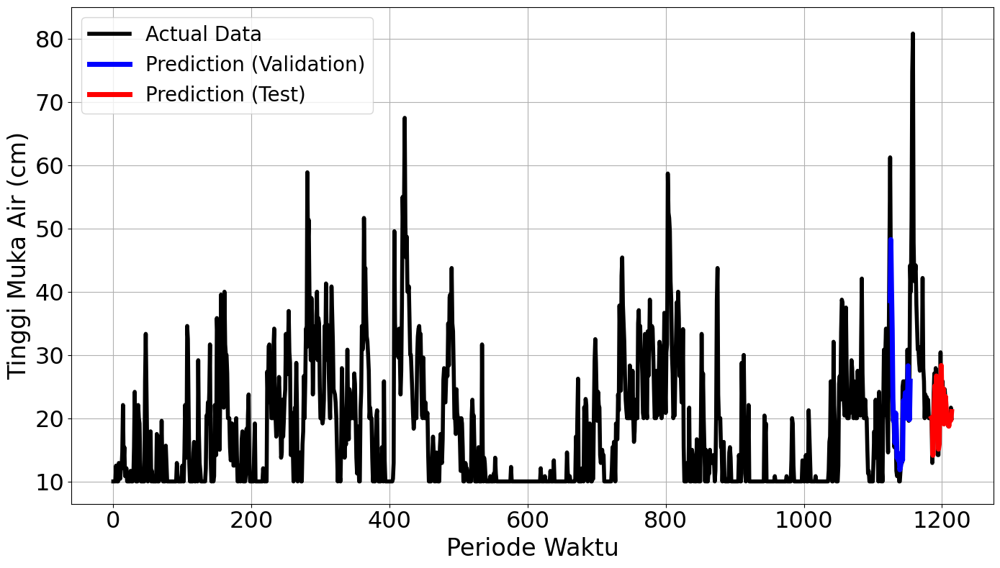

<Figure size 640x480 with 0 Axes>


Final Average MAPE Validation: 0.1979
Final Average MAPE Test: 0.1947
Epoch 1/100


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


3/3 ━━━━━━━━━━━━━━━━━━━━ 6s 556ms/step - loss: 0.1082 - val_loss: 0.0692
Epoch 2/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 117ms/step - loss: 0.0568 - val_loss: 0.0717
Epoch 3/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 84ms/step - loss: 0.0333 - val_loss: 0.0630
Epoch 4/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 97ms/step - loss: 0.0181 - val_loss: 0.0308
Epoch 5/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 83ms/step - loss: 0.0148 - val_loss: 0.0242
Epoch 6/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 104ms/step - loss: 0.0144 - val_loss: 0.0251
Epoch 7/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 83ms/step - loss: 0.0109 - val_loss: 0.0193
Epoch 8/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 83ms/step - loss: 0.0108 - val_loss: 0.0171
Epoch 9/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 86ms/step - loss: 0.0069 - val_loss: 0.0183
Epoch 10/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.0073 - val_loss: 0.0187
Epoch 11/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 84ms/step - loss: 0.0070 - val_loss: 0.0182
Epoch 12/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 83ms/step - loss: 0.0059 - val_loss: 0.017

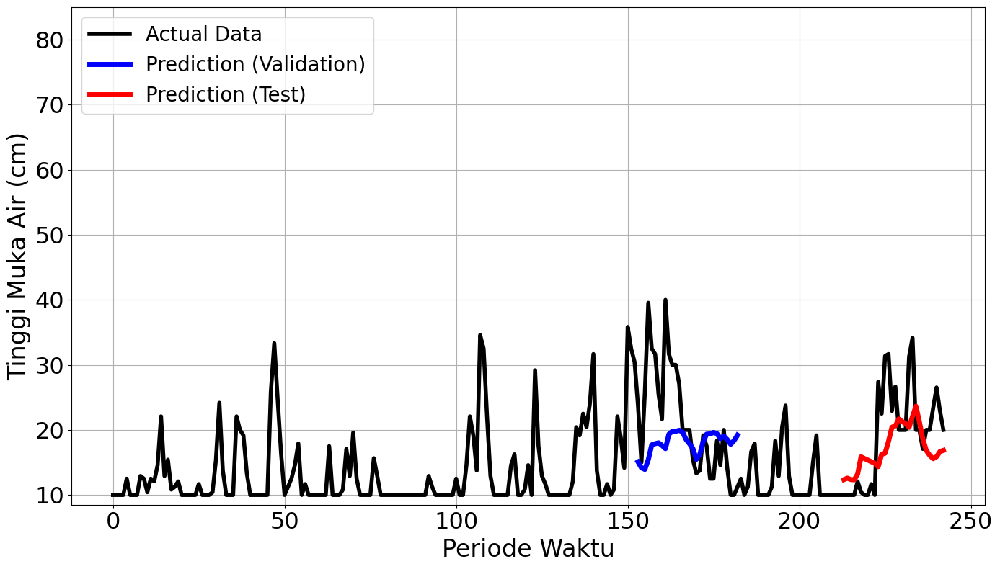

Epoch 1/100


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


11/11 ━━━━━━━━━━━━━━━━━━━━ 6s 125ms/step - loss: 0.1690 - val_loss: 0.0524
Epoch 2/100
11/11 ━━━━━━━━━━━━━━━━━━━━ 1s 55ms/step - loss: 0.0479 - val_loss: 0.0429
Epoch 3/100
11/11 ━━━━━━━━━━━━━━━━━━━━ 1s 58ms/step - loss: 0.0278 - val_loss: 0.0374
Epoch 4/100
11/11 ━━━━━━━━━━━━━━━━━━━━ 1s 58ms/step - loss: 0.0282 - val_loss: 0.0483
Epoch 5/100
11/11 ━━━━━━━━━━━━━━━━━━━━ 1s 51ms/step - loss: 0.0165 - val_loss: 0.0368
Epoch 6/100
11/11 ━━━━━━━━━━━━━━━━━━━━ 1s 57ms/step - loss: 0.0125 - val_loss: 0.0351
Epoch 7/100
11/11 ━━━━━━━━━━━━━━━━━━━━ 1s 51ms/step - loss: 0.0117 - val_loss: 0.0297
Epoch 8/100
11/11 ━━━━━━━━━━━━━━━━━━━━ 1s 45ms/step - loss: 0.0116 - val_loss: 0.0323
Epoch 9/100
11/11 ━━━━━━━━━━━━━━━━━━━━ 1s 47ms/step - loss: 0.0108 - val_loss: 0.0285
Epoch 10/100
11/11 ━━━━━━━━━━━━━━━━━━━━ 1s 47ms/step - loss: 0.0106 - val_loss: 0.0290
Epoch 11/100
11/11 ━━━━━━━━━━━━━━━━━━━━ 1s 43ms/step - loss: 0.0095 - val_loss: 0.0252
Epoch 12/100
11/11 ━━━━━━━━━━━━━━━━━━━━ 1s 46ms/step - loss: 0.

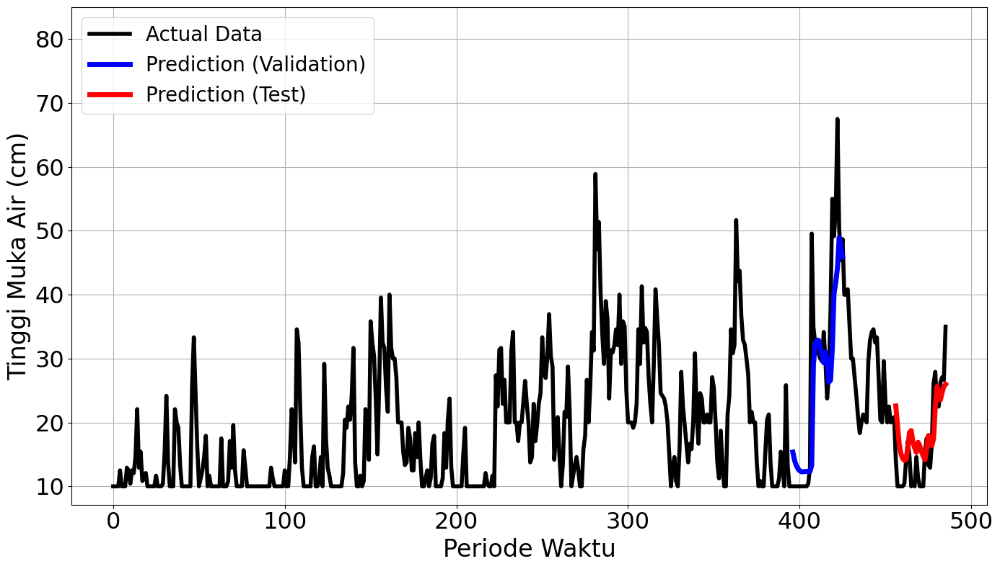

/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Epoch 1/100


/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


19/19 ━━━━━━━━━━━━━━━━━━━━ 7s 81ms/step - loss: 0.1242 - val_loss: 0.0022
Epoch 2/100
19/19 ━━━━━━━━━━━━━━━━━━━━ 2s 46ms/step - loss: 0.0243 - val_loss: 0.0011
Epoch 3/100
19/19 ━━━━━━━━━━━━━━━━━━━━ 1s 51ms/step - loss: 0.0107 - val_loss: 2.6064e-04
Epoch 4/100
19/19 ━━━━━━━━━━━━━━━━━━━━ 1s 45ms/step - loss: 0.0122 - val_loss: 0.0016
Epoch 5/100
19/19 ━━━━━━━━━━━━━━━━━━━━ 1s 47ms/step - loss: 0.0104 - val_loss: 2.5599e-04
Epoch 6/100
19/19 ━━━━━━━━━━━━━━━━━━━━ 1s 45ms/step - loss: 0.0098 - val_loss: 2.0761e-04
Epoch 7/100
19/19 ━━━━━━━━━━━━━━━━━━━━ 1s 44ms/step - loss: 0.0081 - val_loss: 4.3950e-04
Epoch 8/100
19/19 ━━━━━━━━━━━━━━━━━━━━ 1s 43ms/step - loss: 0.0067 - val_loss: 4.6466e-04
Epoch 9/100
19/19 ━━━━━━━━━━━━━━━━━━━━ 1s 43ms/step - loss: 0.0081 - val_loss: 4.6921e-04
Epoch 10/100
19/19 ━━━━━━━━━━━━━━━━━━━━ 1s 43ms/step - loss: 0.0078 - val_loss: 2.3865e-04
Epoch 11/100
19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.0066Restoring model weights from the end of the best epoch.


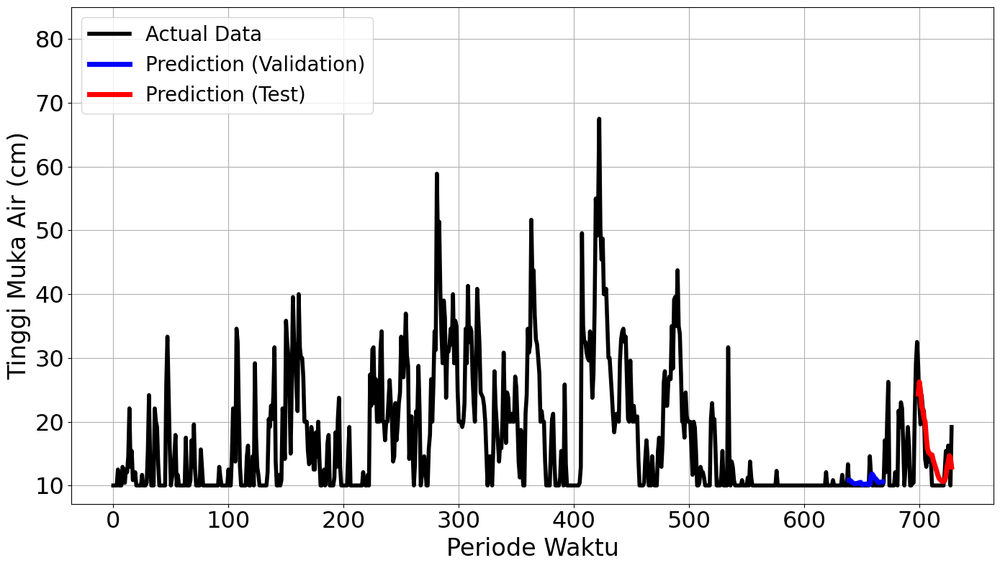

Epoch 1/100


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


26/26 ━━━━━━━━━━━━━━━━━━━━ 7s 77ms/step - loss: 0.0584 - val_loss: 0.0074
Epoch 2/100
26/26 ━━━━━━━━━━━━━━━━━━━━ 1s 46ms/step - loss: 0.0199 - val_loss: 0.0035
Epoch 3/100
26/26 ━━━━━━━━━━━━━━━━━━━━ 1s 42ms/step - loss: 0.0128 - val_loss: 0.0034
Epoch 4/100
26/26 ━━━━━━━━━━━━━━━━━━━━ 1s 40ms/step - loss: 0.0081 - val_loss: 0.0033
Epoch 5/100
26/26 ━━━━━━━━━━━━━━━━━━━━ 1s 41ms/step - loss: 0.0078 - val_loss: 0.0034
Epoch 6/100
26/26 ━━━━━━━━━━━━━━━━━━━━ 1s 42ms/step - loss: 0.0083 - val_loss: 0.0034
Epoch 7/100
26/26 ━━━━━━━━━━━━━━━━━━━━ 1s 40ms/step - loss: 0.0071 - val_loss: 0.0053
Epoch 8/100
26/26 ━━━━━━━━━━━━━━━━━━━━ 1s 40ms/step - loss: 0.0089 - val_loss: 0.0035
Epoch 9/100
25/26 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step - loss: 0.0068Restoring model weights from the end of the best epoch.
26/26 ━━━━━━━━━━━━━━━━━━━━ 1s 42ms/step - loss: 0.0068 - val_loss: 0.0041
Epoch 00009: early stopping
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 471ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step
mape validation = 21.83

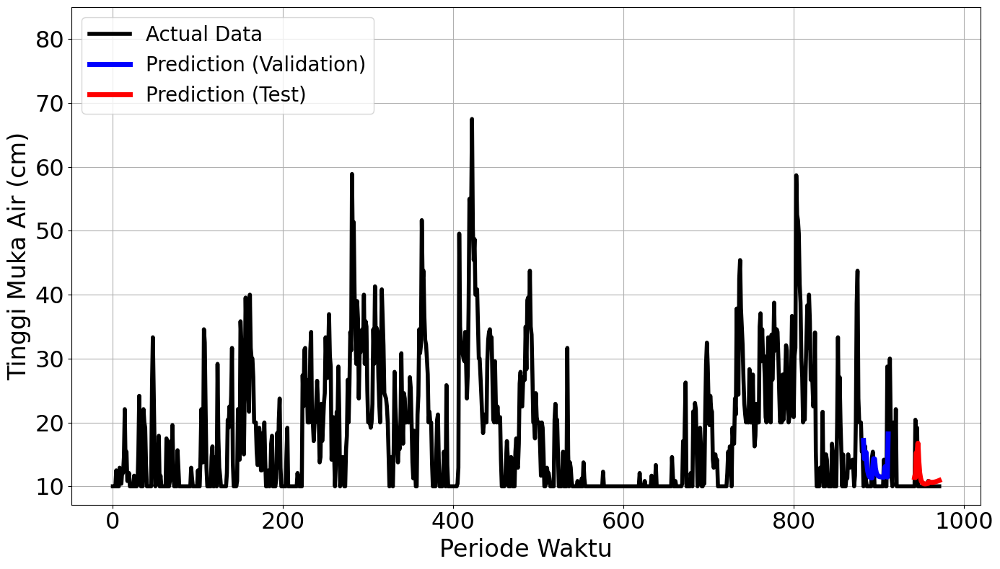

Epoch 1/100


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


34/34 ━━━━━━━━━━━━━━━━━━━━ 8s 61ms/step - loss: 0.1347 - val_loss: 0.0246
Epoch 2/100
34/34 ━━━━━━━━━━━━━━━━━━━━ 1s 41ms/step - loss: 0.0130 - val_loss: 0.0222
Epoch 3/100
34/34 ━━━━━━━━━━━━━━━━━━━━ 1s 41ms/step - loss: 0.0122 - val_loss: 0.0165
Epoch 4/100
34/34 ━━━━━━━━━━━━━━━━━━━━ 1s 39ms/step - loss: 0.0093 - val_loss: 0.0163
Epoch 5/100
34/34 ━━━━━━━━━━━━━━━━━━━━ 1s 40ms/step - loss: 0.0101 - val_loss: 0.0156
Epoch 6/100
34/34 ━━━━━━━━━━━━━━━━━━━━ 3s 46ms/step - loss: 0.0071 - val_loss: 0.0163
Epoch 7/100
34/34 ━━━━━━━━━━━━━━━━━━━━ 3s 49ms/step - loss: 0.0093 - val_loss: 0.0132
Epoch 8/100
34/34 ━━━━━━━━━━━━━━━━━━━━ 2s 43ms/step - loss: 0.0060 - val_loss: 0.0120
Epoch 9/100
34/34 ━━━━━━━━━━━━━━━━━━━━ 1s 41ms/step - loss: 0.0065 - val_loss: 0.0117
Epoch 10/100
34/34 ━━━━━━━━━━━━━━━━━━━━ 3s 44ms/step - loss: 0.0068 - val_loss: 0.0103
Epoch 11/100
34/34 ━━━━━━━━━━━━━━━━━━━━ 1s 42ms/step - loss: 0.0080 - val_loss: 0.0115
Epoch 12/100
34/34 ━━━━━━━━━━━━━━━━━━━━ 1s 41ms/step - loss: 0.0

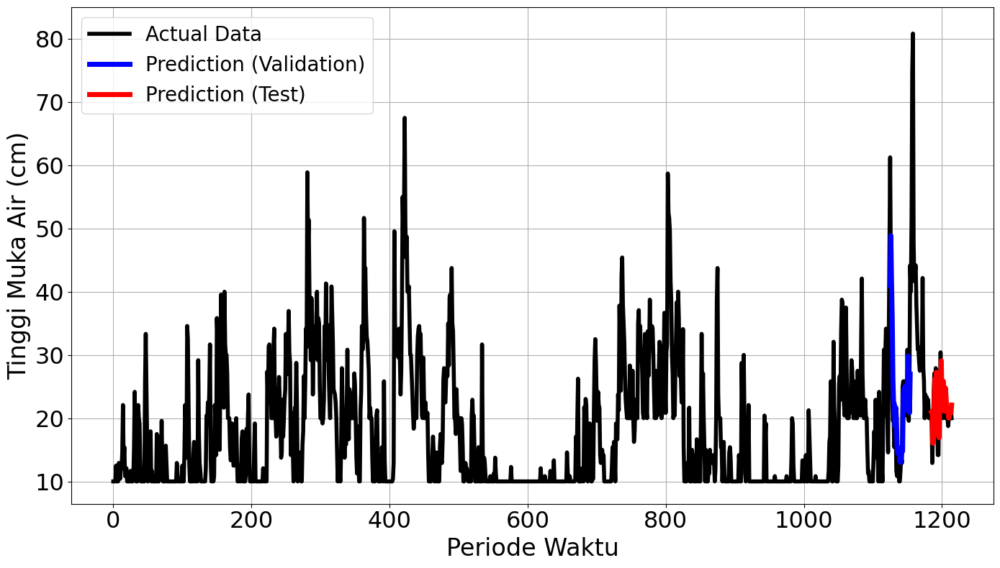

<Figure size 640x480 with 0 Axes>


Final Average MAPE Validation: 0.2080
Final Average MAPE Test: 0.2170
Epoch 1/100


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


3/3 ━━━━━━━━━━━━━━━━━━━━ 6s 417ms/step - loss: 0.1082 - val_loss: 0.0692
Epoch 2/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 83ms/step - loss: 0.0568 - val_loss: 0.0717
Epoch 3/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 83ms/step - loss: 0.0333 - val_loss: 0.0630
Epoch 4/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 90ms/step - loss: 0.0181 - val_loss: 0.0308
Epoch 5/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 82ms/step - loss: 0.0148 - val_loss: 0.0242
Epoch 6/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 85ms/step - loss: 0.0144 - val_loss: 0.0251
Epoch 7/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 82ms/step - loss: 0.0109 - val_loss: 0.0193
Epoch 8/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step - loss: 0.0108 - val_loss: 0.0171
Epoch 9/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 81ms/step - loss: 0.0069 - val_loss: 0.0183
Epoch 10/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 84ms/step - loss: 0.0073 - val_loss: 0.0187
Epoch 11/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 82ms/step - loss: 0.0070 - val_loss: 0.0182
Epoch 12/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 79ms/step - loss: 0.0059 - val_loss: 0.0173


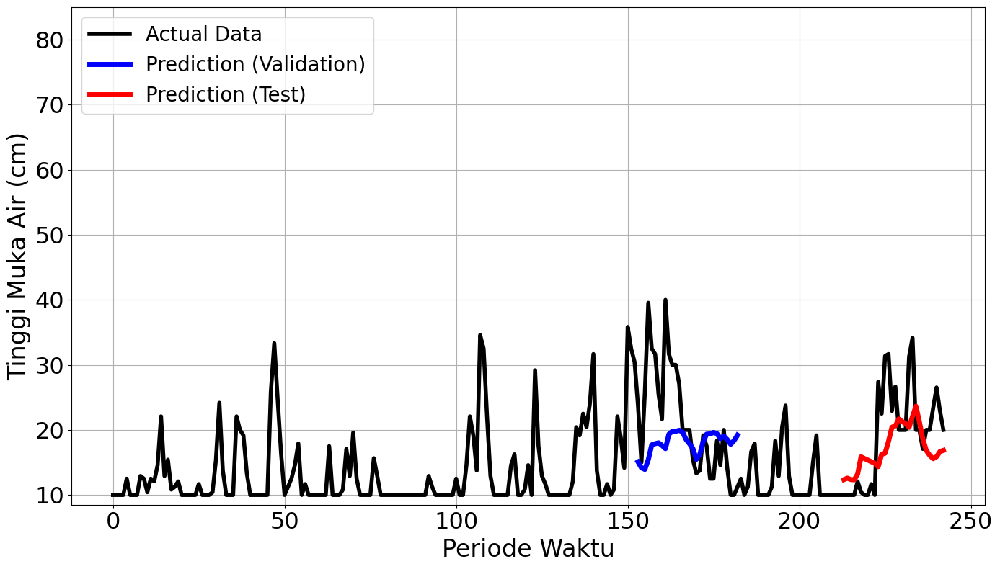

Epoch 1/100


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


11/11 ━━━━━━━━━━━━━━━━━━━━ 7s 111ms/step - loss: 0.1690 - val_loss: 0.0524
Epoch 2/100
11/11 ━━━━━━━━━━━━━━━━━━━━ 1s 47ms/step - loss: 0.0479 - val_loss: 0.0429
Epoch 3/100
11/11 ━━━━━━━━━━━━━━━━━━━━ 1s 46ms/step - loss: 0.0278 - val_loss: 0.0374
Epoch 4/100
11/11 ━━━━━━━━━━━━━━━━━━━━ 1s 43ms/step - loss: 0.0282 - val_loss: 0.0483
Epoch 5/100
11/11 ━━━━━━━━━━━━━━━━━━━━ 1s 44ms/step - loss: 0.0165 - val_loss: 0.0368
Epoch 6/100
11/11 ━━━━━━━━━━━━━━━━━━━━ 1s 46ms/step - loss: 0.0125 - val_loss: 0.0351
Epoch 7/100
11/11 ━━━━━━━━━━━━━━━━━━━━ 1s 43ms/step - loss: 0.0117 - val_loss: 0.0297
Epoch 8/100
11/11 ━━━━━━━━━━━━━━━━━━━━ 1s 43ms/step - loss: 0.0116 - val_loss: 0.0323
Epoch 9/100
11/11 ━━━━━━━━━━━━━━━━━━━━ 1s 48ms/step - loss: 0.0108 - val_loss: 0.0285
Epoch 10/100
11/11 ━━━━━━━━━━━━━━━━━━━━ 1s 44ms/step - loss: 0.0106 - val_loss: 0.0290
Epoch 11/100
11/11 ━━━━━━━━━━━━━━━━━━━━ 1s 45ms/step - loss: 0.0095 - val_loss: 0.0252
Epoch 12/100
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step - loss: 0.

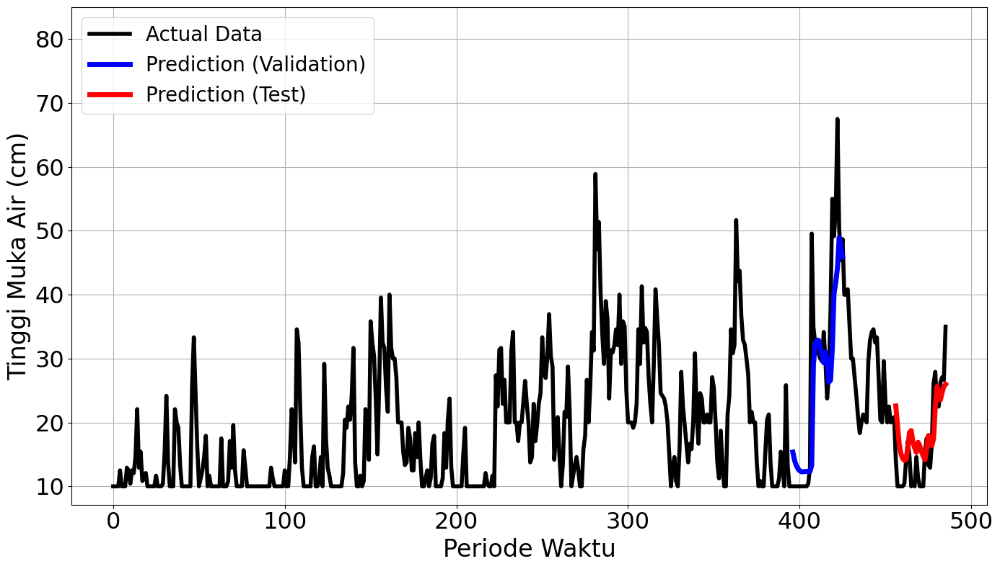

Epoch 1/100


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


19/19 ━━━━━━━━━━━━━━━━━━━━ 6s 88ms/step - loss: 0.1242 - val_loss: 0.0022
Epoch 2/100
19/19 ━━━━━━━━━━━━━━━━━━━━ 2s 49ms/step - loss: 0.0243 - val_loss: 0.0011
Epoch 3/100
19/19 ━━━━━━━━━━━━━━━━━━━━ 1s 47ms/step - loss: 0.0107 - val_loss: 2.6064e-04
Epoch 4/100
19/19 ━━━━━━━━━━━━━━━━━━━━ 1s 42ms/step - loss: 0.0122 - val_loss: 0.0016
Epoch 5/100
19/19 ━━━━━━━━━━━━━━━━━━━━ 1s 44ms/step - loss: 0.0104 - val_loss: 2.5599e-04
Epoch 6/100
19/19 ━━━━━━━━━━━━━━━━━━━━ 1s 43ms/step - loss: 0.0098 - val_loss: 2.0761e-04
Epoch 7/100
19/19 ━━━━━━━━━━━━━━━━━━━━ 1s 42ms/step - loss: 0.0081 - val_loss: 4.3950e-04
Epoch 8/100
19/19 ━━━━━━━━━━━━━━━━━━━━ 1s 41ms/step - loss: 0.0067 - val_loss: 4.6466e-04
Epoch 9/100
19/19 ━━━━━━━━━━━━━━━━━━━━ 1s 43ms/step - loss: 0.0081 - val_loss: 4.6921e-04
Epoch 10/100
19/19 ━━━━━━━━━━━━━━━━━━━━ 1s 41ms/step - loss: 0.0078 - val_loss: 2.3865e-04
Epoch 11/100
18/19 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step - loss: 0.0065Restoring model weights from the end of the best epoch.


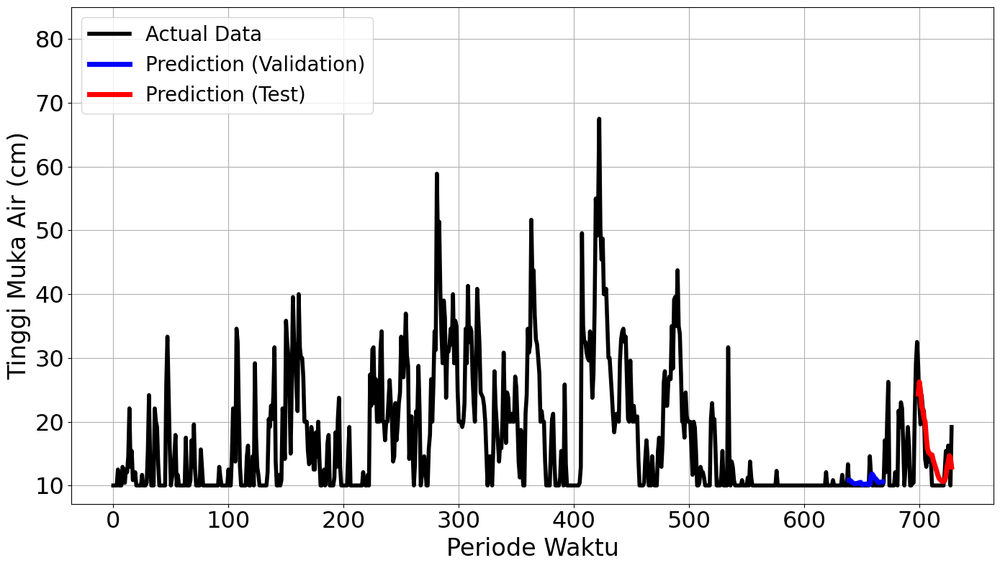

Epoch 1/100


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


26/26 ━━━━━━━━━━━━━━━━━━━━ 7s 70ms/step - loss: 0.0584 - val_loss: 0.0074
Epoch 2/100
26/26 ━━━━━━━━━━━━━━━━━━━━ 2s 41ms/step - loss: 0.0199 - val_loss: 0.0035
Epoch 3/100
26/26 ━━━━━━━━━━━━━━━━━━━━ 1s 41ms/step - loss: 0.0128 - val_loss: 0.0034
Epoch 4/100
26/26 ━━━━━━━━━━━━━━━━━━━━ 1s 42ms/step - loss: 0.0081 - val_loss: 0.0033
Epoch 5/100
26/26 ━━━━━━━━━━━━━━━━━━━━ 1s 40ms/step - loss: 0.0078 - val_loss: 0.0034
Epoch 6/100
26/26 ━━━━━━━━━━━━━━━━━━━━ 1s 43ms/step - loss: 0.0083 - val_loss: 0.0034
Epoch 7/100
26/26 ━━━━━━━━━━━━━━━━━━━━ 1s 41ms/step - loss: 0.0071 - val_loss: 0.0053
Epoch 8/100
26/26 ━━━━━━━━━━━━━━━━━━━━ 1s 46ms/step - loss: 0.0089 - val_loss: 0.0035
Epoch 9/100
25/26 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step - loss: 0.0068Restoring model weights from the end of the best epoch.
26/26 ━━━━━━━━━━━━━━━━━━━━ 1s 46ms/step - loss: 0.0068 - val_loss: 0.0041
Epoch 00009: early stopping
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 505ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step
mape validation = 21.83

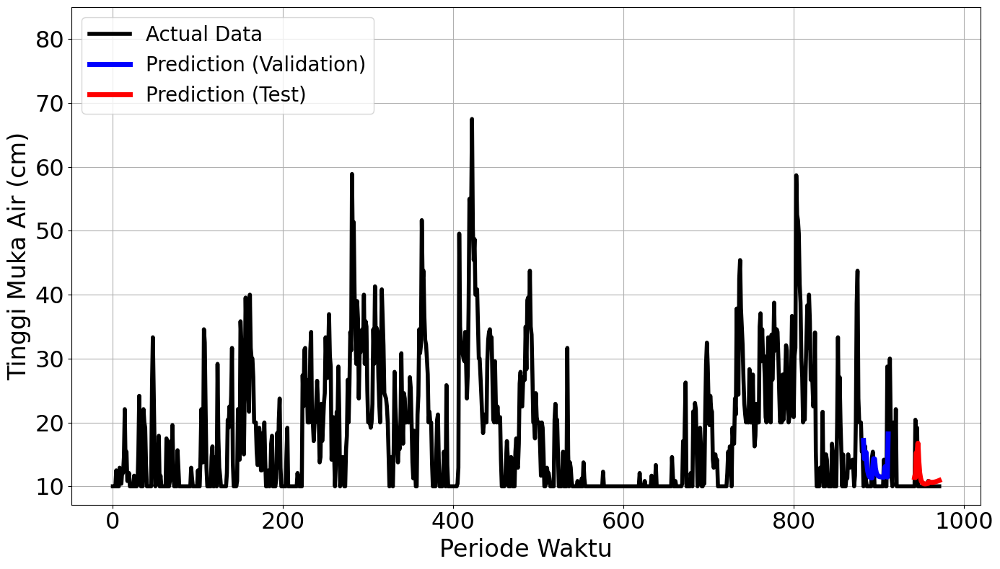

/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


Epoch 1/100
34/34 ━━━━━━━━━━━━━━━━━━━━ 7s 59ms/step - loss: 0.1347 - val_loss: 0.0246
Epoch 2/100
34/34 ━━━━━━━━━━━━━━━━━━━━ 2s 40ms/step - loss: 0.0130 - val_loss: 0.0222
Epoch 3/100
34/34 ━━━━━━━━━━━━━━━━━━━━ 3s 42ms/step - loss: 0.0122 - val_loss: 0.0165
Epoch 4/100
34/34 ━━━━━━━━━━━━━━━━━━━━ 3s 48ms/step - loss: 0.0093 - val_loss: 0.0163
Epoch 5/100
34/34 ━━━━━━━━━━━━━━━━━━━━ 2s 45ms/step - loss: 0.0101 - val_loss: 0.0156
Epoch 6/100
34/34 ━━━━━━━━━━━━━━━━━━━━ 1s 40ms/step - loss: 0.0071 - val_loss: 0.0163
Epoch 7/100
34/34 ━━━━━━━━━━━━━━━━━━━━ 3s 39ms/step - loss: 0.0093 - val_loss: 0.0132
Epoch 8/100
34/34 ━━━━━━━━━━━━━━━━━━━━ 1s 40ms/step - loss: 0.0060 - val_loss: 0.0120
Epoch 9/100
34/34 ━━━━━━━━━━━━━━━━━━━━ 3s 40ms/step - loss: 0.0065 - val_loss: 0.0117
Epoch 10/100
34/34 ━━━━━━━━━━━━━━━━━━━━ 3s 46ms/step - loss: 0.0068 - val_loss: 0.0103
Epoch 11/100
34/34 ━━━━━━━━━━━━━━━━━━━━ 3s 48ms/step - loss: 0.0080 - val_loss: 0.0115
Epoch 12/100
34/34 ━━━━━━━━━━━━━━━━━━━━ 2s 40ms/step

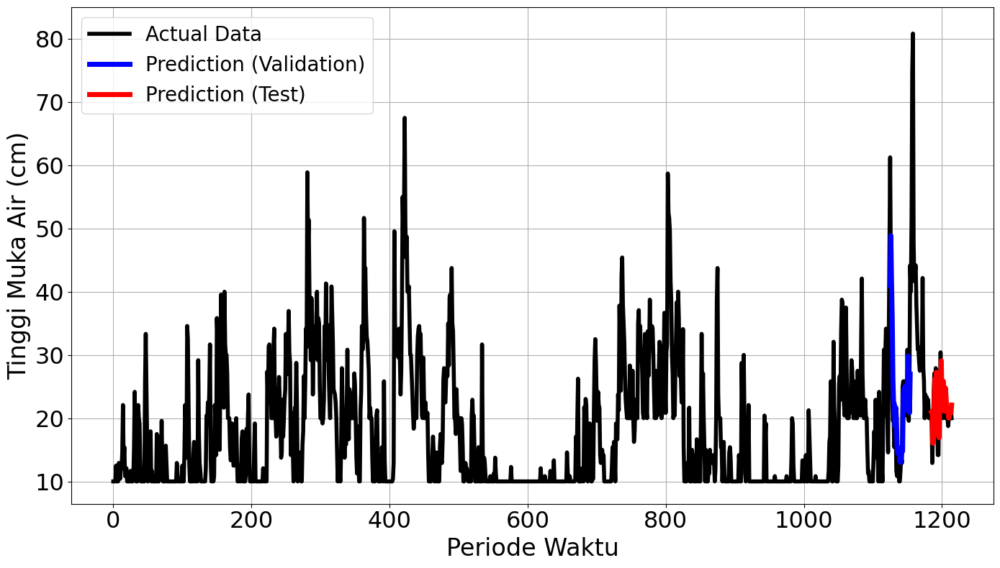

<Figure size 640x480 with 0 Axes>


Final Average MAPE Validation: 0.2080
Final Average MAPE Test: 0.2170
Epoch 1/100


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


2/2 ━━━━━━━━━━━━━━━━━━━━ 6s 1s/step - loss: 0.2882 - val_loss: 0.2686
Epoch 2/100
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 184ms/step - loss: 0.0825 - val_loss: 0.0885
Epoch 3/100
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 154ms/step - loss: 0.0454 - val_loss: 0.0221
Epoch 4/100
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 113ms/step - loss: 0.0261 - val_loss: 0.0273
Epoch 5/100
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step - loss: 0.0279 - val_loss: 0.0354
Epoch 6/100
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 135ms/step - loss: 0.0337 - val_loss: 0.0269
Epoch 7/100
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step - loss: 0.0171 - val_loss: 0.0207
Epoch 8/100
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 162ms/step - loss: 0.0168 - val_loss: 0.0218
Epoch 9/100
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - loss: 0.0204 - val_loss: 0.0172
Epoch 10/100
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 139ms/step - loss: 0.0104 - val_loss: 0.0119
Epoch 11/100
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 140ms/step - loss: 0.0078 - val_loss: 0.0097
Epoch 12/100
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 110ms/step - loss: 0.0110 - val_loss:

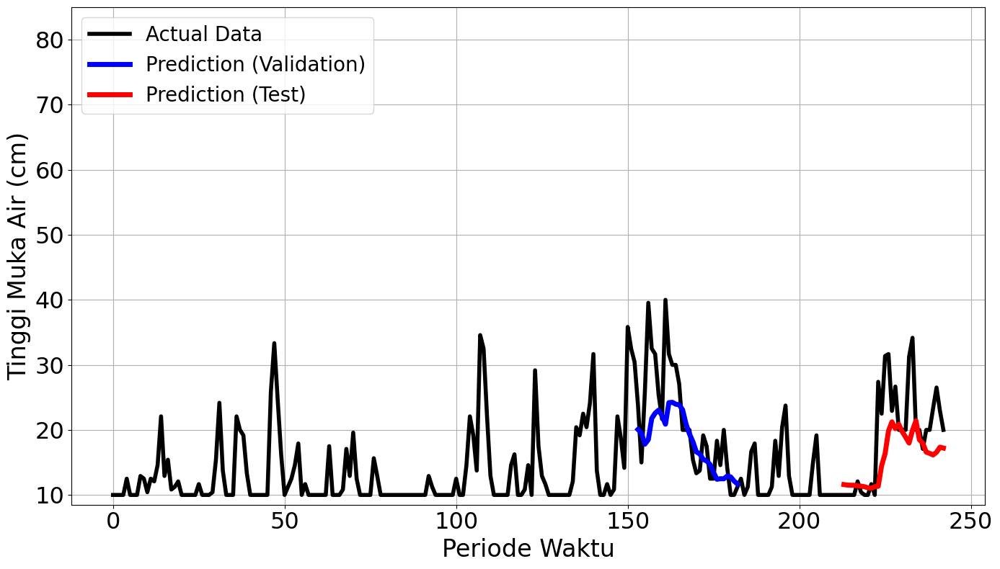

Epoch 1/100


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


6/6 ━━━━━━━━━━━━━━━━━━━━ 6s 212ms/step - loss: 0.1142 - val_loss: 0.0470
Epoch 2/100
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 78ms/step - loss: 0.0653 - val_loss: 0.0495
Epoch 3/100
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 75ms/step - loss: 0.0275 - val_loss: 0.0494
Epoch 4/100
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 75ms/step - loss: 0.0197 - val_loss: 0.0483
Epoch 5/100
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - loss: 0.0179 - val_loss: 0.0419
Epoch 6/100
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.0141 - val_loss: 0.0420
Epoch 7/100
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 60ms/step - loss: 0.0133 - val_loss: 0.0369
Epoch 8/100
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step - loss: 0.0108 - val_loss: 0.0360
Epoch 9/100
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 64ms/step - loss: 0.0127 - val_loss: 0.0397
Epoch 10/100
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 60ms/step - loss: 0.0107 - val_loss: 0.0322
Epoch 11/100
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 58ms/step - loss: 0.0114 - val_loss: 0.0372
Epoch 12/100
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step - loss: 0.0112 - val_loss: 0.0306


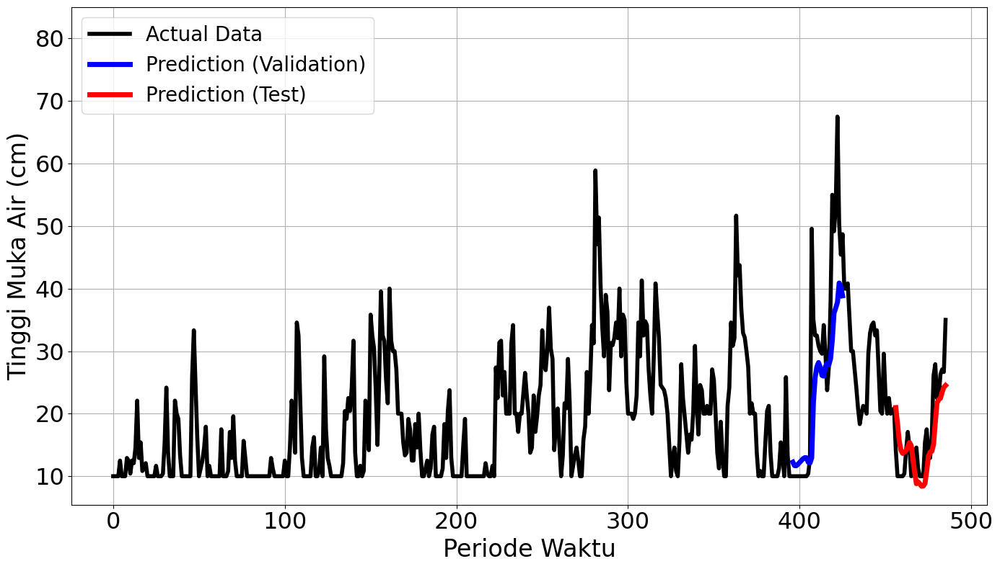

Epoch 1/100


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


10/10 ━━━━━━━━━━━━━━━━━━━━ 6s 125ms/step - loss: 0.1162 - val_loss: 0.0165
Epoch 2/100
10/10 ━━━━━━━━━━━━━━━━━━━━ 1s 57ms/step - loss: 0.0473 - val_loss: 0.0098
Epoch 3/100
10/10 ━━━━━━━━━━━━━━━━━━━━ 1s 53ms/step - loss: 0.0288 - val_loss: 0.0031
Epoch 4/100
10/10 ━━━━━━━━━━━━━━━━━━━━ 1s 52ms/step - loss: 0.0161 - val_loss: 0.0067
Epoch 5/100
10/10 ━━━━━━━━━━━━━━━━━━━━ 1s 51ms/step - loss: 0.0146 - val_loss: 0.0069
Epoch 6/100
10/10 ━━━━━━━━━━━━━━━━━━━━ 1s 54ms/step - loss: 0.0121 - val_loss: 1.7947e-04
Epoch 7/100
10/10 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.0113 - val_loss: 8.6774e-04
Epoch 8/100
10/10 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.0117 - val_loss: 0.0014
Epoch 9/100
10/10 ━━━━━━━━━━━━━━━━━━━━ 1s 64ms/step - loss: 0.0103 - val_loss: 1.6887e-04
Epoch 10/100
10/10 ━━━━━━━━━━━━━━━━━━━━ 1s 50ms/step - loss: 0.0092 - val_loss: 0.0011
Epoch 11/100
10/10 ━━━━━━━━━━━━━━━━━━━━ 1s 50ms/step - loss: 0.0079 - val_loss: 1.8224e-04
Epoch 12/100
10/10 ━━━━━━━━━━━━━━━━━━━━ 1s 54ms

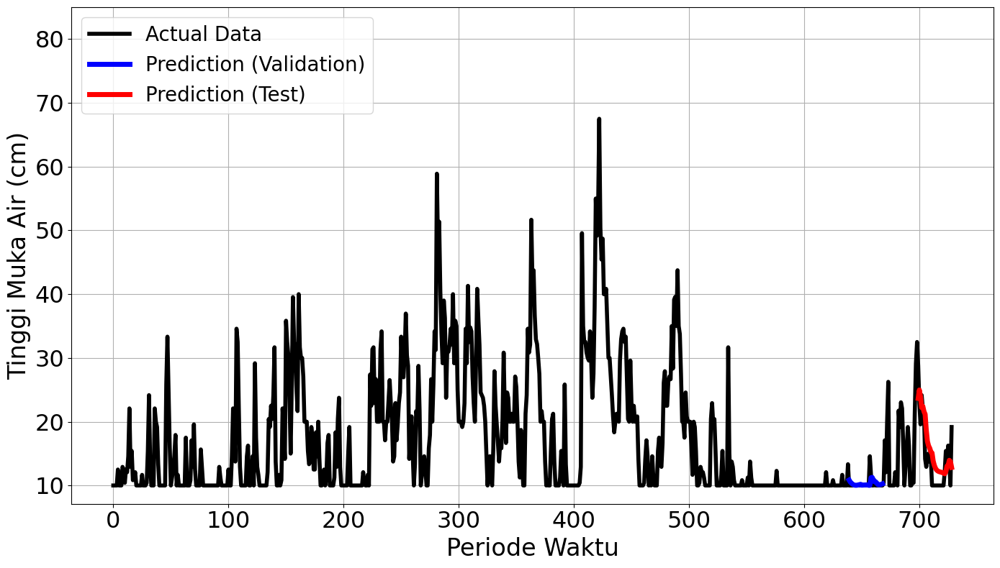

/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Epoch 1/100


/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


13/13 ━━━━━━━━━━━━━━━━━━━━ 18s 112ms/step - loss: 0.1016 - val_loss: 0.0117
Epoch 2/100
13/13 ━━━━━━━━━━━━━━━━━━━━ 2s 57ms/step - loss: 0.0312 - val_loss: 0.0044
Epoch 3/100
13/13 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - loss: 0.0164 - val_loss: 0.0040
Epoch 4/100
13/13 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.0119 - val_loss: 0.0039
Epoch 5/100
13/13 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - loss: 0.0101 - val_loss: 0.0038
Epoch 6/100
13/13 ━━━━━━━━━━━━━━━━━━━━ 1s 62ms/step - loss: 0.0081 - val_loss: 0.0051
Epoch 7/100
13/13 ━━━━━━━━━━━━━━━━━━━━ 1s 53ms/step - loss: 0.0098 - val_loss: 0.0048
Epoch 8/100
13/13 ━━━━━━━━━━━━━━━━━━━━ 1s 53ms/step - loss: 0.0085 - val_loss: 0.0054
Epoch 9/100
13/13 ━━━━━━━━━━━━━━━━━━━━ 1s 51ms/step - loss: 0.0080 - val_loss: 0.0050
Epoch 10/100
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step - loss: 0.0086Restoring model weights from the end of the best epoch.
13/13 ━━━━━━━━━━━━━━━━━━━━ 1s 54ms/step - loss: 0.0086 - val_loss: 0.0043
Epoch 00010: early stopping
1/1 ━━━━━━━

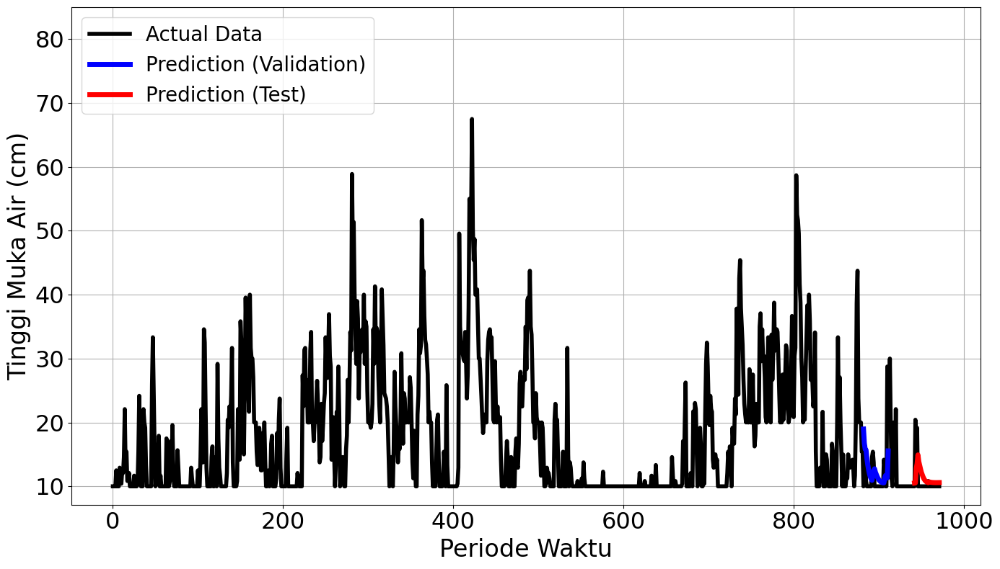

Epoch 1/100


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


17/17 ━━━━━━━━━━━━━━━━━━━━ 7s 116ms/step - loss: 0.1335 - val_loss: 0.0310
Epoch 2/100
17/17 ━━━━━━━━━━━━━━━━━━━━ 1s 57ms/step - loss: 0.0199 - val_loss: 0.0189
Epoch 3/100
17/17 ━━━━━━━━━━━━━━━━━━━━ 1s 57ms/step - loss: 0.0128 - val_loss: 0.0179
Epoch 4/100
17/17 ━━━━━━━━━━━━━━━━━━━━ 1s 52ms/step - loss: 0.0078 - val_loss: 0.0165
Epoch 5/100
17/17 ━━━━━━━━━━━━━━━━━━━━ 1s 49ms/step - loss: 0.0095 - val_loss: 0.0156
Epoch 6/100
17/17 ━━━━━━━━━━━━━━━━━━━━ 1s 50ms/step - loss: 0.0081 - val_loss: 0.0149
Epoch 7/100
17/17 ━━━━━━━━━━━━━━━━━━━━ 1s 48ms/step - loss: 0.0076 - val_loss: 0.0158
Epoch 8/100
17/17 ━━━━━━━━━━━━━━━━━━━━ 1s 48ms/step - loss: 0.0066 - val_loss: 0.0147
Epoch 9/100
17/17 ━━━━━━━━━━━━━━━━━━━━ 1s 52ms/step - loss: 0.0061 - val_loss: 0.0134
Epoch 10/100
17/17 ━━━━━━━━━━━━━━━━━━━━ 1s 50ms/step - loss: 0.0071 - val_loss: 0.0127
Epoch 11/100
17/17 ━━━━━━━━━━━━━━━━━━━━ 1s 49ms/step - loss: 0.0072 - val_loss: 0.0131
Epoch 12/100
17/17 ━━━━━━━━━━━━━━━━━━━━ 1s 51ms/step - loss: 0.

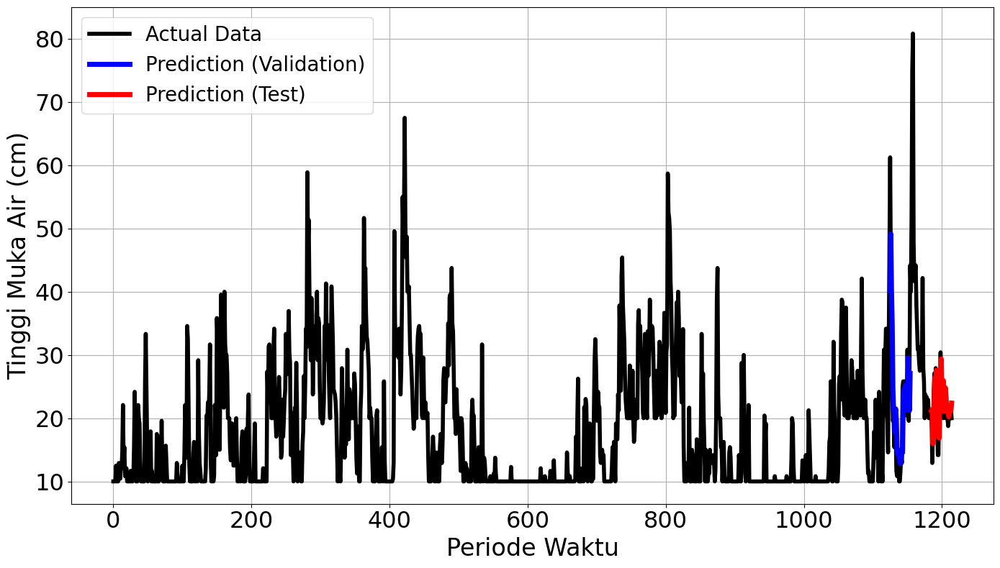

<Figure size 640x480 with 0 Axes>


Final Average MAPE Validation: 0.1825
Final Average MAPE Test: 0.1936
Epoch 1/100


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


2/2 ━━━━━━━━━━━━━━━━━━━━ 6s 798ms/step - loss: 0.2882 - val_loss: 0.2686
Epoch 2/100
2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 148ms/step - loss: 0.0825 - val_loss: 0.0885
Epoch 3/100
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 110ms/step - loss: 0.0454 - val_loss: 0.0221
Epoch 4/100
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 138ms/step - loss: 0.0261 - val_loss: 0.0273
Epoch 5/100
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 137ms/step - loss: 0.0279 - val_loss: 0.0354
Epoch 6/100
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 113ms/step - loss: 0.0337 - val_loss: 0.0269
Epoch 7/100
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 128ms/step - loss: 0.0171 - val_loss: 0.0207
Epoch 8/100
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 148ms/step - loss: 0.0168 - val_loss: 0.0218
Epoch 9/100
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 167ms/step - loss: 0.0204 - val_loss: 0.0172
Epoch 10/100
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 144ms/step - loss: 0.0104 - val_loss: 0.0119
Epoch 11/100
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 171ms/step - loss: 0.0078 - val_loss: 0.0097
Epoch 12/100
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 173ms/step - loss: 0.0110 - val_lo

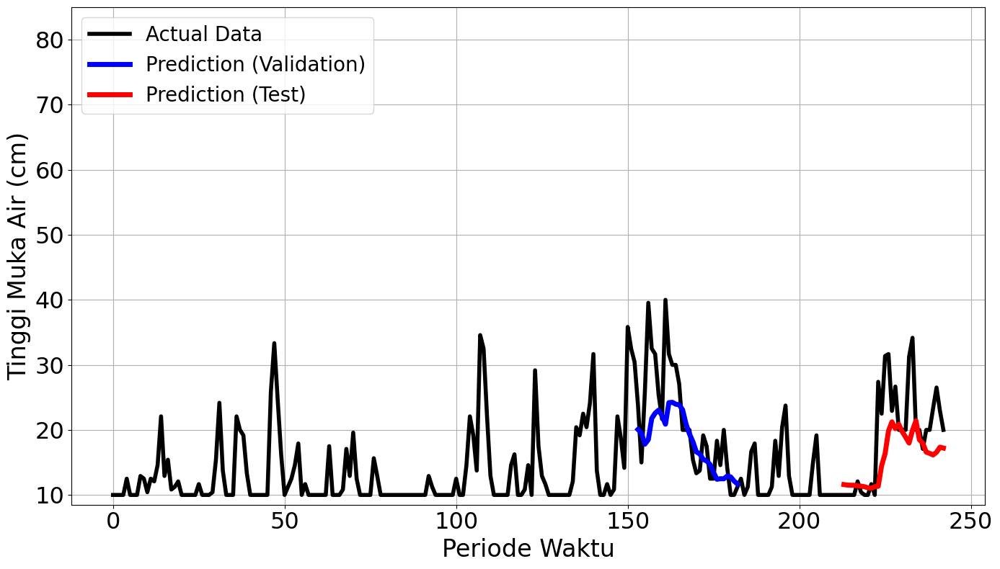

Epoch 1/100


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


6/6 ━━━━━━━━━━━━━━━━━━━━ 6s 200ms/step - loss: 0.1142 - val_loss: 0.0470
Epoch 2/100
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step - loss: 0.0653 - val_loss: 0.0495
Epoch 3/100
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step - loss: 0.0275 - val_loss: 0.0494
Epoch 4/100
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step - loss: 0.0197 - val_loss: 0.0483
Epoch 5/100
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step - loss: 0.0179 - val_loss: 0.0419
Epoch 6/100
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.0141 - val_loss: 0.0420
Epoch 7/100
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.0133 - val_loss: 0.0369
Epoch 8/100
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 80ms/step - loss: 0.0108 - val_loss: 0.0360
Epoch 9/100
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - loss: 0.0127 - val_loss: 0.0397
Epoch 10/100
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - loss: 0.0107 - val_loss: 0.0322
Epoch 11/100
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 78ms/step - loss: 0.0114 - val_loss: 0.0372
Epoch 12/100
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 84ms/step - loss: 0.0112 - val_loss: 0.0306


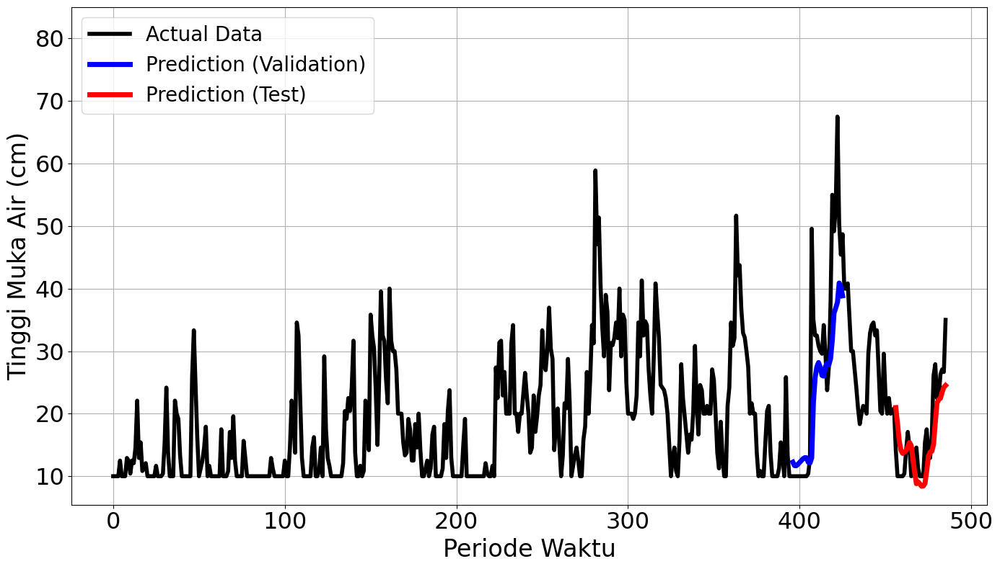

Epoch 1/100


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


10/10 ━━━━━━━━━━━━━━━━━━━━ 7s 132ms/step - loss: 0.1162 - val_loss: 0.0165
Epoch 2/100
10/10 ━━━━━━━━━━━━━━━━━━━━ 1s 51ms/step - loss: 0.0473 - val_loss: 0.0098
Epoch 3/100
10/10 ━━━━━━━━━━━━━━━━━━━━ 1s 53ms/step - loss: 0.0288 - val_loss: 0.0031
Epoch 4/100
10/10 ━━━━━━━━━━━━━━━━━━━━ 1s 55ms/step - loss: 0.0161 - val_loss: 0.0067
Epoch 5/100
10/10 ━━━━━━━━━━━━━━━━━━━━ 1s 53ms/step - loss: 0.0146 - val_loss: 0.0069
Epoch 6/100
10/10 ━━━━━━━━━━━━━━━━━━━━ 1s 54ms/step - loss: 0.0121 - val_loss: 1.7947e-04
Epoch 7/100
10/10 ━━━━━━━━━━━━━━━━━━━━ 1s 54ms/step - loss: 0.0113 - val_loss: 8.6774e-04
Epoch 8/100
10/10 ━━━━━━━━━━━━━━━━━━━━ 1s 53ms/step - loss: 0.0117 - val_loss: 0.0014
Epoch 9/100
10/10 ━━━━━━━━━━━━━━━━━━━━ 1s 55ms/step - loss: 0.0103 - val_loss: 1.6887e-04
Epoch 10/100
10/10 ━━━━━━━━━━━━━━━━━━━━ 1s 56ms/step - loss: 0.0092 - val_loss: 0.0011
Epoch 11/100
10/10 ━━━━━━━━━━━━━━━━━━━━ 1s 54ms/step - loss: 0.0079 - val_loss: 1.8224e-04
Epoch 12/100
10/10 ━━━━━━━━━━━━━━━━━━━━ 1s 57ms

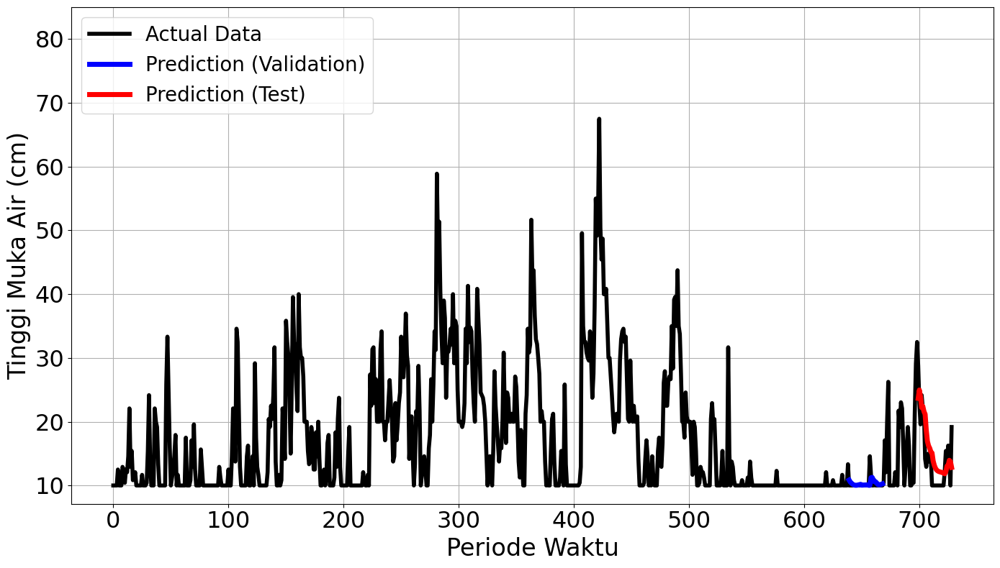

Epoch 1/100


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


13/13 ━━━━━━━━━━━━━━━━━━━━ 7s 114ms/step - loss: 0.1016 - val_loss: 0.0117
Epoch 2/100
13/13 ━━━━━━━━━━━━━━━━━━━━ 2s 52ms/step - loss: 0.0312 - val_loss: 0.0044
Epoch 3/100
13/13 ━━━━━━━━━━━━━━━━━━━━ 1s 52ms/step - loss: 0.0164 - val_loss: 0.0040
Epoch 4/100
13/13 ━━━━━━━━━━━━━━━━━━━━ 1s 53ms/step - loss: 0.0119 - val_loss: 0.0039
Epoch 5/100
13/13 ━━━━━━━━━━━━━━━━━━━━ 1s 51ms/step - loss: 0.0101 - val_loss: 0.0038
Epoch 6/100
13/13 ━━━━━━━━━━━━━━━━━━━━ 1s 65ms/step - loss: 0.0081 - val_loss: 0.0051
Epoch 7/100
13/13 ━━━━━━━━━━━━━━━━━━━━ 1s 63ms/step - loss: 0.0098 - val_loss: 0.0048
Epoch 8/100
13/13 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.0085 - val_loss: 0.0054
Epoch 9/100
13/13 ━━━━━━━━━━━━━━━━━━━━ 1s 58ms/step - loss: 0.0080 - val_loss: 0.0050
Epoch 10/100
12/13 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step - loss: 0.0087Restoring model weights from the end of the best epoch.
13/13 ━━━━━━━━━━━━━━━━━━━━ 1s 54ms/step - loss: 0.0086 - val_loss: 0.0043
Epoch 00010: early stopping
1/1 ━━━━━━━━

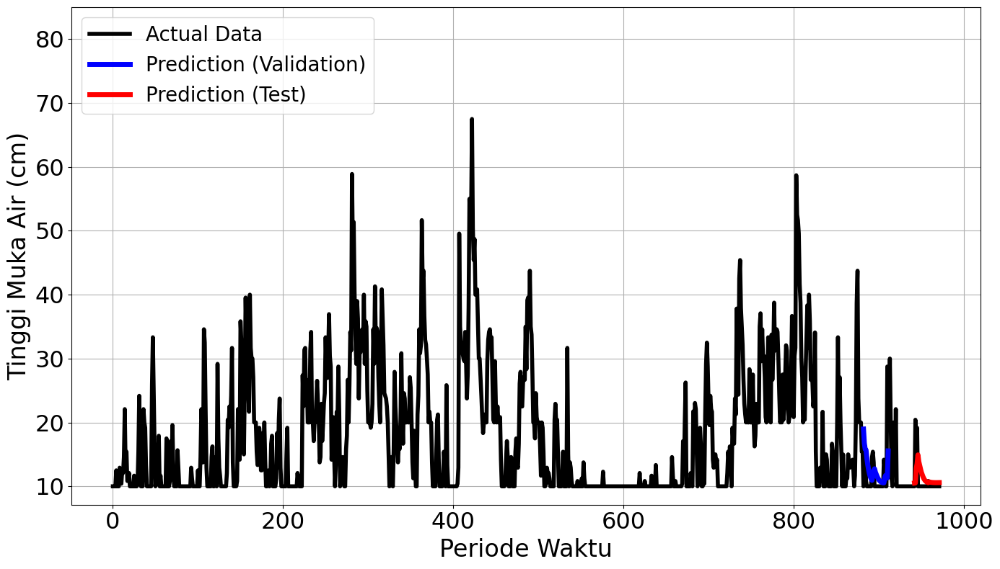

Epoch 1/100


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


17/17 ━━━━━━━━━━━━━━━━━━━━ 7s 91ms/step - loss: 0.1335 - val_loss: 0.0310
Epoch 2/100
17/17 ━━━━━━━━━━━━━━━━━━━━ 2s 53ms/step - loss: 0.0199 - val_loss: 0.0189
Epoch 3/100
17/17 ━━━━━━━━━━━━━━━━━━━━ 1s 52ms/step - loss: 0.0128 - val_loss: 0.0179
Epoch 4/100
17/17 ━━━━━━━━━━━━━━━━━━━━ 1s 56ms/step - loss: 0.0078 - val_loss: 0.0165
Epoch 5/100
17/17 ━━━━━━━━━━━━━━━━━━━━ 1s 55ms/step - loss: 0.0095 - val_loss: 0.0156
Epoch 6/100
17/17 ━━━━━━━━━━━━━━━━━━━━ 1s 49ms/step - loss: 0.0081 - val_loss: 0.0149
Epoch 7/100
17/17 ━━━━━━━━━━━━━━━━━━━━ 1s 51ms/step - loss: 0.0076 - val_loss: 0.0158
Epoch 8/100
17/17 ━━━━━━━━━━━━━━━━━━━━ 1s 51ms/step - loss: 0.0066 - val_loss: 0.0147
Epoch 9/100
17/17 ━━━━━━━━━━━━━━━━━━━━ 1s 50ms/step - loss: 0.0061 - val_loss: 0.0134
Epoch 10/100
17/17 ━━━━━━━━━━━━━━━━━━━━ 1s 50ms/step - loss: 0.0071 - val_loss: 0.0127
Epoch 11/100
17/17 ━━━━━━━━━━━━━━━━━━━━ 1s 50ms/step - loss: 0.0072 - val_loss: 0.0131
Epoch 12/100
17/17 ━━━━━━━━━━━━━━━━━━━━ 1s 50ms/step - loss: 0.0

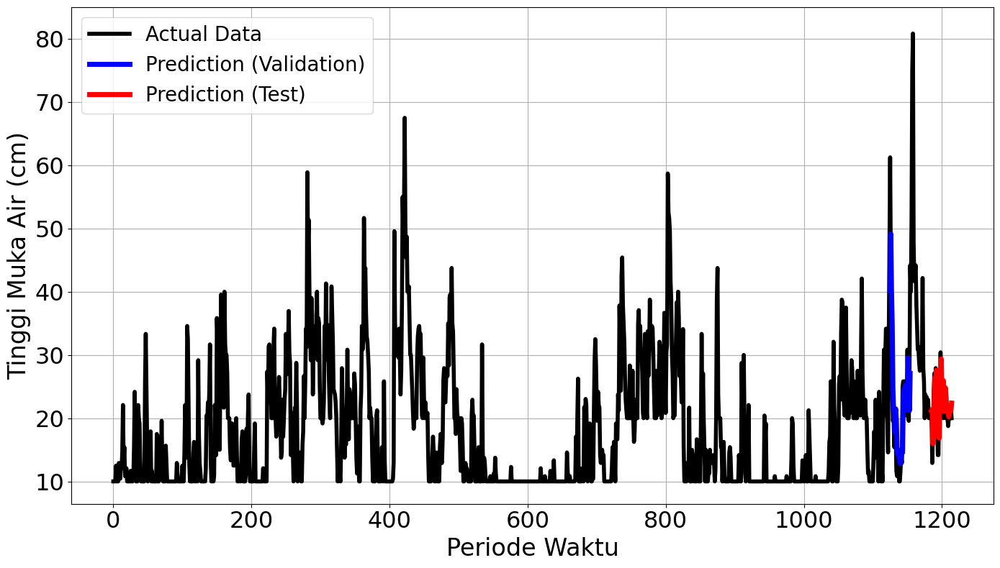

<Figure size 640x480 with 0 Axes>


Final Average MAPE Validation: 0.1825
Final Average MAPE Test: 0.1936
Epoch 1/100


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


1/1 ━━━━━━━━━━━━━━━━━━━━ 6s 6s/step - loss: 0.2733 - val_loss: 0.2117
Epoch 2/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 195ms/step - loss: 0.0907 - val_loss: 0.2352
Epoch 3/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step - loss: 0.0480 - val_loss: 0.1565
Epoch 4/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 312ms/step - loss: 0.0488 - val_loss: 0.0991
Epoch 5/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 161ms/step - loss: 0.0366 - val_loss: 0.0908
Epoch 6/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 320ms/step - loss: 0.0279 - val_loss: 0.0919
Epoch 7/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 306ms/step - loss: 0.0238 - val_loss: 0.0875
Epoch 8/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step - loss: 0.0248 - val_loss: 0.0818
Epoch 9/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 204ms/step - loss: 0.0242 - val_loss: 0.0643
Epoch 10/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 181ms/step - loss: 0.0183 - val_loss: 0.0454
Epoch 11/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 188ms/step - loss: 0.0221 - val_loss: 0.0272
Epoch 12/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 323ms/step - loss: 0.0167 - val_loss:

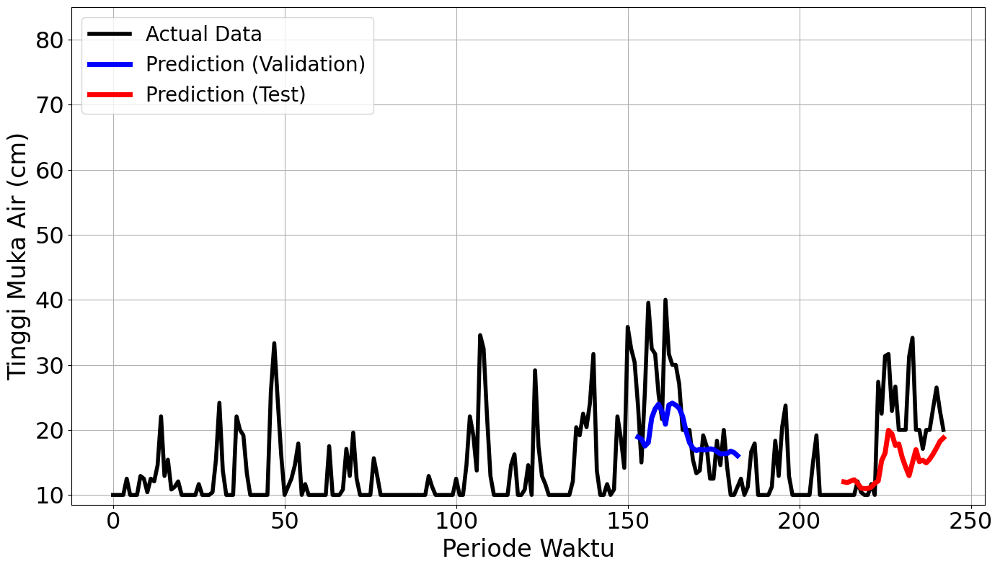

Epoch 1/100


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


3/3 ━━━━━━━━━━━━━━━━━━━━ 6s 457ms/step - loss: 0.2585 - val_loss: 0.0359
Epoch 2/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step - loss: 0.1190 - val_loss: 0.0616
Epoch 3/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 95ms/step - loss: 0.0879 - val_loss: 0.0798
Epoch 4/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step - loss: 0.0493 - val_loss: 0.0577
Epoch 5/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 86ms/step - loss: 0.0453 - val_loss: 0.0516
Epoch 6/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step - loss: 0.0489 Restoring model weights from the end of the best epoch.
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 109ms/step - loss: 0.0476 - val_loss: 0.0501
Epoch 00006: early stopping
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 463ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 88ms/step
mape validation = 36.9315684739395 %
mape test = 155.46485122336796 %


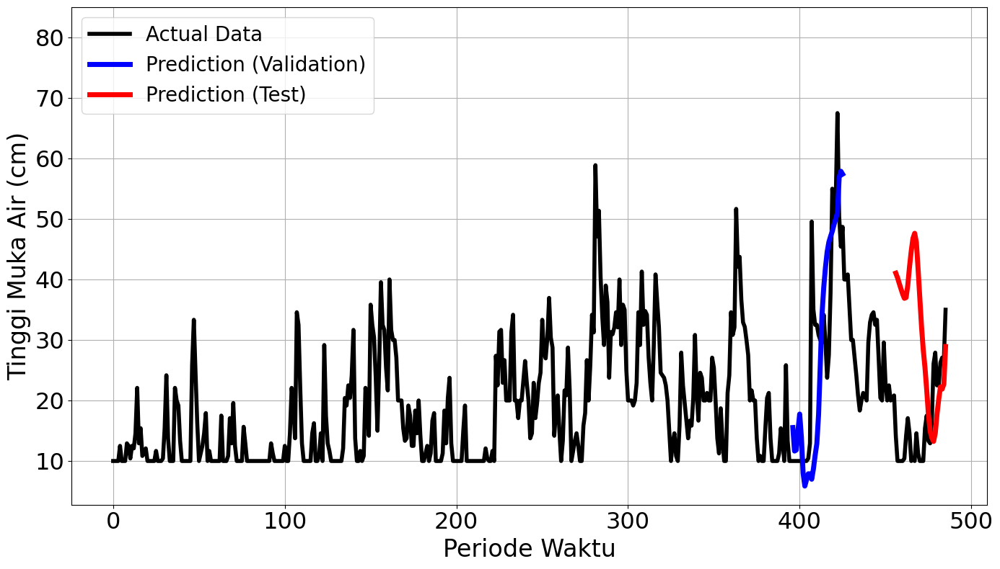

Epoch 1/100


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


5/5 ━━━━━━━━━━━━━━━━━━━━ 6s 286ms/step - loss: 0.1382 - val_loss: 0.0882
Epoch 2/100
5/5 ━━━━━━━━━━━━━━━━━━━━ 2s 74ms/step - loss: 0.0812 - val_loss: 0.0066
Epoch 3/100
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 81ms/step - loss: 0.0915 - val_loss: 0.0175
Epoch 4/100
5/5 ━━━━━━━━━━━━━━━━━━━━ 1s 89ms/step - loss: 0.0486 - val_loss: 4.5698e-04
Epoch 5/100
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 82ms/step - loss: 0.0351 - val_loss: 0.0014
Epoch 6/100
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 84ms/step - loss: 0.0279 - val_loss: 3.0375e-04
Epoch 7/100
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 93ms/step - loss: 0.0165 - val_loss: 6.2651e-04
Epoch 8/100
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 84ms/step - loss: 0.0142 - val_loss: 4.4811e-04
Epoch 9/100
5/5 ━━━━━━━━━━━━━━━━━━━━ 1s 89ms/step - loss: 0.0132 - val_loss: 1.8860e-04
Epoch 10/100
5/5 ━━━━━━━━━━━━━━━━━━━━ 1s 86ms/step - loss: 0.0130 - val_loss: 2.5721e-04
Epoch 11/100
5/5 ━━━━━━━━━━━━━━━━━━━━ 1s 84ms/step - loss: 0.0140 - val_loss: 1.5814e-04
Epoch 12/100
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 86ms/step - loss

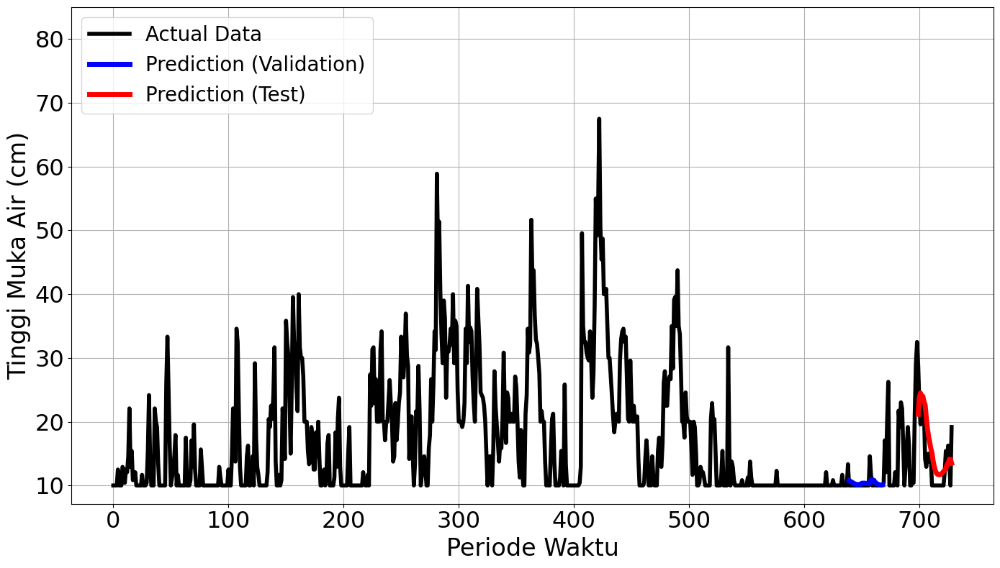

Epoch 1/100


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


7/7 ━━━━━━━━━━━━━━━━━━━━ 7s 185ms/step - loss: 0.1348 - val_loss: 0.0155
Epoch 2/100
7/7 ━━━━━━━━━━━━━━━━━━━━ 1s 72ms/step - loss: 0.0702 - val_loss: 0.0171
Epoch 3/100
7/7 ━━━━━━━━━━━━━━━━━━━━ 1s 77ms/step - loss: 0.0356 - val_loss: 0.0086
Epoch 4/100
7/7 ━━━━━━━━━━━━━━━━━━━━ 1s 74ms/step - loss: 0.0194 - val_loss: 0.0050
Epoch 5/100
7/7 ━━━━━━━━━━━━━━━━━━━━ 1s 78ms/step - loss: 0.0174 - val_loss: 0.0054
Epoch 6/100
7/7 ━━━━━━━━━━━━━━━━━━━━ 1s 73ms/step - loss: 0.0116 - val_loss: 0.0051
Epoch 7/100
7/7 ━━━━━━━━━━━━━━━━━━━━ 1s 74ms/step - loss: 0.0084 - val_loss: 0.0041
Epoch 8/100
7/7 ━━━━━━━━━━━━━━━━━━━━ 1s 75ms/step - loss: 0.0098 - val_loss: 0.0042
Epoch 9/100
7/7 ━━━━━━━━━━━━━━━━━━━━ 1s 72ms/step - loss: 0.0104 - val_loss: 0.0043
Epoch 10/100
7/7 ━━━━━━━━━━━━━━━━━━━━ 1s 78ms/step - loss: 0.0087 - val_loss: 0.0038
Epoch 11/100
7/7 ━━━━━━━━━━━━━━━━━━━━ 1s 77ms/step - loss: 0.0070 - val_loss: 0.0035
Epoch 12/100
7/7 ━━━━━━━━━━━━━━━━━━━━ 1s 75ms/step - loss: 0.0083 - val_loss: 0.0036


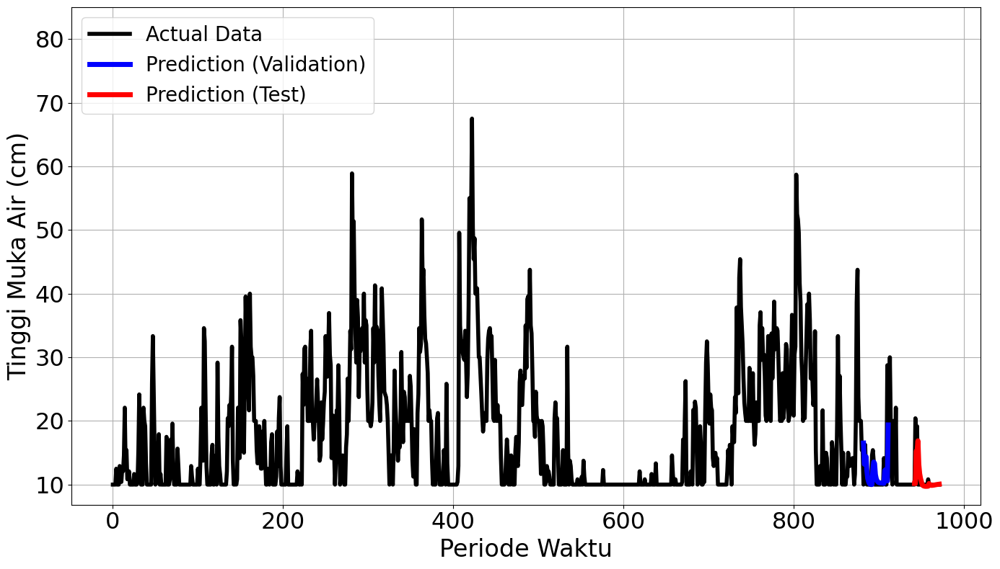

Epoch 1/100


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


9/9 ━━━━━━━━━━━━━━━━━━━━ 6s 164ms/step - loss: 0.1774 - val_loss: 0.0433
Epoch 2/100
9/9 ━━━━━━━━━━━━━━━━━━━━ 2s 74ms/step - loss: 0.0336 - val_loss: 0.0219
Epoch 3/100
9/9 ━━━━━━━━━━━━━━━━━━━━ 1s 78ms/step - loss: 0.0160 - val_loss: 0.0195
Epoch 4/100
9/9 ━━━━━━━━━━━━━━━━━━━━ 1s 89ms/step - loss: 0.0121 - val_loss: 0.0192
Epoch 5/100
9/9 ━━━━━━━━━━━━━━━━━━━━ 1s 82ms/step - loss: 0.0102 - val_loss: 0.0187
Epoch 6/100
9/9 ━━━━━━━━━━━━━━━━━━━━ 1s 93ms/step - loss: 0.0085 - val_loss: 0.0175
Epoch 7/100
9/9 ━━━━━━━━━━━━━━━━━━━━ 1s 73ms/step - loss: 0.0071 - val_loss: 0.0166
Epoch 8/100
9/9 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - loss: 0.0068 - val_loss: 0.0156
Epoch 9/100
9/9 ━━━━━━━━━━━━━━━━━━━━ 1s 74ms/step - loss: 0.0075 - val_loss: 0.0147
Epoch 10/100
9/9 ━━━━━━━━━━━━━━━━━━━━ 1s 73ms/step - loss: 0.0072 - val_loss: 0.0147
Epoch 11/100
9/9 ━━━━━━━━━━━━━━━━━━━━ 1s 72ms/step - loss: 0.0052 - val_loss: 0.0138
Epoch 12/100
9/9 ━━━━━━━━━━━━━━━━━━━━ 1s 75ms/step - loss: 0.0073 - val_loss: 0.0131


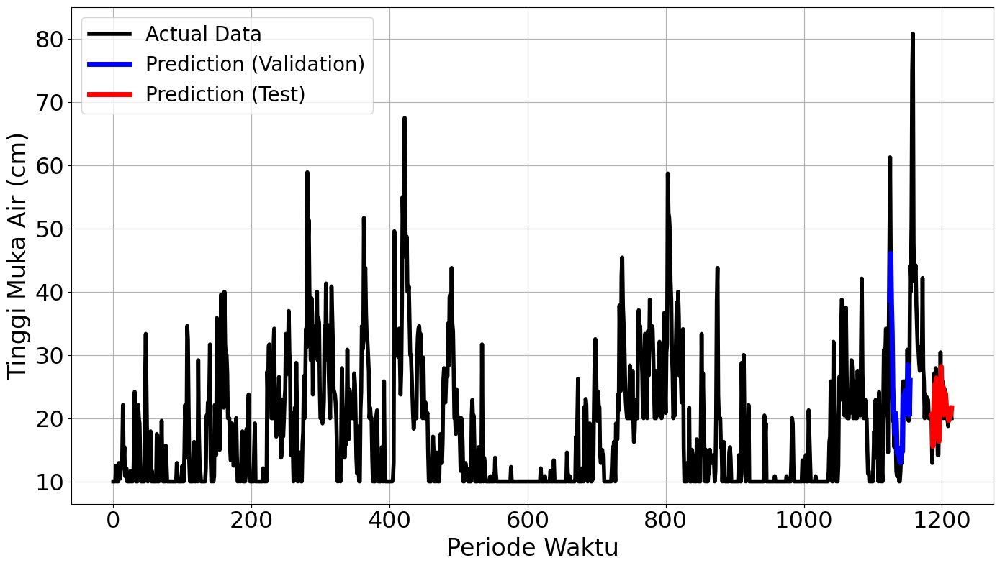

<Figure size 640x480 with 0 Axes>


Final Average MAPE Validation: 0.2031
Final Average MAPE Test: 0.4502
Epoch 1/100


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


1/1 ━━━━━━━━━━━━━━━━━━━━ 6s 6s/step - loss: 0.2733 - val_loss: 0.2117
Epoch 2/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 559ms/step - loss: 0.0907 - val_loss: 0.2352
Epoch 3/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 212ms/step - loss: 0.0480 - val_loss: 0.1565
Epoch 4/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 188ms/step - loss: 0.0488 - val_loss: 0.0991
Epoch 5/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step - loss: 0.0366 - val_loss: 0.0908
Epoch 6/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 148ms/step - loss: 0.0279 - val_loss: 0.0919
Epoch 7/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 151ms/step - loss: 0.0238 - val_loss: 0.0875
Epoch 8/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 334ms/step - loss: 0.0248 - val_loss: 0.0818
Epoch 9/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 303ms/step - loss: 0.0242 - val_loss: 0.0643
Epoch 10/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 153ms/step - loss: 0.0183 - val_loss: 0.0454
Epoch 11/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 178ms/step - loss: 0.0221 - val_loss: 0.0272
Epoch 12/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 187ms/step - loss: 0.0167 - val_loss:

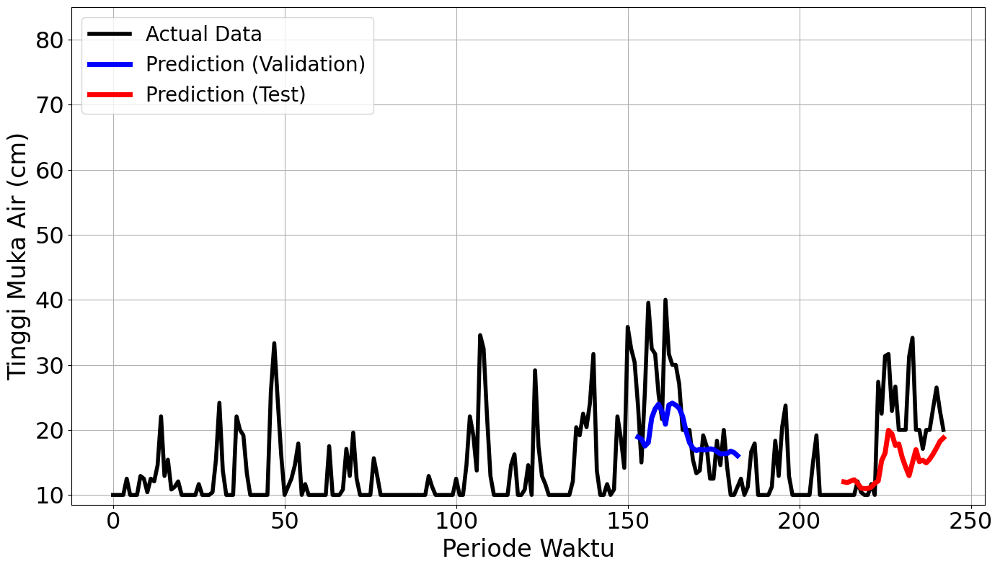

Epoch 1/100


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


3/3 ━━━━━━━━━━━━━━━━━━━━ 6s 449ms/step - loss: 0.2585 - val_loss: 0.0359
Epoch 2/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 100ms/step - loss: 0.1190 - val_loss: 0.0616
Epoch 3/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 88ms/step - loss: 0.0879 - val_loss: 0.0798
Epoch 4/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 105ms/step - loss: 0.0493 - val_loss: 0.0577
Epoch 5/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 90ms/step - loss: 0.0453 - val_loss: 0.0516
Epoch 6/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step - loss: 0.0489Restoring model weights from the end of the best epoch.
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 110ms/step - loss: 0.0476 - val_loss: 0.0501
Epoch 00006: early stopping
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 483ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step
mape validation = 36.9315684739395 %
mape test = 155.46485122336796 %


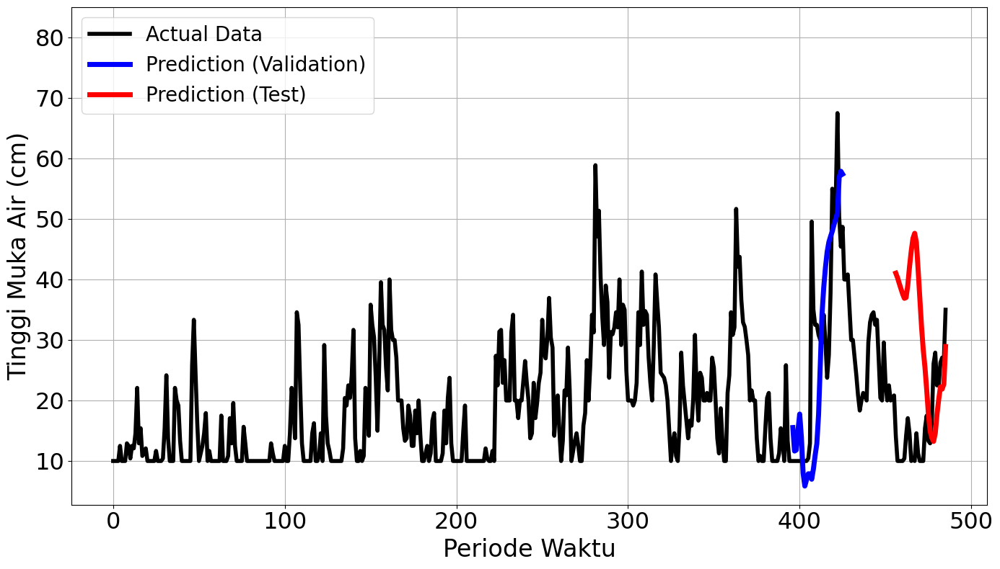

Epoch 1/100


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


5/5 ━━━━━━━━━━━━━━━━━━━━ 10s 260ms/step - loss: 0.1382 - val_loss: 0.0882
Epoch 2/100
5/5 ━━━━━━━━━━━━━━━━━━━━ 1s 81ms/step - loss: 0.0812 - val_loss: 0.0066
Epoch 3/100
5/5 ━━━━━━━━━━━━━━━━━━━━ 1s 93ms/step - loss: 0.0915 - val_loss: 0.0175
Epoch 4/100
5/5 ━━━━━━━━━━━━━━━━━━━━ 1s 89ms/step - loss: 0.0486 - val_loss: 4.5698e-04
Epoch 5/100
5/5 ━━━━━━━━━━━━━━━━━━━━ 1s 86ms/step - loss: 0.0351 - val_loss: 0.0014
Epoch 6/100
5/5 ━━━━━━━━━━━━━━━━━━━━ 1s 84ms/step - loss: 0.0279 - val_loss: 3.0375e-04
Epoch 7/100
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 88ms/step - loss: 0.0165 - val_loss: 6.2651e-04
Epoch 8/100
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 89ms/step - loss: 0.0142 - val_loss: 4.4811e-04
Epoch 9/100
5/5 ━━━━━━━━━━━━━━━━━━━━ 1s 84ms/step - loss: 0.0132 - val_loss: 1.8860e-04
Epoch 10/100
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 83ms/step - loss: 0.0130 - val_loss: 2.5721e-04
Epoch 11/100
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 89ms/step - loss: 0.0140 - val_loss: 1.5814e-04
Epoch 12/100
5/5 ━━━━━━━━━━━━━━━━━━━━ 1s 90ms/step - los

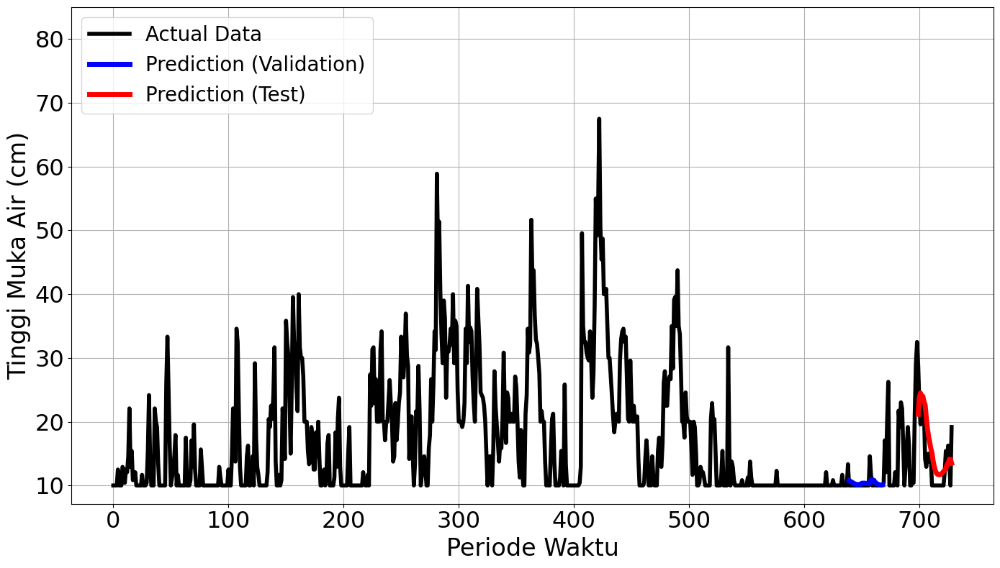

/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


Epoch 1/100
7/7 ━━━━━━━━━━━━━━━━━━━━ 7s 189ms/step - loss: 0.1348 - val_loss: 0.0155
Epoch 2/100
7/7 ━━━━━━━━━━━━━━━━━━━━ 1s 78ms/step - loss: 0.0702 - val_loss: 0.0171
Epoch 3/100
7/7 ━━━━━━━━━━━━━━━━━━━━ 1s 82ms/step - loss: 0.0356 - val_loss: 0.0086
Epoch 4/100
7/7 ━━━━━━━━━━━━━━━━━━━━ 1s 74ms/step - loss: 0.0194 - val_loss: 0.0050
Epoch 5/100
7/7 ━━━━━━━━━━━━━━━━━━━━ 1s 81ms/step - loss: 0.0174 - val_loss: 0.0054
Epoch 6/100
7/7 ━━━━━━━━━━━━━━━━━━━━ 1s 77ms/step - loss: 0.0116 - val_loss: 0.0051
Epoch 7/100
7/7 ━━━━━━━━━━━━━━━━━━━━ 1s 75ms/step - loss: 0.0084 - val_loss: 0.0041
Epoch 8/100
7/7 ━━━━━━━━━━━━━━━━━━━━ 1s 76ms/step - loss: 0.0098 - val_loss: 0.0042
Epoch 9/100
7/7 ━━━━━━━━━━━━━━━━━━━━ 1s 73ms/step - loss: 0.0104 - val_loss: 0.0043
Epoch 10/100
7/7 ━━━━━━━━━━━━━━━━━━━━ 1s 74ms/step - loss: 0.0087 - val_loss: 0.0038
Epoch 11/100
7/7 ━━━━━━━━━━━━━━━━━━━━ 1s 93ms/step - loss: 0.0070 - val_loss: 0.0035
Epoch 12/100
7/7 ━━━━━━━━━━━━━━━━━━━━ 1s 91ms/step - loss: 0.0083 - val_l

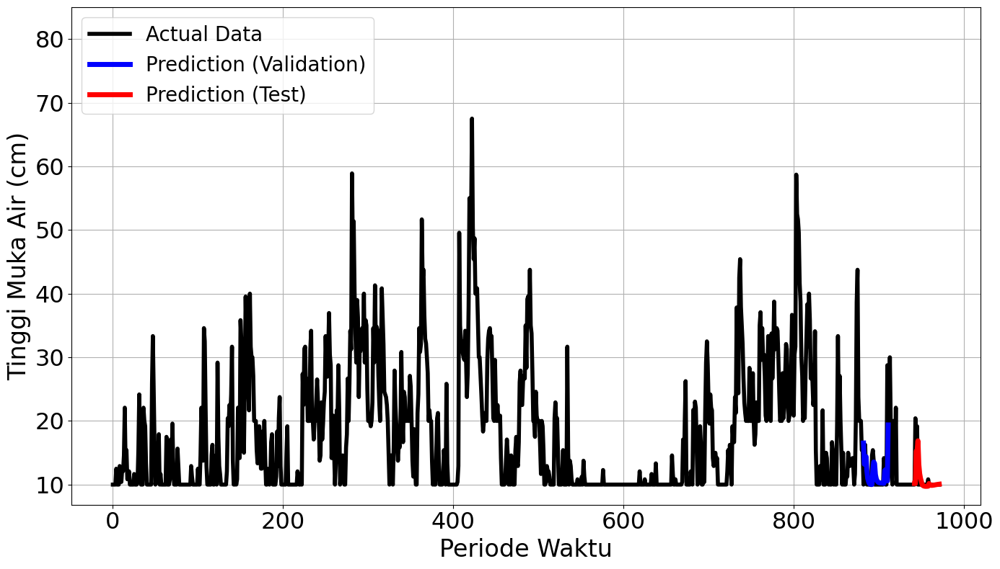

Epoch 1/100


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


9/9 ━━━━━━━━━━━━━━━━━━━━ 7s 167ms/step - loss: 0.1774 - val_loss: 0.0433
Epoch 2/100
9/9 ━━━━━━━━━━━━━━━━━━━━ 2s 77ms/step - loss: 0.0336 - val_loss: 0.0219
Epoch 3/100
9/9 ━━━━━━━━━━━━━━━━━━━━ 1s 72ms/step - loss: 0.0160 - val_loss: 0.0195
Epoch 4/100
9/9 ━━━━━━━━━━━━━━━━━━━━ 1s 74ms/step - loss: 0.0121 - val_loss: 0.0192
Epoch 5/100
9/9 ━━━━━━━━━━━━━━━━━━━━ 1s 73ms/step - loss: 0.0102 - val_loss: 0.0187
Epoch 6/100
9/9 ━━━━━━━━━━━━━━━━━━━━ 1s 72ms/step - loss: 0.0085 - val_loss: 0.0175
Epoch 7/100
9/9 ━━━━━━━━━━━━━━━━━━━━ 1s 73ms/step - loss: 0.0071 - val_loss: 0.0166
Epoch 8/100
9/9 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - loss: 0.0068 - val_loss: 0.0156
Epoch 9/100
9/9 ━━━━━━━━━━━━━━━━━━━━ 1s 76ms/step - loss: 0.0075 - val_loss: 0.0147
Epoch 10/100
9/9 ━━━━━━━━━━━━━━━━━━━━ 1s 74ms/step - loss: 0.0072 - val_loss: 0.0147
Epoch 11/100
9/9 ━━━━━━━━━━━━━━━━━━━━ 1s 74ms/step - loss: 0.0052 - val_loss: 0.0138
Epoch 12/100
9/9 ━━━━━━━━━━━━━━━━━━━━ 1s 73ms/step - loss: 0.0073 - val_loss: 0.0131


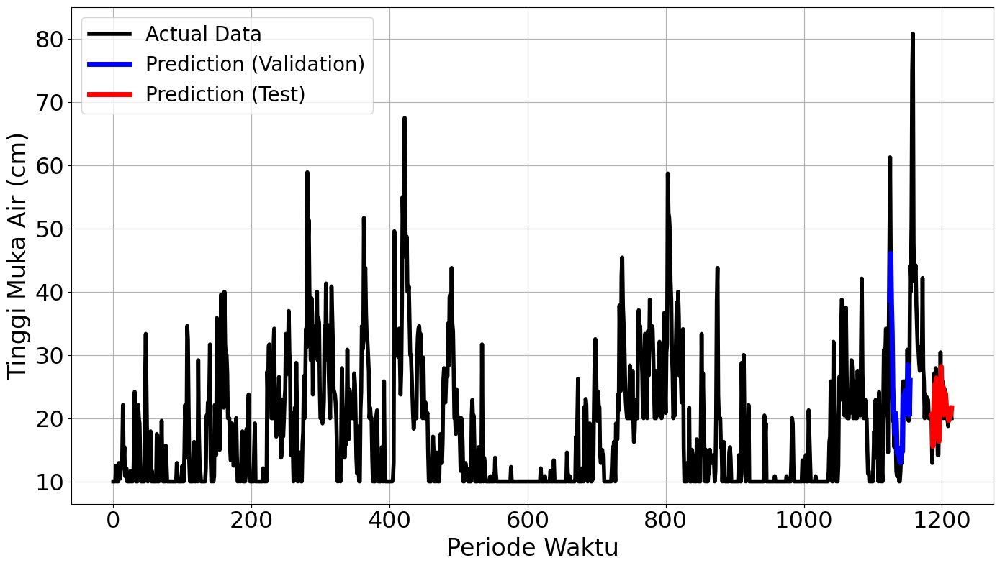

<Figure size 640x480 with 0 Axes>


Final Average MAPE Validation: 0.2031
Final Average MAPE Test: 0.4502


In [10]:
from tensorflow.keras.preprocessing.sequence import TimeseriesGenerator
from sklearn.metrics import mean_squared_error
from tensorflow.keras.optimizers import Adam
import matplotlib.pyplot as plt

# Parameter expanding window
window_size = 243
n_test = 60
n_train_and_val = window_size - n_test
n_train = n_train_and_val - 60
shift = 243
n_windows1 = 5
n_total = len(data_series)
look_back = 30
time_step = 30

import itertools

config_params = {
    "learning_rate" : [0.001, 0.005],
    "batch_size" : [16, 32, 64, 128],
    "neurons" : [50],
    "init_scheme": ['he_uniform', 'glorot_uniform']
}

average_mape_vals_by_param = []
average_mape_tests_by_param = []

for xs in itertools.product(*list(config_params.values())):
  current_param = dict()
  for i, key in enumerate(config_params.keys()):
    if key == "batch_size":
      bsize = xs[i]
    else:
      current_param[key] = xs[i]

  mape_vals = []
  mape_tests = []

  # Simpan nilai asli
  base_n_train = n_train
  base_n_train_and_val = n_train_and_val

  for i in range(n_windows1):
    current_n_train = base_n_train + i * shift
    current_n_train_and_val = base_n_train_and_val + i * shift
    end = current_n_train_and_val + n_test

    if end > n_total:
        print(f"Window {i+1} tidak dapat dibuat karena melebihi batas data.")
        break

    window_data = data_series[:end]  # expanding window
    train_and_val = window_data[:current_n_train_and_val]
    train = train_and_val[:current_n_train]
    val = train_and_val[current_n_train:]
    test = window_data[current_n_train_and_val:]

    try:

          train_generator = TimeseriesGenerator(train, train, length=look_back, batch_size=bsize)

          val_generator = TimeseriesGenerator(val, val, length=look_back, batch_size=bsize)

          test_generator = TimeseriesGenerator(test, test, length=look_back, batch_size=bsize)

          model = create_model(current_param['neurons'], current_param['learning_rate'])

          # model.compile(optimizer='adam', loss='mean_squared_error')

          model.fit(train_generator, epochs=100, validation_data=val_generator, callbacks=[EarlyStoppingAtMinLoss(patience=5)], verbose = 1)

          val_predictions = model.predict(val_generator)
          test_predictions  = model.predict(test_generator)

          val_predictions_descale = scaler.inverse_transform(val_predictions).flatten()
          test_predictions_descale = scaler.inverse_transform(test_predictions).flatten()

          train_actual = scaler.inverse_transform(train).flatten()
          val_actual = scaler.inverse_transform(val).flatten()
          test_actual = scaler.inverse_transform(test).flatten()

          all_actual = np.append(np.append(train_actual, val_actual), test_actual)

          val_true = val[look_back:]
          val_true_descale = scaler.inverse_transform(val_true).flatten()
          mape_val = mean_absolute_percentage_error(val_true_descale, val_predictions_descale)

          test_true = test[look_back:]
          test_true_descale = scaler.inverse_transform(test_true).flatten()
          mape_test = mean_absolute_percentage_error(test_true_descale, test_predictions_descale)

          mape_vals.append(mape_val)
          mape_tests.append(mape_test)

          print(f"mape validation = {mape_val * 100} %")
          print(f"mape test = {mape_test * 100} %")

          # X_actual = np.arange(0, len(train) + len(val) + len(test))
          # X_train = np.arange(0, len(train))
          # X_val = np.arange(len(train) + look_back, len(train) + len(val))
          # X_test = np.arange(len(train) + len(val) + look_back, len(train) + len(val) + len(test))
          X_actual = np.arange(len(train) + len(val) + len(test))
          X_val = np.arange(len(train) + look_back, len(train) + len(val))
          X_test = np.arange(len(train) + len(val) + look_back, len(train) + len(val) + len(test))
          # axs[i].plot(X_actual, all_actual, lw=2, color='black', label='actual data')
          # axs[i].plot(X_val, val_predictions_descale, lw=2.5, color='blue', label='prediction validation')
          # axs[i].plot(X_test, test_predictions_descale, lw=2.5, color='red', label='prediction test')
          # axs[i].set_title(f'Window {i+1}')
          # axs[i].legend(loc='upper left') # legend untuk setiap subplot window
          plt.figure(figsize=(14, 8))
          plt.plot(X_actual, all_actual, lw=4, color='black', label='Actual Data')
          plt.plot(X_val, val_predictions_descale, lw=5, color='blue', label='Prediction (Validation)')
          plt.plot(X_test, test_predictions_descale, lw=5, color='red', label='Prediction (Test)')
          # plt.title(f'Window {i+1}', fontsize=25)
          plt.xlabel('Periode Waktu', fontsize=24)
          plt.ylabel('Tinggi Muka Air (cm)', fontsize=24)
          plt.ylim(top=85)
          plt.tick_params(axis='both', labelsize=23)
          # plt.setp(ax.get_xticklabels(), rotation=0, ha='center')
          plt.legend(loc='upper left', fontsize=20)
          plt.grid(True)
          plt.tight_layout()
          plt.show()

    except Exception as e:
          print(f"Error pada Window {i+1}: {e}")
          continue

  # setelah proses looping selesai
  plt.tight_layout(rect=[0, 0, 1, 0.97])  # agar suptitle tidak ketiban
  plt.show()

  # Rata-rata MAPE akhir
  if mape_vals and mape_tests:
      final_mape_val = np.mean(mape_vals)
      final_mape_test = np.mean(mape_tests)
      print(f"\nFinal Average MAPE Validation: {final_mape_val:.4f}")
      print(f"Final Average MAPE Test: {final_mape_test:.4f}")
      average_mape_vals_by_param.append(final_mape_val)
      average_mape_tests_by_param.append(final_mape_test)

### Hyperparameter Summary (EWCV)

In [11]:
hyperparameter_summary = pd.DataFrame({
    "mape_vals" : average_mape_vals_by_param,
    "mape_tests" : average_mape_tests_by_param
})


hyperparameter_summary.sort_values("mape_tests")

,mape_vals,mape_tests
12,0.182539,0.193581
13,0.182539,0.193581
9,0.197891,0.194742
8,0.197891,0.194742
10,0.207953,0.217042
11,0.207953,0.217042
3,0.261898,0.279019
2,0.261898,0.279019
0,0.213490,0.298256
1,0.213490,0.298256


In [12]:
best_idx = int(hyperparameter_summary.sort_values("mape_tests").index[0])
best_idx

12

In [13]:
parameter_combinations = list(itertools.product(*list(config_params.values())))
best_parameter = parameter_combinations[best_idx]
best_param = dict()
for i, key in enumerate(config_params.keys()):
  best_param[key] = best_parameter[i]
best_param

{'learning_rate': 0.005,
 'batch_size': 64,
 'neurons': 50,
 'init_scheme': 'he_uniform'}

### Best Parameter (EWCV)

In [14]:
best_param = {'learning_rate': 0.005, 'batch_size': 64, 'neurons': 50, 'init_scheme': 'he_uniform'}

In [17]:
from tensorflow.keras.initializers import HeUniform

def create_model(neurons, learning_rate, init_scheme='he_uniform'):
    seed = 42
    np.random.seed(seed)
    tf.random.set_seed(seed)
    random.seed(seed)

    # Tentukan skema inisialisasi bobot
    if init_scheme == 'he_uniform':
        initializer = HeUniform()
    else:
        raise ValueError("init_scheme yang didukung hanya: 'he_uniform'.")

    model = Sequential()
    model.add(LSTM(
        neurons,
        activation='tanh',
        input_shape=(time_step, 1),
        kernel_initializer=initializer,
        recurrent_initializer=initializer
    ))
    model.add(Dropout(0.2))
    model.add(Dense(1, kernel_initializer=initializer))

    optimizer = Adam(learning_rate=learning_rate)
    model.compile(loss='mean_squared_error', optimizer=optimizer)
    return model

In [18]:
from sklearn.metrics import mean_squared_error
from sklearn.preprocessing import MinMaxScaler
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense, Dropout
from tensorflow.keras.optimizers import Adam
import numpy as np

data = pd.read_csv('https://raw.githubusercontent.com/Mluthfialgifari/Tugas-Akhir-Skripsi/refs/heads/main/Data/Data%20TMA%20(Jan%202022%20-%20Mei%202025).csv')
data = data.loc[:, ['Daily_Period', 'TMA_Daily']]
data = data.iloc[:1215].reset_index(drop=True)

train_data = data.iloc[:1095]
val_data = data.iloc[1095:1155]
test_data = data.iloc[1155:]

# Mengambil kolom 'TMA_Daily' sebagai data yang akan diprediksi
time_series_data = data['TMA_Daily'].values.reshape(-1, 1)

# Normalisasi data ke rentang 0-1
scaler = MinMaxScaler()
time_series_data = scaler.fit_transform(time_series_data)

# Menentukan ukuran dataset
train_size = 1095
val_size = 60
test_size = len(time_series_data) - train_size - val_size

# Membagi data menjadi train, val, test
train_data = time_series_data[:train_size]
val_data = time_series_data[train_size:train_size+val_size]
test_data = time_series_data[train_size+val_size:]

# Fungsi untuk membuat dataset dengan sekuens deret waktu
def create_sequences(data, seq_length):
    sequences = []
    for i in range(len(data) - seq_length):
        sequences.append(data[i : i + seq_length])
    return np.array(sequences)

# Panjang sekuens deret waktu
seq_length = 30

# Membuat dataset sekuens
X_train = create_sequences(train_data, seq_length)
X_val = create_sequences(val_data, seq_length)
X_test = create_sequences(test_data, seq_length)

# Memisahkan fitur dan target
y_train = X_train[:, -1]
X_train = X_train[:, :-1]

y_val = X_val[:, -1]
X_val = X_val[:, :-1]

y_test = X_test[:, -1]
X_test = X_test[:, :-1]

# Reshape untuk input LSTM (samples, time steps, features)
X_train = X_train.reshape(X_train.shape[0], X_train.shape[1], 1)
X_val = X_val.reshape(X_val.shape[0], X_val.shape[1], 1)
X_test = X_test.reshape(X_test.shape[0], X_test.shape[1], 1)

model = create_model(best_param['neurons'],
                     best_param['learning_rate'],
                     best_param.get('init_scheme', 'he_uniform')
)
history = model.fit(
    X_train, y_train,
    epochs=100,
    batch_size=64,
    validation_data=(X_val, y_val),
    verbose=10)

Epoch 1/100


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Epoch 2/100
Epoch 3/100
Epoch 4/100
Epoch 5/100
Epoch 6/100
Epoch 7/100
Epoch 8/100
Epoch 9/100
Epoch 10/100
Epoch 11/100
Epoch 12/100
Epoch 13/100
Epoch 14/100
Epoch 15/100
Epoch 16/100
Epoch 17/100
Epoch 18/100
Epoch 19/100
Epoch 20/100
Epoch 21/100
Epoch 22/100
Epoch 23/100
Epoch 24/100
Epoch 25/100
Epoch 26/100
Epoch 27/100
Epoch 28/100
Epoch 29/100
Epoch 30/100
Epoch 31/100
Epoch 32/100
Epoch 33/100
Epoch 34/100
Epoch 35/100
Epoch 36/100
Epoch 37/100
Epoch 38/100
Epoch 39/100
Epoch 40/100
Epoch 41/100
Epoch 42/100
Epoch 43/100
Epoch 44/100
Epoch 45/100
Epoch 46/100
Epoch 47/100
Epoch 48/100
Epoch 49/100
Epoch 50/100
Epoch 51/100
Epoch 52/100
Epoch 53/100
Epoch 54/100
Epoch 55/100
Epoch 56/100
Epoch 57/100
Epoch 58/100
Epoch 59/100
Epoch 60/100
Epoch 61/100
Epoch 62/100
Epoch 63/100
Epoch 64/100
Epoch 65/100
Epoch 66/100
Epoch 67/100
Epoch 68/100
Epoch 69/100
Epoch 70/100
Epoch 71/100
Epoch 72/100
Epoch 73/100
Epoch 74/100
Epoch 75/100
Epoch 76/100
Epoch 77/100
Epoch 78/100
Epoch 7

### Plot Model Loss

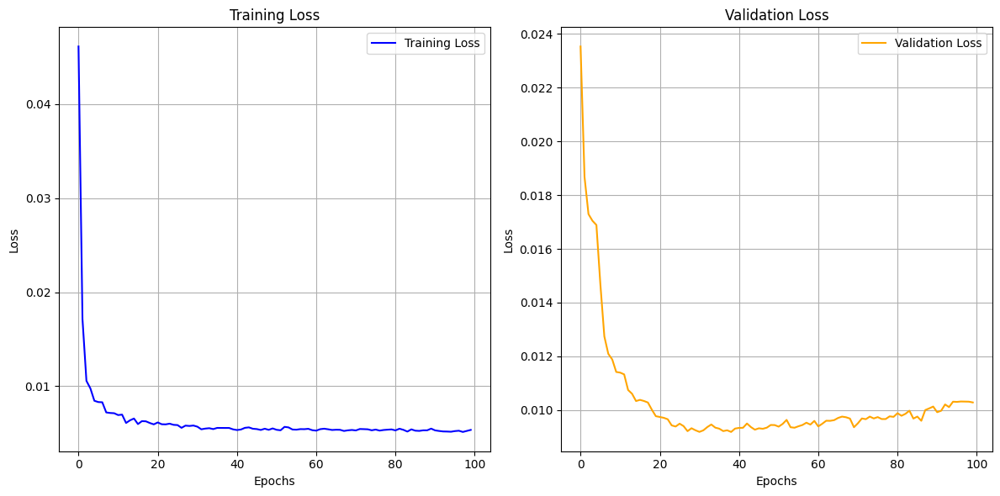

In [19]:
import matplotlib.pyplot as plt

# Membuat subplot 1 baris 2 kolom
fig, axs = plt.subplots(1, 2, figsize=(12, 6))

# Subplot kiri: Training Loss
axs[0].plot(history.history['loss'], label='Training Loss', color='blue')
axs[0].set_title('Training Loss')
axs[0].set_xlabel('Epochs')
axs[0].set_ylabel('Loss')
axs[0].grid(True)
axs[0].legend()

# Subplot kanan: Validation Loss
axs[1].plot(history.history['val_loss'], label='Validation Loss', color='orange')
axs[1].set_title('Validation Loss')
axs[1].set_xlabel('Epochs')
axs[1].set_ylabel('Loss')
axs[1].grid(True)
axs[1].legend()

# Tata letak rapat
plt.tight_layout()
plt.show()

### MAPE Train

In [20]:
def inverse_transform(scaler, input):
  return input * (scaler.data_max_[0] - scaler.data_min_[0]) + scaler.data_min_[0]

# inverse_transform(scaler, predicted)

In [21]:
train_predict = model.predict(X_train).flatten()
train_predict_denorm = inverse_transform(scaler, train_predict)
y_train_denorm = inverse_transform(scaler, y_train)
mape_train = mean_absolute_percentage_error(y_train_denorm, train_predict_denorm)
mape_train

34/34 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step


0.1871294018545945

### Plot Train Actual vs Predicted

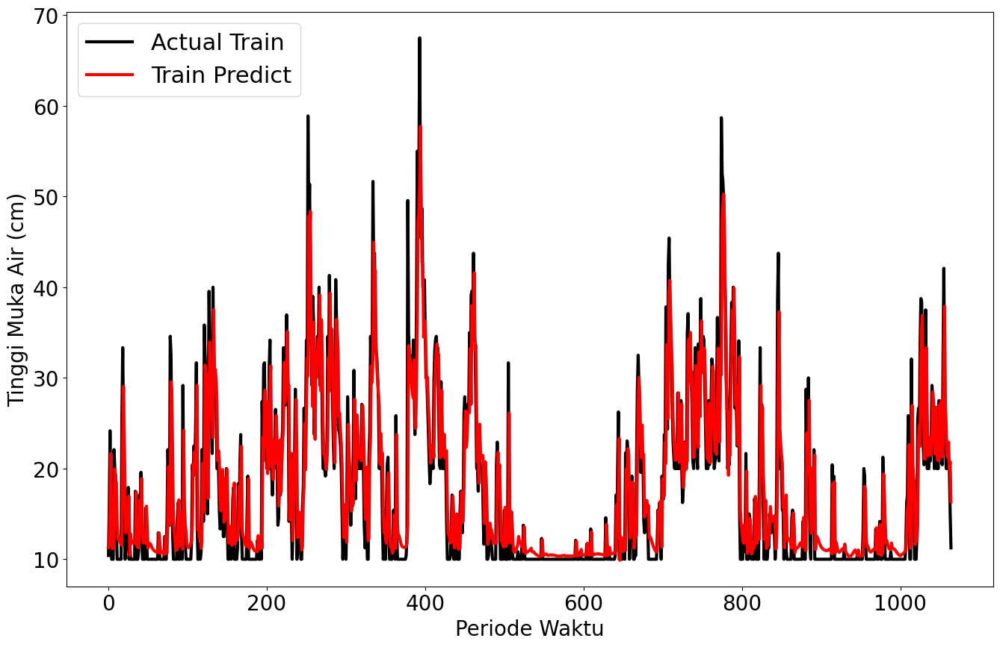

In [22]:
# Plot perbandingan actual train dan train predict

plt.figure(figsize=(16, 10))

plt.plot(y_train_denorm, lw=3, label='Actual Train', color = 'black')
plt.plot(train_predict_denorm, lw=3, label='Train Predict', color = 'red')
# plt.title('Perbandingan Actual Train dan Train Predict')
plt.xticks(fontsize=20)
plt.yticks(fontsize=20)
plt.xlabel('Periode Waktu', fontsize=20)
plt.ylabel('Tinggi Muka Air (cm)', fontsize=20)
plt.legend(loc = 'upper left', fontsize = 22)
plt.show()